# SITE Analysis Notebook

This notebook contains a full analysis workflow for the Serial Imaging of Tumor and microEnvironment (SITE) platform,
including trajectory loading, single-cell feature extraction, signaling dynamics analysis, spatial correlation analysis,
boundary libraries, contact niche characterization, and trajectory embedding.

## Table of Contents
- [Section 1 – Load SITE trajectories and basic metadata](#s1)
- [Section 2 – Extract single-cell data](#s2)
- [Section 3 – ERK C/N dynamics and on/off thresholds](#s3)
- [Section 4 – Spatiotemporal signaling correlations](#s4)
- [Section 5 – Spatiotemporal motility correlations](#s5)
- [Section 6 – ERK "on" neighborhood analysis](#s6)
- [Section 7 – Boundary library](#s7)
- [Section 8 – Contact niche and ERK signaling analysis](#s8)
- [Section 9 – Trajectory embedding and state analysis](#s9)
- [Section 10 – Data-driven modeling](#s10)


---


## Section 1 – Load SITE trajectories and basic metadata <a id="s1"></a>

This section sets up the analysis environment and loads the raw SITE trajectory data used throughout the notebook. It:

- Imports core analysis libraries and helper modules (trajectory handling, image utilities, feature extraction).
- Defines the output folder for this run via a `date` string.
- Specifies which trajectory files to load (`modelNames`, `datapaths`) and where the treatment descriptor lives.
- Reads the Excel treatment descriptor and maps each XY position to a treatment condition.
- Loads trajectory objects, mask channels, and basic metadata from the h5 files.
- Applies quick quality-control filters so that only trajectories with enough cells and stable segmentation are used downstream.


### Overview: Section 1

This section initializes the SITE analysis workflow.

**Biological purpose:**  
Load all raw trajectory data, treatments, metadata, and segmentation-derived features so downstream steps have consistent inputs.

**What happens here:**  
- Import all core Python modules and SITE utilities  
- Define output folder and experiment date  
- Map each XY position to its treatment (e.g., Control vs MEKi)  
- Load each trajectory `.h5` file into memory  
- Extract mask channels, dimensions, metadata such as `micron_per_pixel`  
- Apply early QC to remove problematic trajectories  
- Compute initial cell-level counts to ensure minimum representation  
- Build global indices linking: model → cell → frame → treatment  

**Key Parameters:**  
- `date`: Output directory name  
- `mskchannel`: Which segmentation mask to load  
- `cellnumber_std_cut`: Threshold for segmentation stability  
- `timestep`: Time between frames  
- `fw`: Smoothing window for early cell counts  

**Outputs produced:**  
- Fully loaded `Trajectory` objects in `modelSet`  
- Mappings between XY, treatment, and trajectory indices  
- Initial QC-filtered model indices  



---


In [196]:
# The environment to use here is: celltraj_env
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import sys
import trajectory
import imageprep as imprep
import utilities
import features
import model
import h5py
import pickle
import os
import subprocess
import time
import pyemma.coordinates as coor
import scipy
import csaps
import skimage
from IPython.display import clear_output
import os
from scipy.sparse import csr_matrix
from scipy.sparse.csgraph import connected_components
np.float=np.dtype(float)
np.int=int
import msmtools
import pandas as pd
import itertools
from itertools import chain
import imageprep as imprep
import sklearn
import numpy as np
import umap
green_check = "\033[92m\u2714\033[0m"
red_x = "\033[91m\u274C\033[0m"
sys.path.append('/home/wsltools/programs/dynamical-cell-systems-group/BayesianBootstrap')
import bootstrap
import ray

#### Load File Details

This subsection configures which datasets are included in the analysis and where outputs are written. It:

- Sets a `date` string that is used to create an output subfolder for figures and results.
- Lists the trajectory datasets in `modelNames` and their corresponding folders in `datapaths`.
- Points to the treatment descriptor spreadsheet `treatment_file`, which maps XY positions to treatment labels.
- Prepares color assignments for each treatment condition for later plotting.


##### Parameters: output folder

- **`date`**: A string used to name the output directory for this run. All plots and summary files
  generated later in the notebook are saved under this folder.
- Change this value when you re-run the analysis on a different day or dataset so you don't overwrite previous results.


In [7]:
date = '20251022' 
os.system(f'mkdir -p {date}')

0

##### Parameters: data locations and treatment descriptor

- **`modelNames`**: List of trajectory dataset names (one per h5 file or experiment) that you want to include.
- **`datapaths`**: List of directories where the corresponding h5 files live. Each entry should align with the same-index entry in `modelNames`.
- **`treatment_file`**: Path to the Excel spreadsheet that maps XY positions to treatment labels.
- You can update these to point to a different experiment by changing the dataset names and base paths here.


In [8]:
modelNames = ['20251015_Organoid_Documentation',
             '20251015_Documentation_Lung'] 

datapaths=['/mnt/d/vaibhav/Documentation',
          '/mnt/d/vaibhav/Documentation']

treatment_file = '/mnt/d/vaibhav/Documentation/Documentation_descriptor.xlsx'

colorSet=['blue','red']

We will now load up a treatment index excel file and provide the names and paths to the models for analysis.   
| XY Position  | Treatment          | File                            |
|----------    |----------          |----------                       |
| 0            | Control Organoid   | 20251015_Organoid_Documentation |
| 1            | Control Orgnaoid   | 20251015_Organoid_Documentation |
| 2            | Control Organoid   | 20251015_Organoid_Documentation |
| 3            | Control Organoid   | 20251015_Organoid_Documentation |
| 0            | Control Lung       | 20251015_Documentation_Lung     |
| 1            | Control Lung       | 20251015_Documentation_Lung     |
| 2            | Control Lung       | 20251015_Documentation_Lung     |
| .            | .                  | .                               |

In [9]:
datapaths_to_file_dict = {model: i for i, model in enumerate(modelNames)}

treatment_df = pd.read_excel(treatment_file, header=0)
treatment_df.columns = [ 'XY Position', 'Treatment','File']

tmSet = treatment_df['Treatment'].drop_duplicates().tolist()
nf=len(tmSet)

treatment_to_index = {treatment: index for index, treatment in enumerate(tmSet)}

inds_tmSet = treatment_df['Treatment'].map(treatment_to_index)
inds_tmSet=inds_tmSet.tolist()

print(f'The following treatments were obtained from {treatment_file}:',tmSet)
print("The following are the mapped indices:", inds_tmSet)
print("Dictionary assignment",treatment_to_index)


modelList = []
inds_imagingSet = []
inds_imagingSet_models = []
inds_tmSet_models = []
indexedtreatment = []

for iwell in range(len(treatment_df)):
    ixy = treatment_df.iloc[iwell]['XY Position'] 
    modelname = treatment_df.iloc[iwell]['File']
    idatapath = datapaths_to_file_dict[modelname]
    mlist = imprep.list_images(f'{datapaths[idatapath]}/{modelname}_XY{ixy}_roi*.h5')

    for mstring in mlist:
        modelList.append(mstring)
        inds_imagingSet_models.append(idatapath)
        inds_tmSet_models.append(inds_tmSet[iwell])
        indexedtreatment.append(tmSet[inds_tmSet[iwell]])
        print(f'{green_check} Found model {mstring} Assigned Treatment: {tmSet[inds_tmSet[iwell]]}')

inds_imagingSet_models = np.array(inds_imagingSet_models)
inds_tmSet_models = np.array(inds_tmSet_models)
nmodels = len(modelList)
print(f'{nmodels} models found')

The following treatments were obtained from /mnt/d/vaibhav/Documentation/Documentation_descriptor.xlsx: ['Control Organoid', 'Control Lung']
The following are the mapped indices: [0, 0, 0, 0, 1, 1, 1, 1]
Dictionary assignment {'Control Organoid': 0, 'Control Lung': 1}
✔ Found model /mnt/d/vaibhav/Documentation/20251015_Organoid_Documentation_XY0_roi0.h5 Assigned Treatment: Control Organoid
✔ Found model /mnt/d/vaibhav/Documentation/20251015_Organoid_Documentation_XY0_roi1.h5 Assigned Treatment: Control Organoid
✔ Found model /mnt/d/vaibhav/Documentation/20251015_Organoid_Documentation_XY0_roi2.h5 Assigned Treatment: Control Organoid
✔ Found model /mnt/d/vaibhav/Documentation/20251015_Organoid_Documentation_XY0_roi3.h5 Assigned Treatment: Control Organoid
✔ Found model /mnt/d/vaibhav/Documentation/20251015_Organoid_Documentation_XY1_roi0.h5 Assigned Treatment: Control Organoid
✔ Found model /mnt/d/vaibhav/Documentation/20251015_Organoid_Documentation_XY1_roi1.h5 Assigned Treatment: Cont

##### Parameters: mask channel and trajectory loading

- **`mskchannel`**: Integer index specifying which mask channel to use when loading `/cell_data_m{mskchannel}/` from each h5 file.
  This should match the mask that corresponds to whole-cell segmentation in your SITE workflow.
- If you have multiple mask versions (e.g., different segmentation models), you can switch between them by changing `mskchannel`.
- The loop over `modelList` loads one `Trajectory` object per h5 file and attaches key metadata such as
  mask channel names, fluorescence channels, and basic shape information.


In [10]:
mskchannel=0 #mask channel for cell data
nmodels=len(modelList)
modelSet=[None]*nmodels
indgood_models=np.array([]).astype(int)
for i in range(nmodels): 
    try:
        modelSet[i]=trajectory.Trajectory(h5filename=modelList[i])
        sctm=modelSet[i]

        status=modelSet[i].load_from_h5(f'/cell_data_m{mskchannel}/')
        modelSet[i].get_image_shape()#some missing info, add in to metadata in future
        if hasattr(sctm,'fmsks_cancer'):
            del modelSet[i].fmsks_cancer; del modelSet[i].fmsks_primary #delete off these for memory conservation
            
        cyto_msk_channel=np.where(sctm.mask_channels==np.array(['cyto']).astype('S32'))[0][0]
        rep_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
        bf_img_channel=np.where(sctm.channels==np.array(['BF']).astype('S32'))[0][0]
        erk_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
        foreground_fmskchannel=np.where(sctm.fmask_channels==np.array(['foreground']).astype('S32'))[0][0]
        nuc_fmsk_channel=np.where(sctm.fmask_channels==np.array(['nuc']).astype('S32'))[0][0]

        try: # In our case, the organoid dataset uses CY5 for nuclear stain and lung dataset, DAPI. 
            nuc_img_channel=np.where(sctm.channels==np.array(['DAPI']).astype('S32'))[0][0]
        except IndexError: 
            nuc_img_channel=np.where(sctm.channels==np.array(['CY5']).astype('S32'))[0][0]
        mskchannel=cyto_msk_channel
        
        if status:
            ncells=sctm.cells_indSet.size
            print(f'loaded {sctm.h5filename} with {sctm.mask_channels} mask channels, {sctm.channels} image channels, cell index on {mskchannel} with {ncells} cells') 
        else:
            print(f'cell info on {mskchannel} not found') 
        
        if status:
            attr_name=f'img{erk_img_channel}_m{mskchannel}m{nuc_fmsk_channel}_ratio'

            # ERK C/N Ratio calculation exists ----------------------------------------------------------------------------------------------------------
            if hasattr(sctm,attr_name):
                erkcn=getattr(sctm,attr_name)
                nerkcn=erkcn.size
                print(f'{green_check} ERK features, size {nerkcn}')

                # Tracking data exists ------------------------------------------------------------------------------------------------------------------
                if hasattr(sctm,'linSet'):
                    print(f'{green_check} tracking data')
                    attr_name=f'boundary_library'
                    
                    # Cell boundary, contact features exist ---------------------------------------------------------------------------------------------
                    if hasattr(sctm,attr_name):
                        blib=getattr(sctm,attr_name)
                        maxid=np.max(blib['global_index'])
                        nblib=maxid+1
                        print(f'{green_check} boundary library, nindex {nblib}')

                        nlist=[nerkcn,nblib]#,n_mm]
                        if all(x==nlist[0] for x in nlist):
                            indgood_models=np.append(indgood_models,i)
                            print(f'{green_check} Number of cells tracked for ERK features: {nerkcn},Number of cells tracked for boundary features: {nblib}')
                        else:
                            print(f'{red_x} missing features or index mismatch n_erk: {nerkcn}, n_blib: {nblib}')
    except Exception as e:
            print(e)
            pass


loading /mnt/d/vaibhav/Documentation/20251015_Organoid_Documentation_XY0_roi0.h5
interpreting image as zxyc
interpreting mask as zxyc
loading /mnt/d/vaibhav/Documentation/20251015_Organoid_Documentation_XY0_roi0.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /mnt/d/vaibhav/Documentation/20251015_Organoid_Documentation_XY0_roi0.h5 with [b'cyto'] mask channels, [b'CY5' b'YFP' b'BF'] image channels, cell index on 0 with 62 cells
✔ ERK features, size 62
✔ tracking data
loading /mnt/d/vaibhav/Documentation/20251015_Organoid_Documentation_XY0_roi1.h5
interpreting image as zxyc
interpreting mask as zxyc
loading /mnt/d/vaibhav/Documentation/20251015_Organoid_Documentation_XY0_roi1.h5:/cell_data_m0/
interpreting image as zxyc
interpreting mask as zxyc
loaded /mnt/d/vaibhav/Documentation/20251015_Organoid_Documentation_XY0_roi1.h5 with [b'cyto'] mask channels, [b'CY5' b'YFP' b'BF'] image channels, cell index on 0 with 914 cells
✔ ERK features, size 914
✔ tracking d

In [11]:
nframes=modelSet[0].nt
meancellSet=np.zeros(nmodels)
for i in indgood_models:
    ncells=np.zeros(nframes)
    for iS in range(nframes):
        ncells[iS]=np.sum(modelSet[i].cells_frameSet==iS)
    print(f'model {i} mean cellnumber {np.nanmean(ncells)}')
    meancellSet[i]=np.nanmean(ncells)

ind_enoughcells=np.where(meancellSet>=1.)[0]
indgood_models=np.intersect1d(indgood_models,ind_enoughcells)

model 1 mean cellnumber 12.520547945205479
model 2 mean cellnumber 1.0136986301369864
model 3 mean cellnumber 1.0
model 4 mean cellnumber 1.0
model 5 mean cellnumber 2.1780821917808217
model 6 mean cellnumber 2.6575342465753424
model 7 mean cellnumber 0.3013698630136986
model 8 mean cellnumber 2.0273972602739727
model 11 mean cellnumber 6.013698630136986
model 12 mean cellnumber 1.0
model 13 mean cellnumber 1.9589041095890412
model 14 mean cellnumber 5.534246575342466
model 15 mean cellnumber 4.958904109589041
model 16 mean cellnumber 1.1917808219178083
model 17 mean cellnumber 5.095890410958904
model 18 mean cellnumber 7.890410958904109
model 19 mean cellnumber 7.52054794520548
model 20 mean cellnumber 5.4520547945205475
model 21 mean cellnumber 0.9726027397260274
model 22 mean cellnumber 1.8767123287671232
model 23 mean cellnumber 0.5616438356164384
model 24 mean cellnumber 0.9041095890410958
model 25 mean cellnumber 0.4794520547945205
model 27 mean cellnumber 0.136986301369863
model

##### Parameters: quick quality control on trajectories

In the next cells, basic QC filters are applied so that only stable, well-segmented trajectories are used:

- **Minimum mean cell count**: Trajectories are filtered based on `meancellSet >= 1.0`,
  i.e. keeping only models with at least one cell per frame on average.
- **`timestep`** (`0.33`): Time resolution in hours between frames, used when plotting and smoothing cell counts.
- **`fw`** (`3`): Window size (in frames) used for early-time normalization of cell numbers.
- **`cellnumber_std_cut`** (`0.05`): Threshold on relative fluctuations in cell number over time used to identify
  and exclude trajectories with unstable segmentation.
- You can relax or tighten these filters depending on how noisy or sparse your dataset is.


model 1 mean cellnumber 12.520547945205479
model 2 mean cellnumber 1.0136986301369864
model 3 mean cellnumber 1.0
model 4 mean cellnumber 1.0
model 5 mean cellnumber 2.1780821917808217
model 6 mean cellnumber 2.6575342465753424
model 8 mean cellnumber 2.0273972602739727
model 11 mean cellnumber 6.013698630136986
model 12 mean cellnumber 1.0
model 13 mean cellnumber 1.9589041095890412
model 14 mean cellnumber 5.534246575342466
model 15 mean cellnumber 4.958904109589041
model 16 mean cellnumber 1.1917808219178083
model 17 mean cellnumber 5.095890410958904
model 18 mean cellnumber 7.890410958904109
model 19 mean cellnumber 7.52054794520548
model 20 mean cellnumber 5.4520547945205475
model 22 mean cellnumber 1.8767123287671232
model 28 mean cellnumber 3.6027397260273974
model 29 mean cellnumber 5.273972602739726
model 30 mean cellnumber 3.8493150684931505
model 31 mean cellnumber 1.1095890410958904


/tmp/ipykernel_7906/2224937981.py:24: RuntimeWarning: divide by zero encountered in divide
  splfov=csaps.CubicSmoothingSpline(np.arange(nframes), ncells/ncells[0], smooth=5.e-2)
/tmp/ipykernel_7906/2224937981.py:24: RuntimeWarning: invalid value encountered in divide
  splfov=csaps.CubicSmoothingSpline(np.arange(nframes), ncells/ncells[0], smooth=5.e-2)
/tmp/ipykernel_7906/2224937981.py:32: RuntimeWarning: divide by zero encountered in divide
  cellnumber_set_norm[imodel,:]=np.divide(cellnumber_set[imodel,:],np.mean(cellnumber_set[imodel,0:3]))
/tmp/ipykernel_7906/2224937981.py:32: RuntimeWarning: invalid value encountered in divide
  cellnumber_set_norm[imodel,:]=np.divide(cellnumber_set[imodel,:],np.mean(cellnumber_set[imodel,0:3]))


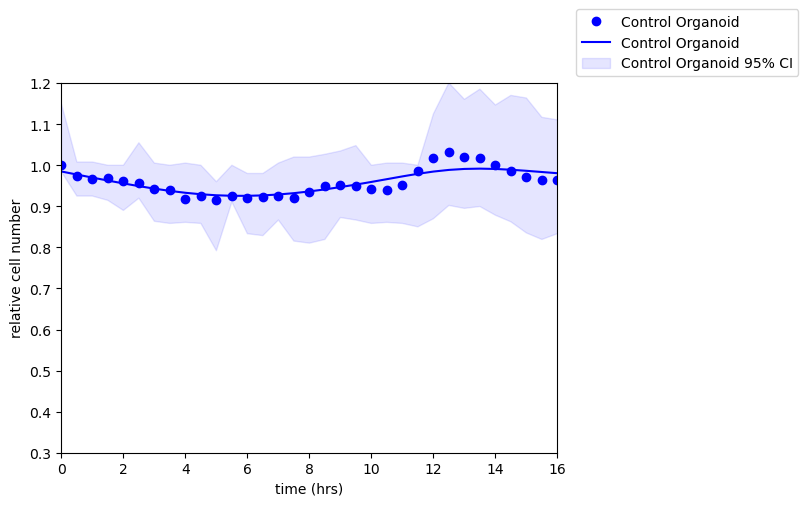

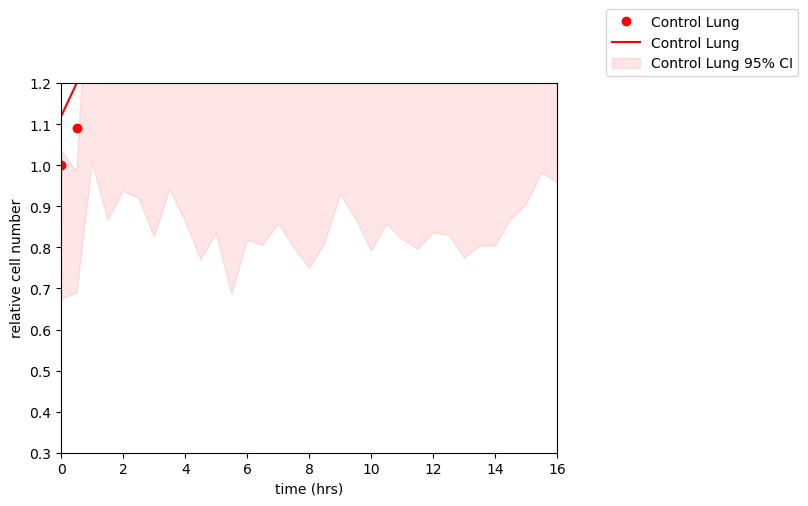

In [13]:
sys.path.append('/home/groups/CEDAR/copperma/dyn-cell-sys/dynamical-cell-systems-group/BayesianBootstrap')
import bootstrap
scipy.average=np.mean
scipy.percentile=np.percentile
#do a quick filtering on models on segmentation stability
import csaps
nframes=modelSet[0].nt
timestep=.5
fw=3
cellnumber_stdSet=np.ones(nmodels)*np.inf
cellnumber_frames=np.arange(int(nframes/2),nframes).astype(int)
cellnumber_std_cut=.05
meancellSet=np.zeros(nmodels)
cellnumber_set=np.ones((nmodels,nframes))*np.nan
cellnumber_set_smooth=[None]*nmodels
for i in indgood_models:
    ncells=np.zeros(nframes)
    ncells_smooth=np.zeros_like(ncells)
    for iS in range(nframes):
        ncells[iS]=np.sum(modelSet[i].cells_frameSet==iS)
    cellnumber_set[i,:]=ncells
    print(f'model {i} mean cellnumber {np.nanmean(ncells)}')
    meancellSet[i]=np.nanmean(ncells)
    splfov=csaps.CubicSmoothingSpline(np.arange(nframes), ncells/ncells[0], smooth=5.e-2)
    cellnumber_set_smooth[i]=splfov
    ncells_smooth=splfov(np.arange(nframes))*np.nanmean(ncells[0:fw])
    cellnumber_std=np.std(ncells[cellnumber_frames]-ncells_smooth[cellnumber_frames])/np.mean(ncells[cellnumber_frames])
    cellnumber_stdSet[i]=cellnumber_std
    
cellnumber_set_norm=np.zeros_like(cellnumber_set)
for imodel in range(nmodels):
    cellnumber_set_norm[imodel,:]=np.divide(cellnumber_set[imodel,:],np.mean(cellnumber_set[imodel,0:3]))
    
cellnumber_set_norm[cellnumber_set_norm==np.inf]=np.nan
cellnumber_tmSet=np.zeros((nf,nframes))
cellnumber_bounds=np.zeros((nf,nframes,2))
for i_tm in range(nf):
    plt.figure()
    ax=plt.gca()
    indmodels=np.where(inds_tmSet_models==i_tm)[0]
    indmodels=np.intersect1d(indmodels,indgood_models)
    cellnumber_tmSet[i_tm,:]=np.nanmean(cellnumber_set_norm[indmodels,:],axis=0)
    for iframe in range(nframes):
        uf=iframe+fw
        if uf>nframes:
            uf=nframes
        cellnumber_tmSet[i_tm,iframe]=np.nanmean(cellnumber_tmSet[i_tm,iframe:uf])
    for iframe in range(nframes):
        cns=cellnumber_set_norm[indmodels,iframe]
        cns=cns[np.isfinite(cns)]
        cellnumber_bounds[i_tm,iframe,:]=bootstrap.get_CI(cns,1000)
    ax.plot(np.arange(nframes)*timestep,cellnumber_tmSet[i_tm,:],'o',color=colorSet[i_tm],label=tmSet[i_tm])
    spl=csaps.CubicSmoothingSpline(np.arange(nframes)*timestep, cellnumber_tmSet[i_tm,:], smooth=5.e-2)
    ax.plot(np.arange(nframes)*timestep,spl(np.arange(nframes)*timestep),'-',color=colorSet[i_tm],label=tmSet[i_tm])
    ax.fill_between(np.arange(nframes)*timestep,cellnumber_bounds[i_tm,:,0],cellnumber_bounds[i_tm,:,1],color=colorSet[i_tm],alpha=.1,label=f'{tmSet[i_tm]} 95% CI')
    plt.ylabel('relative cell number')
    plt.xlabel('time (hrs)')
    plt.ylim(0.3,1.2)
    plt.xlim(0,16)
    plt.legend(bbox_to_anchor=(1.5, 1.0))
    plt.savefig(f'{date}/{tmSet[i_tm]}_cellnumber.svg')

## Section 2 – Extract single-cell data

This section extracts per-cell features from the loaded SITE trajectories. Typical operations include:

- Iterating over models and XY positions to build single-cell tables.
- Computing nuclear and cytoplasmic intensities, ERK C/N ratios, and geometric features.
- Compiling these features into analysis-ready data structures (e.g., pandas DataFrames or numpy arrays).


### Overview: Section 2

This section extracts all single-cell features across all models and all frames.

**Biological purpose:**  
Convert raw SITE trajectories into cell-level feature tables incorporating geometry, intensity, ERK ratios, motility, and tracking identity.

**What happens here:**  
- Construct index arrays linking each cell to its model, treatment, and frame  
- Compute **centroid displacement**, displacement vectors, and scaled motility features  
- Reference imaging channels (e.g., DAPI, CY5, YFP) per model  
- Compute ERK **cytoplasmic-to-nuclear (C/N) ratio** per cell  
- Append ERK C/N signals into a master feature vector `Xpca`  
- Attach features to each `Trajectory` object  

**Key Parameters:**  
- Channel naming conventions (e.g., `'YFP'` for ERK reporter)  
- `sctm.zscale` and `micron_per_pixel` for displacement scaling  

**Outputs produced:**  
- Global feature arrays  
- Per-model PCA-ready matrices  
- ERK C/N ratio vectors  



---


### Extract single-cell data

In this section, single-cell features are extracted from the loaded trajectories and organized into analysis-ready tables.


In [14]:
#establish indices over cells in models
indtreatment=np.array([]).astype(int)
indcellSet=np.array([]).astype(int)
indcells_models=np.array([]).astype(int)
indframes_models=np.array([]).astype(int)
for i in indgood_models:
    indtreatment=np.append(indtreatment,inds_tmSet_models[i]*np.ones(modelSet[i].cells_indSet.size).astype(int))
    indcellSet=np.append(indcellSet,modelSet[i].cells_indSet)
    indcells_models=np.append(indcells_models,i*np.ones(modelSet[i].cells_indSet.size).astype(int))
    indframes_models=np.append(indframes_models,modelSet[i].cells_frameSet)


In [15]:
#calculate centroid displacements
for i in indgood_models:
    modelSet[i].dx=np.zeros(modelSet[i].cells_indSet.size)
    modelSet[i].dxv=np.zeros((modelSet[i].cells_indSet.size,modelSet[i].ndim))
    for icell in range(modelSet[i].cells_indSet.size):
        modelSet[i].dx[icell]=np.linalg.norm(modelSet[i].get_dx(icell)*[sctm.zscale,1.,1.])*sctm.micron_per_pixel
        modelSet[i].dxv[icell,:]=modelSet[i].get_dx(icell)

In [16]:
#signaling features
cratio_erk=np.array([]).astype(float)
channel_names={}
for i in indgood_models:
    sctm=modelSet[i]
    channel_names[i]=sctm.channels.astype(str)
    if 'DAPI' in channel_names[i]:
        nuc_img_channel=np.where(sctm.channels==np.array(['DAPI']).astype('S32'))[0][0]
    elif 'CY5' in channel_names[i]:   
        nuc_img_channel=np.where(sctm.channels==np.array(['CY5']).astype('S32'))[0][0]
            
    rep_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
    erk_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
    attr_str=f'img{erk_img_channel}_m{cyto_msk_channel}m{nuc_fmsk_channel}_ratio'
    cc=getattr(sctm,attr_str)
    cratio_erk=np.append(cratio_erk,cc)

cratio_erk_std=np.nanstd(cratio_erk);cratio_erk_mean=np.nanmean(cratio_erk);#cratio_akt=imprep.znorm(cratio_akt)

for i in indgood_models:
    sctm=modelSet[i]
    channel_names[i]=sctm.channels.astype(str)
    if 'DAPI' in channel_names[i]:
        nuc_img_channel=np.where(sctm.channels==np.array(['DAPI']).astype('S32'))[0][0]
    elif 'CY5' in channel_names[i]:   
        nuc_img_channel=np.where(sctm.channels==np.array(['CY5']).astype('S32'))[0][0]
            
    rep_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
    erk_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
    attr_str=f'img{erk_img_channel}_m{cyto_msk_channel}m{nuc_fmsk_channel}_ratio'
    cc=getattr(sctm,attr_str)
    cratio_z_model=cc
    modelSet[i].x_signal=cratio_z_model.copy()


## Section 3 – ERK C/N dynamics and on/off thresholds

In this section, ERK nuclear-to-cytoplasmic (C/N) ratio dynamics are examined over time to define 'on' and 'off' thresholds.
The analysis typically:

- Aggregates ERK C/N trajectories across cells and conditions.
- Visualizes distributions and time courses of ERK activity.
- Chooses cutoff values that separate baseline from activated ERK signaling.


### Overview: Section 3

This section analyzes ERK C/N dynamics across treatments and time.

**Biological purpose:**  
Identify meaningful thresholds that distinguish ERK “on” vs “off” states across single cells.

**What happens here:**  
- Aggregate ERK C/N across all cells and models  
- Smooth signals using cubic splines  
- Compute eigenvalue-based descriptors of ERK distribution  
- Determine low-cut, mid-cut, and high-cut thresholds  
- Assign ERK “on/off” binary state using `scut`  

**Key Parameters:**  
- `lowcut`, `highcut`, `midcut`: activation thresholds  
- Number of bins for histogramming  
- Smoothing parameters for csaps splines  

**Outputs produced:**  
- ERK activation thresholds  
- `modelSet[i].sigState` binary on/off arrays  



---


#### Examine ERK c/n ratio dynamics to obtain on/off cutoffs

This subsection examines ERK C/N ratio trajectories to define thresholds that separate baseline from activated ERK states.


In [17]:
feature_list=[]
Xpca=np.zeros((cratio_erk.size,0)) #use this if you want to leave out pca morphology features

#   feature_list.append(com_feature_list[i].decode())

Xpca=np.concatenate((Xpca,cratio_erk[:,np.newaxis]),axis=1)
feature_list.append('erk c/n ratio')

print(feature_list)

for i in indgood_models:
   indsf=np.where(indcells_models==i)[0]
   modelSet[i].Xpca=Xpca[indsf,:]

['erk c/n ratio']


In [18]:
#Map all trajectories
all_trajSet=[None]*nmodels
for i in indgood_models:
    modelSet[i].get_unique_trajectories()
    all_trajSet[i]=modelSet[i].trajectories.copy()

tracked cell 752, 1 tracks, 300 left
tracked cell 0, 1 tracks, 0 left
tracked cell 0, 1 tracks, 0 left
tracked cell 72, 73 tracks, 0 left
tracked cell 72, 73 tracks, 0 left
tracked cell 22, 8 tracks, 0 left
tracked cell 124, 50 tracks, 0 left
tracked cell 119, 2 tracks, 0 left
tracked cell 18, 4 tracks, 0 left
tracked cell 72, 73 tracks, 0 left
tracked cell 16, 6 tracks, 0 left
tracked cell 263, 40 tracks, 100 left
tracked cell 0, 1 tracks, 0 left
tracked cell 5, 1 tracks, 0 left
tracked cell 43, 43 tracks, 0 left
tracked cell 5, 2 tracks, 0 left
tracked cell 567, 73 tracks, 300 left
tracked cell 515, 63 tracks, 200 left
tracked cell 1, 1 tracks, 0 left
tracked cell 2, 1 tracks, 0 left
tracked cell 13, 3 tracks, 0 left
tracked cell 23, 2 tracks, 0 left
tracked cell 10, 3 tracks, 0 left
tracked cell 14, 1 tracks, 0 left
tracked cell 11, 4 tracks, 0 left
tracked cell 6, 3 tracks, 0 left


In [19]:
trajl=1
ndim=modelSet[indgood_models[0]].Xpca.shape[1]
Xpcat=np.zeros((0,ndim*trajl))
indmodel_traj=np.array([]).astype(int)
indstack_traj=np.array([]).astype(int)
indframes_traj=np.array([]).astype(int)
cellinds0_traj=np.array([]).astype(int)
cellinds1_traj=np.array([]).astype(int)
for i in indgood_models:
    print('building trajectory data for model {}...'.format(i))
    modelSet[i].trajectories=all_trajSet[i].copy()
    modelSet[i].trajl=trajl
    modelSet[i].traj=modelSet[i].get_traj_segments(trajl)
    data=modelSet[i].Xpca[modelSet[i].traj,:]
    data=data.reshape(modelSet[i].traj.shape[0],modelSet[i].Xpca.shape[1]*trajl)
    indgood=np.where(np.sum(np.isnan(data),axis=1)==0)[0]
    data=data[indgood,:]
    modelSet[i].traj=modelSet[i].traj[indgood,:]
    Xpcat=np.append(Xpcat,data,axis=0)
    indmodel_traj=np.append(indmodel_traj,i*np.ones(data.shape[0]).astype(int))
    indframes=modelSet[i].cells_frameSet[modelSet[i].traj[:,0]]
    indframes_traj=np.append(indframes_traj,indframes)
    cellinds0=modelSet[i].traj[:,0]
    cellinds0_traj=np.append(cellinds0_traj,cellinds0)
    cellinds1=modelSet[i].traj[:,-1]
    cellinds1_traj=np.append(cellinds1_traj,cellinds1)

cellinds0_traj=cellinds0_traj.astype(int)
cellinds1_traj=cellinds1_traj.astype(int)

building trajectory data for model 1...
building trajectory data for model 2...
building trajectory data for model 3...
building trajectory data for model 4...
building trajectory data for model 5...
building trajectory data for model 6...
building trajectory data for model 8...
building trajectory data for model 11...
building trajectory data for model 12...
building trajectory data for model 13...
building trajectory data for model 14...
building trajectory data for model 15...
building trajectory data for model 16...
building trajectory data for model 17...
building trajectory data for model 18...
building trajectory data for model 19...
building trajectory data for model 20...
building trajectory data for model 22...
building trajectory data for model 28...
building trajectory data for model 29...
building trajectory data for model 30...
building trajectory data for model 31...


In [20]:
x=Xpcat #x=np.matmul(Xpcat,np.real(M)) #x=np.concatenate((np.real(np.matmul(Xpcat,M)),np.imag(np.matmul(Xpcat,M))),axis=1) #x=np.concatenate((np.real(phi_X[:,indmodes_M1]),np.imag(phi_X[:,indmodes_M1])),axis=1)
for i in indgood_models:
    modelSet[i].trajectories=all_trajSet[i].copy()

neigen=x.shape[1]
inds_conditions=[None]*nf
for imf in range(nf):
    indmodels=np.intersect1d(indgood_models,np.where(inds_tmSet_models==imf)[0])
    indstm=np.array([])
    for imodel in indmodels:
        indtm=np.where(indmodel_traj==imodel)
        indstm=np.append(indstm,indtm)
    inds_conditions[imf]=indstm.astype(int).copy()

neigen=x.shape[1]
inds_conditions=[None]*nf
for imf in range(nf):
    indmodels=np.intersect1d(indgood_models,np.where(inds_tmSet_models==imf)[0])
    indstm=np.array([])
    for imodel in indmodels:
        indtm=np.where(indmodel_traj==imodel)
        indstm=np.append(indstm,indtm)
    inds_conditions[imf]=indstm.astype(int).copy()

#get transitions in the trajectory embedding space
x0set=np.zeros((0,neigen))
x1set=np.zeros((0,neigen))
inds_trajsteps_models=np.array([]).astype(int)
inds_trajsteps=np.zeros((0,2)).astype(int)
for i in indgood_models:
    print('getting flows from model: '+str(i))
    indstm=np.where(indmodel_traj==i)[0]
    if indstm.size>0:
        modelSet[i].Xtraj=x[indstm,0:neigen]
        indstm_model=indstm-np.min(indstm) #index in model
        modelSet[i].get_trajectory_steps(inds=None,get_trajectories=False,traj=modelSet[i].traj[indstm_model,:],Xtraj=modelSet[i].Xtraj[indstm_model,:])
        x0=modelSet[i].Xtraj0
        x1=modelSet[i].Xtraj1
        x0set=np.append(x0set,x0,axis=0)
        x1set=np.append(x1set,x1,axis=0)
        inds_trajsteps_models=np.append(inds_trajsteps_models,np.ones(x0.shape[0]).astype(int)*i)
        inds_trajsteps=np.append(inds_trajsteps,modelSet[i].inds_trajp1,axis=0)

getting flows from model: 1
matching up trajectory 0
matching up trajectory 100
matching up trajectory 200
matching up trajectory 300
matching up trajectory 400
matching up trajectory 500
matching up trajectory 600
matching up trajectory 700
matching up trajectory 800
getting flows from model: 2
matching up trajectory 0
getting flows from model: 3
matching up trajectory 0
getting flows from model: 4
matching up trajectory 0
getting flows from model: 5
matching up trajectory 0
matching up trajectory 100
getting flows from model: 6
matching up trajectory 0
matching up trajectory 100
getting flows from model: 8
matching up trajectory 0
matching up trajectory 100
getting flows from model: 11
matching up trajectory 0
matching up trajectory 100
matching up trajectory 200
matching up trajectory 300
matching up trajectory 400
getting flows from model: 12
matching up trajectory 0
getting flows from model: 13
matching up trajectory 0
matching up trajectory 100
getting flows from model: 14
matchi

In [21]:
ncc=41
cc0set=x0set.copy();cc1set=x1set.copy()
ccbins=np.linspace(0.,3.,ncc) #np.min(cc0set[inds_trajsteps0]),np.max(np.log2(20.)),ncc) #cc0set[inds_trajsteps0]),ncc)
clusters_cc=coor.clustering.AssignCenters(ccbins[:,np.newaxis], metric='euclidean')
Pcc=model.get_transition_matrix(cc0set,cc1set,clusters=clusters_cc)
Hcc=.5*(Pcc+np.transpose(Pcc))+.5j*(Pcc-np.transpose(Pcc))
w,v=np.linalg.eig(Hcc)
w=np.real(w)
indsort=np.argsort(w)
w=w[indsort]
v=v[:,indsort]
w_orig=w.copy()
indnonstationary=np.setdiff1d(np.arange(ncc).astype(int),np.where(w==1.)[0])
w=w[indnonstationary]
v=v[:,indnonstationary]

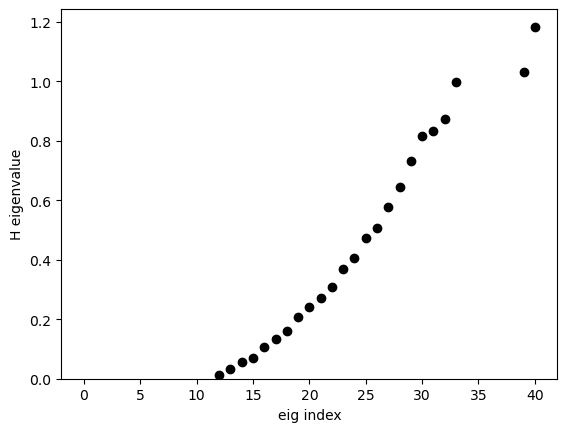

In [22]:
plt.clf() #examine transition matrix spectra for dominant eigenmodes
plt.plot(np.arange(ncc)[indnonstationary],w,'ko',label='eigenvalues')
plt.ylim(.0,np.max(w)+.05*np.max(w))
plt.xlabel('eig index')
plt.ylabel('H eigenvalue')
plt.pause(.1)

Eigenvalues here represent importance of the dynamical mode.  
Here, we are just trying to look to inform what a good cut off would be for ERK ON and ERK OFF. 

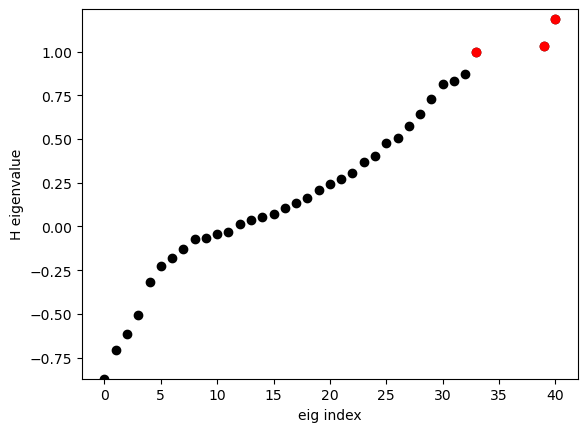

In [24]:
ncomp=3 #number of eigencomponents to keep
vr=np.multiply(w[-ncomp:],np.real(v[:,-ncomp:]))
vi=np.multiply(w[-ncomp:],np.imag(v[:,-ncomp:]))
vkin=np.append(vr,vi,axis=1)
va=np.abs(v[:,-ncomp:])
vkin=np.append(vr,vi,axis=1)
vth=np.arctan2(vr,vi)
plt.clf()
plt.plot(np.arange(ncc)[indnonstationary],w,'ko',label='eigenvalues')
plt.plot(np.arange(ncc)[indnonstationary][-ncomp:],w[-ncomp:],'ro')
plt.ylim(np.min(w),np.max(w)+.05*np.max(w))
plt.xlabel('eig index')
plt.ylabel('H eigenvalue')
plt.savefig(f'{date}/eigenvalues_signaling.svg')
plt.pause(.1)

<Figure size 640x480 with 0 Axes>

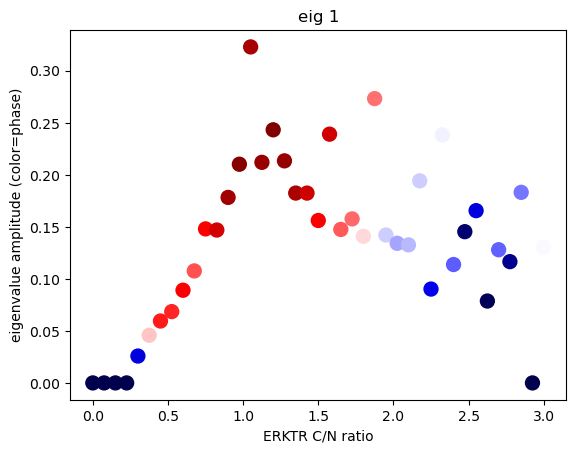

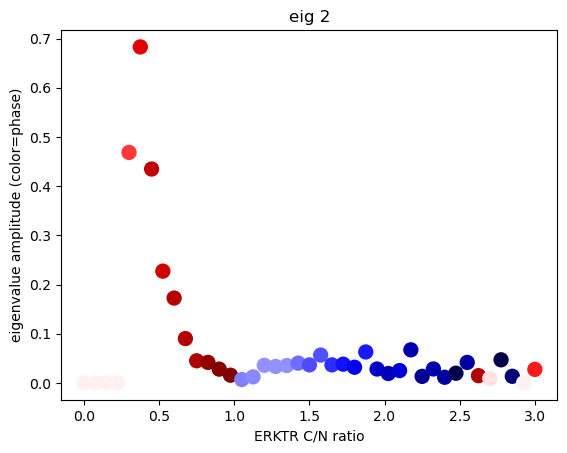

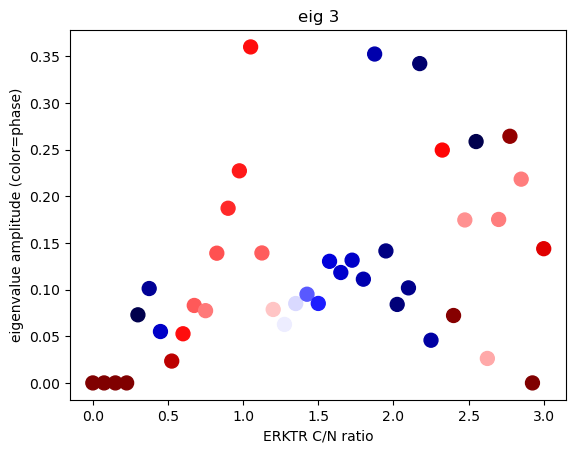

In [26]:
#examine eigenvector structure to determine metastable on/off signaling sets
plt.figure()
for icomp in range(ncomp-1,0-1,-1): #range(ncomp):
    plt.figure()
    plt.scatter(ccbins,va[:,icomp],s=100,c=vth[:,icomp],cmap=plt.cm.seismic)
    plt.xlabel('ERKTR C/N ratio')
    plt.ylabel('eigenvalue amplitude (color=phase)')
    plt.title(f'eig {ncomp-icomp}')
    plt.show()

<Figure size 640x480 with 0 Axes>

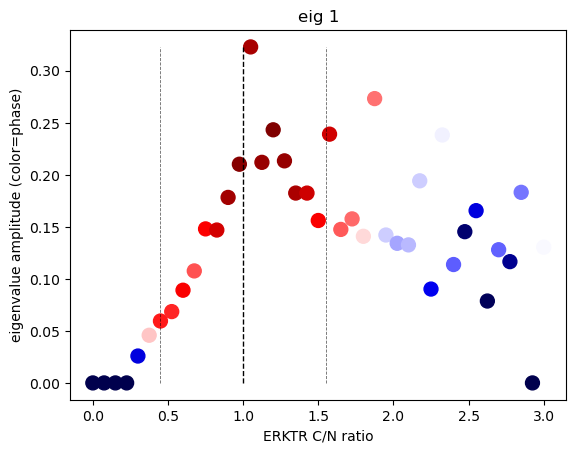

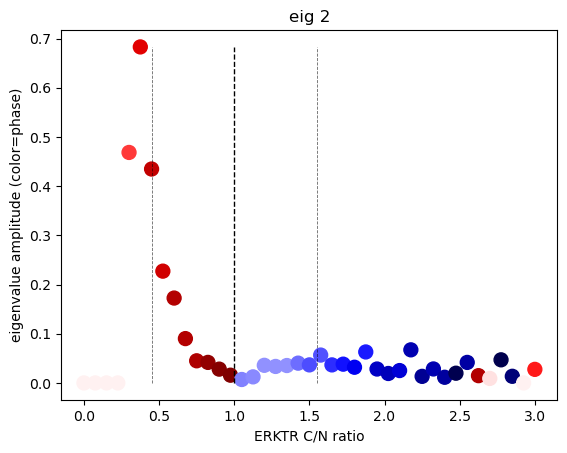

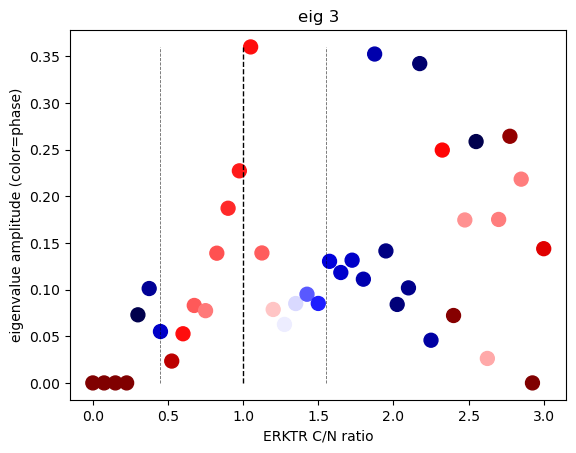

In [30]:
lowcut=.45
highcut=1.55
midcut=.5*highcut+.5*lowcut
plt.figure()
for icomp in range(ncomp-1,0-1,-1): #range(ncomp):
    plt.figure()
    plt.scatter(ccbins,va[:,icomp],s=100,c=vth[:,icomp],cmap=plt.cm.seismic)
    plt.plot([lowcut,lowcut],[np.min(va[:,icomp]),np.max(va[:,icomp])],'k--',linewidth=.6,alpha=.6)
    plt.plot([highcut,highcut],[np.min(va[:,icomp]),np.max(va[:,icomp])],'k--',linewidth=.6,alpha=.6)
    plt.plot([midcut,midcut],[np.min(va[:,icomp]),np.max(va[:,icomp])],'k--',linewidth=1.,alpha=1.)
    plt.xlabel('ERKTR C/N ratio')
    plt.ylabel('eigenvalue amplitude (color=phase)')
    plt.title(f'eig {ncomp-icomp}')
    plt.savefig(date+'/cc_componentrth_'+str(ncomp-icomp)+'_Hcc_nc'+str(ncc)+'_signaling.png')

In [31]:
#use signaling cutoffs to assign binary on/off values
scut=midcut
sigState=np.array([]).astype(int)
for i in indgood_models:
    sigState=np.append(sigState,modelSet[i].x_signal>scut)
    modelSet[i].sigState=modelSet[i].x_signal>scut

## Section 4 – Spatiotemporal signaling correlations

This section quantifies how ERK signaling states are correlated across space and time. For example, it may:

- Compute pairwise correlations between cells as a function of distance.
- Examine how ERK on/off states cluster in space.
- Assess whether signaling events propagate locally through the tissue.


### Overview: Section 4

This section computes signaling spatial correlations.

**Biological purpose:**  
Discover whether ERK activation propagates locally or clusters spatially.

**What happens here:**  
- Compute spatial distances between cells  
- Quantify correlations in ERK state at multiple radii  
- Examine treatment-specific neighborhood effects  
- Plot correlation functions vs distance/time lag  

**Key Parameters:**  
- Spatial radius bins  
- Temporal lag windows  
- Filtering thresholds for valid cell pairs  

**Outputs produced:**  
- Correlation curves  
- Spatial ERK coordination profiles  



---


### Examine spatiotemporal signaling correlations

In [32]:
def get_signal_rdf(self,S,time_lag=0,x_pos=None,cell_inds=None,rbins=None,nr=8,rmax=100,zscale=None,rescale_z=False):
    #S needs to be indexed so S[cell_inds] gives the correct binary signal, same with x_pos
    if cell_inds is None:
        cell_inds=np.arange(self.cells_indSet.size).astype(int)
    if x_pos is None:
        x_pos=self.x
        if rescale_z:
            x_pos=np.multiply(x_pos,np.array([self.zscale,1.,1.]))
    if rbins is None:
        rbins=np.linspace(0.,rmax,nr)
    nr=rbins.size
    traj_pairSet=self.get_traj_segments(time_lag+1)
    if time_lag==0:
        traj_pairSet=np.concatenate((traj_pairSet,traj_pairSet),axis=1)
    else:
        traj_pairSet=np.concatenate((traj_pairSet[:,[0]],traj_pairSet[:,[-1]]),axis=1)
    paircorr=np.zeros(nr)
    norm=np.zeros(nr)
    indimgs=np.unique(self.cells_indimgSet[traj_pairSet[:,0]])
    for im in indimgs:
        cell_inds_img1=np.where(self.cells_indimgSet[traj_pairSet[:,0]]==im)[0]
        indcomm_ctraj1=traj_pairSet[cell_inds_img1,0]
        indcomm_ctraj2=traj_pairSet[cell_inds_img1,1]
        inds_on1=np.where(S[indcomm_ctraj1]>0)[0] #on at first time
        x_pos1=x_pos[indcomm_ctraj1[inds_on1],:] #only look at cells which are "on"
        x_pos2=x_pos[indcomm_ctraj1,:] #any cell, first original timepoint
        S1=S[indcomm_ctraj1[inds_on1]] #signaling at first timepoint
        S2=S[indcomm_ctraj2] #signaling timelagged
        Smat=np.matmul(S1[:,np.newaxis],np.transpose(S2[:,np.newaxis]))
        dmatr=utilities.get_dmat(x_pos1,x_pos2) #distance at time 0
        indr=np.digitize(dmatr,rbins)
        for ir in range(1,nr):
            indcells_dr=np.where(indr==ir)
            if indcells_dr[0].size>0:
                paircorr[ir]=paircorr[ir]+np.sum(Smat[indcells_dr])/indcells_dr[0].size
                norm[ir]=norm[ir]+1
    rbins=rbins[1:]
    paircorr=paircorr[1:]
    norm=norm[1:]
    #print(f'tlag: {time_lag} norm: {norm}')
    for ir in range(nr-1):
        paircorr[ir]=paircorr[ir]/norm[ir]
    return rbins,paircorr

In [33]:
#loop through models and get spatiotemporal signaling distribution
nr=20;rmax=5.6*sctm.cellpose_diam;
nt=27
scorr=np.zeros((nmodels,nt,nr-1))
for i in indgood_models:
    print(f'calculation model {i}')
    for itt in range(nt):
        print(f' tlag {itt}')
        try:
            sctm=modelSet[i]
            rbins,scorr[i,itt,:]=get_signal_rdf(sctm,sctm.sigState,time_lag=itt,nr=nr,rmax=rmax,zscale=sctm.zscale,rescale_z=True)
        except:
            print(f'fail at m{i}')

scorr_av=np.nanmean(scorr,axis=0)

calculation model 1
 tlag 0
 tlag 1
 tlag 2
 tlag 3
 tlag 4
 tlag 5
 tlag 6
 tlag 7
 tlag 8
 tlag 9
 tlag 10
 tlag 11
 tlag 12
 tlag 13
 tlag 14
 tlag 15


/tmp/ipykernel_7906/47717045.py:42: RuntimeWarning: invalid value encountered in scalar divide
  paircorr[ir]=paircorr[ir]/norm[ir]


 tlag 16
 tlag 17
 tlag 18
 tlag 19
 tlag 20
 tlag 21
 tlag 22
 tlag 23
 tlag 24
 tlag 25
 tlag 26
calculation model 2
 tlag 0
 tlag 1
 tlag 2
 tlag 3
 tlag 4
 tlag 5
 tlag 6
 tlag 7
 tlag 8
 tlag 9
 tlag 10
 tlag 11
 tlag 12
 tlag 13
 tlag 14
 tlag 15
 tlag 16
 tlag 17
 tlag 18
 tlag 19
 tlag 20
 tlag 21
 tlag 22
 tlag 23
 tlag 24
 tlag 25
 tlag 26
calculation model 3
 tlag 0
 tlag 1
 tlag 2
 tlag 3
 tlag 4
 tlag 5
 tlag 6
 tlag 7
 tlag 8
 tlag 9
 tlag 10
 tlag 11
 tlag 12
 tlag 13
 tlag 14
 tlag 15
 tlag 16
 tlag 17
 tlag 18
 tlag 19
 tlag 20
 tlag 21
 tlag 22
 tlag 23
 tlag 24
 tlag 25
 tlag 26
calculation model 4
 tlag 0
 tlag 1
 tlag 2
 tlag 3
 tlag 4
 tlag 5
 tlag 6
 tlag 7
 tlag 8
 tlag 9
 tlag 10
 tlag 11
 tlag 12
 tlag 13
 tlag 14
 tlag 15
 tlag 16
 tlag 17
 tlag 18
 tlag 19
 tlag 20
 tlag 21
 tlag 22
 tlag 23
 tlag 24
 tlag 25
 tlag 26
calculation model 5
 tlag 0
 tlag 1
 tlag 2
 tlag 3
 tlag 4
 tlag 5
 tlag 6
 tlag 7
 tlag 8
 tlag 9
 tlag 10
 tlag 11
 tlag 12
 tlag 13
 tlag 

Control Organoid





/tmp/ipykernel_7906/4079288351.py:33: RuntimeWarning: Mean of empty slice
  sc_bin[ir,0]=np.nanmean(sc)
/home/wsltools/anaconda3/envs/celltraj_env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/wsltools/anaconda3/envs/celltraj_env/lib/python3.9/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


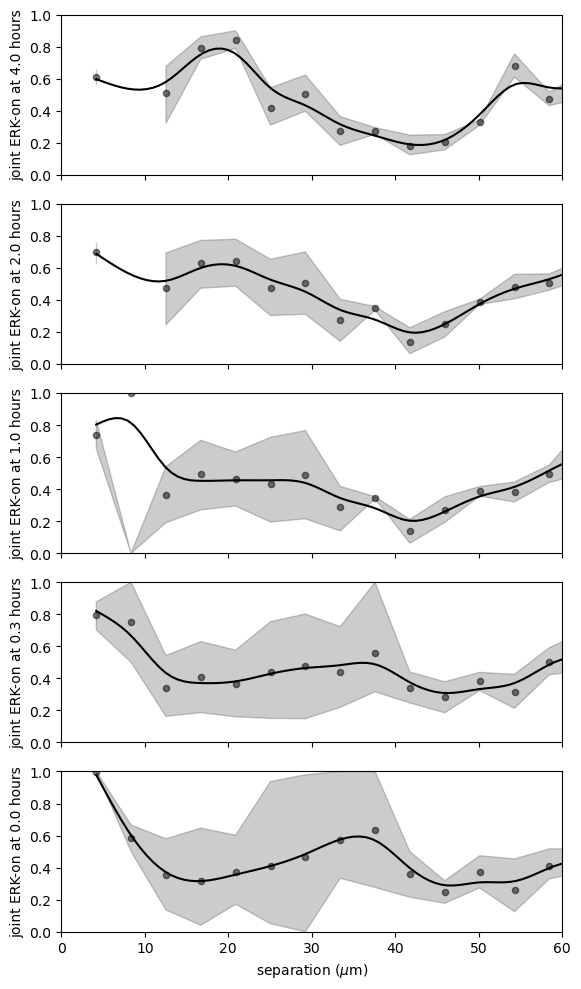

Control Lung





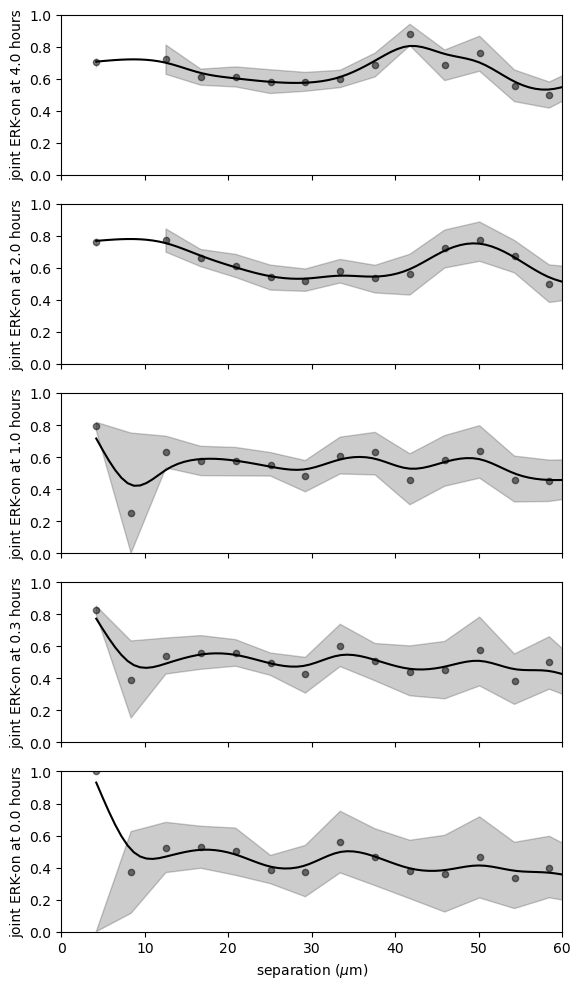

In [34]:
sys.path.append('/home/groups/CEDAR/copperma/dyn-cell-sys/dynamical-cell-systems-group/BayesianBootstrap')
scipy.average=np.mean
scipy.percentile=np.percentile
import bootstrap
framebins=np.array([0,1,3,6,12,1000]).astype(int)
rbins_mu=sctm.micron_per_pixel*rbins
rbins_mu_smth=np.linspace(np.min(rbins_mu),np.max(rbins_mu),101)
for i_tm in range(nf):
    print(tmSet[i_tm]+'\n\n\n')
    fig,axs=plt.subplots(framebins.size-1,1,sharex=True,figsize=(6,2*(framebins.size-1)))
    indmodels=np.where(inds_tmSet_models==i_tm)[0]
    indmodels=np.intersect1d(indmodels,indgood_models)
    axs=axs.flatten()
    axs=np.flip(axs)
    sigState=[]
    for imodel in indmodels:
        sctm=modelSet[imodel]
        sigState.append(sctm.sigState[np.isfinite(sctm.x_signal)])
    sigState=np.concatenate(sigState)
    meanS=np.nanmean(sigState)
    for ibin in range(0,framebins.size-1):
        sc_bin=np.zeros((nr-1,3))
        ax=axs[ibin]
        iframe=framebins[ibin]
        #if lf<0:
        #if uf>nt-1:
        lf=iframe
        uf=framebins[ibin+1]
        scr=scorr[indmodels,lf:uf,:]
        for ir in range(nr-1):
            sc=scr[...,ir]
            sc=sc[np.isfinite(sc)]
            sc_bin[ir,0]=np.nanmean(sc)
            sc_bin[ir,1:]=bootstrap.get_CI(sc,1000)
        ind=np.isfinite(sc_bin[:,0])
        spl=csaps.CubicSmoothingSpline(rbins_mu[ind], sc_bin[ind,0], smooth=10.e-2)
        sc_bin_smooth=spl(rbins_mu_smth)
        ax.plot(rbins_mu_smth,sc_bin_smooth,'k-')
        ax.scatter(rbins_mu,sc_bin[:,0],s=20,c='black',alpha=.5)
        ax.fill_between(rbins_mu,sc_bin[:,1],sc_bin[:,2],color='black',alpha=.2)
        ax.set_ylim(0,1)
        ax.set_xlim(0,60)
        ax.set_ylabel(f'joint ERK-on at {iframe*.333:.1f} hours')
        if ibin==0:
            ax.set_xlabel(r'separation ($\mu$m)')
    plt.tight_layout()
    plt.savefig(f'{date}/spatiotemporalERK_{tmSet[i_tm]}.png')
    plt.savefig(f'{date}/spatiotemporalERK_{tmSet[i_tm]}.svg')
    plt.show()

Control Organoid





/tmp/ipykernel_7906/2555915729.py:35: RuntimeWarning: Mean of empty slice
  sc_bin[ir,0]=np.nanmean(sc)


Control Lung





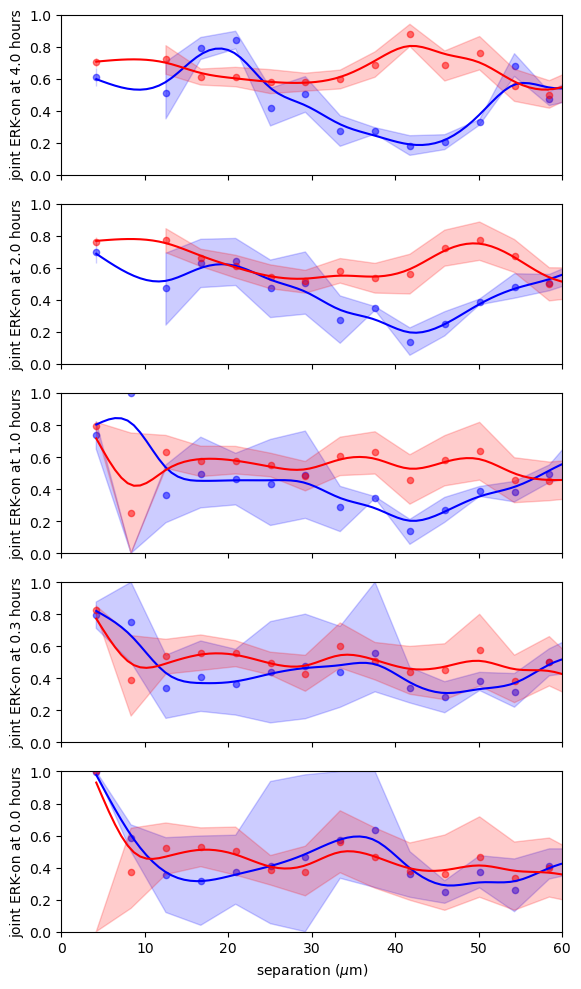

In [36]:
sys.path.append('/home/groups/CEDAR/copperma/dyn-cell-sys/dynamical-cell-systems-group/BayesianBootstrap')
scipy.average=np.mean
scipy.percentile=np.percentile
import bootstrap
framebins=np.array([0,1,3,6,12,1000]).astype(int)
rbins_mu=sctm.micron_per_pixel*rbins
rbins_mu_smth=np.linspace(np.min(rbins_mu),np.max(rbins_mu),101)
treatment_pairs=[[0,1]]
for i_pair in range(len(treatment_pairs)):
    fig,axs=plt.subplots(framebins.size-1,1,sharex=True,figsize=(6,2*(framebins.size-1)))
    axs=axs.flatten()
    axs=np.flip(axs)
    for i_tm in treatment_pairs[i_pair]:
        print(tmSet[i_tm]+'\n\n\n')
        indmodels=np.where(inds_tmSet_models==i_tm)[0]
        indmodels=np.intersect1d(indmodels,indgood_models)
        sigState=[]
        for imodel in indmodels:
            sctm=modelSet[imodel]
            sigState.append(sctm.sigState[np.isfinite(sctm.x_signal)])
        sigState=np.concatenate(sigState)
        meanS=np.nanmean(sigState)
        for ibin in range(0,framebins.size-1):
            sc_bin=np.zeros((nr-1,3))
            ax=axs[ibin]
            iframe=framebins[ibin]
            #if lf<0:
            #if uf>nt-1:
            lf=iframe
            uf=framebins[ibin+1]
            scr=scorr[indmodels,lf:uf,:]
            for ir in range(nr-1):
                sc=scr[...,ir]
                sc=sc[np.isfinite(sc)]
                sc_bin[ir,0]=np.nanmean(sc)
                sc_bin[ir,1:]=bootstrap.get_CI(sc,1000)
            ind=np.isfinite(sc_bin[:,0])
            spl=csaps.CubicSmoothingSpline(rbins_mu[ind], sc_bin[ind,0], smooth=10.e-2)
            sc_bin_smooth=spl(rbins_mu_smth)
            ax.plot(rbins_mu_smth,sc_bin_smooth,'-',color=colorSet[i_tm])
            ax.scatter(rbins_mu,sc_bin[:,0],s=20,c=colorSet[i_tm],alpha=.5)
            ax.fill_between(rbins_mu,sc_bin[:,1],sc_bin[:,2],color=colorSet[i_tm],alpha=.2)
            ax.set_ylim(0,1)
            ax.set_xlim(0,60)
            ax.set_ylabel(f'joint ERK-on at {iframe*.333:.1f} hours')
            if ibin==0:
                ax.set_xlabel(r'separation ($\mu$m)')
    plt.tight_layout()
    plt.savefig(f'{date}/scERK_pair_{tmSet[i_tm]}.png')
    plt.savefig(f'{date}/scERK_pair_{tmSet[i_tm]}.svg')
    plt.show()

/tmp/ipykernel_7906/1526111158.py:10: RuntimeWarning: Mean of empty slice
  scorr_av=np.nanmean(scorr[indmodels,...],axis=0)
/tmp/ipykernel_7906/1526111158.py:10: RuntimeWarning: Mean of empty slice
  scorr_av=np.nanmean(scorr[indmodels,...],axis=0)


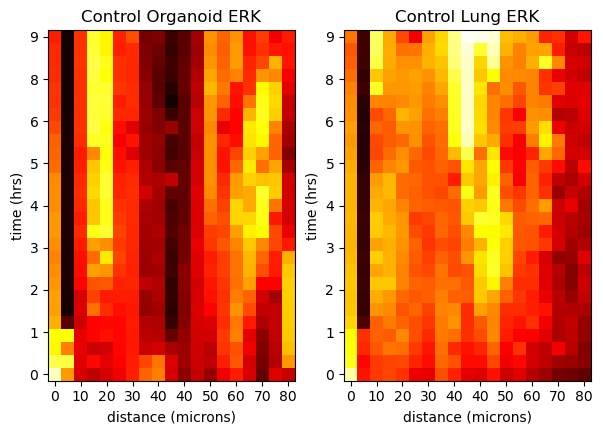

In [46]:
n_tm=len(tmSet)
fig,axs=plt.subplots(1,2,figsize=(7,10))
axs=axs.flatten()
timestep=.33
tms=[0,1]
for iplot in range(2):
    i_tm=tms[iplot]
    indmodels=np.where(inds_tmSet_models==i_tm)[0]
    indmodels=np.intersect1d(indmodels,indgood_models)
    scorr_av=np.nanmean(scorr[indmodels,...],axis=0)
    S=[]
    for imodel in indmodels:
        S.append(modelSet[imodel].x_signal)
    S=np.concatenate(S)
    scorr_av[np.logical_not(np.isfinite(scorr_av))]=0.
    scorr_av_smth=scipy.ndimage.gaussian_filter(scorr_av,.5,mode='reflect')
    ax=axs[iplot]
    ax.imshow(scorr_av_smth,origin='lower',cmap=plt.cm.hot,clim=(0.1,1))
    #cbar.set_label('ERK-active joint correlation')
    ax.set(xticks=np.linspace(0, nr-2, int(nr/2)), xticklabels=["%0d" % x for x in (np.round(.1*np.linspace(0, rmax*sctm.micron_per_pixel, int(nr/2)))*10).astype(int)], yticks=np.linspace(0,nt-1,int(nt/3)), yticklabels=["%.0f" % x for x in timestep*np.linspace(0,nt-1,int(nt/3))]);
    ax.set_xlabel('distance (microns)')
    ax.set_ylabel('time (hrs)')
    ax.set_title(f'{tmSet[i_tm]} ERK')

plt.savefig(f'{date}/erk_on_spatiotemporal_all.png')
plt.savefig(f'{date}/erk_on_spatiotemporal_all.svg')
plt.show()

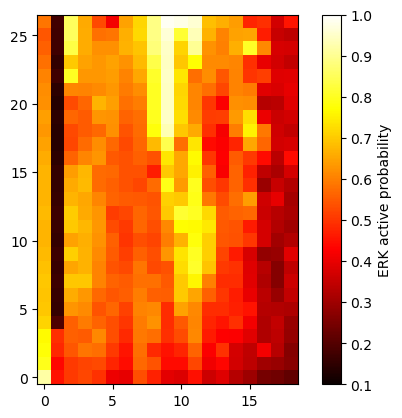

In [45]:
plt.imshow(scorr_av_smth,origin='lower',cmap=plt.cm.hot,clim=(0.1,1))
cbar=plt.colorbar()
cbar.set_label('ERK active probability')
plt.savefig(f'{date}/ERK_spatiotemporal_colorbar.png')
plt.savefig(f'{date}/ERK_spatiotemporal_colorbar.svg')

In [47]:
#now let's check a null model with positions scrambled
scorr_null=np.ones((nmodels,nt,nr-1))*np.nan
for i in indgood_models:
    print(f'calculation model {i}')
    for itt in range(nt):
        print(f' tlag {itt}')
        try:
            sctm=modelSet[i]
            x_pos=sctm.x.copy()
            np.random.shuffle(x_pos)
            rbins,scorr_null[i,itt,:]=get_signal_rdf(sctm,sctm.sigState,time_lag=itt,x_pos=x_pos,nr=nr,rmax=rmax,zscale=sctm.zscale,rescale_z=True)
        except:
            print(f'fail at m{i}')

calculation model 1
 tlag 0
 tlag 1
 tlag 2
 tlag 3
 tlag 4
 tlag 5
 tlag 6
 tlag 7
 tlag 8
 tlag 9
 tlag 10
 tlag 11
 tlag 12
 tlag 13
 tlag 14
 tlag 15
 tlag 16
 tlag 17
 tlag 18
 tlag 19
 tlag 20
 tlag 21
 tlag 22
 tlag 23
 tlag 24
 tlag 25
 tlag 26
calculation model 2
 tlag 0
 tlag 1
 tlag 2
 tlag 3
 tlag 4
 tlag 5
 tlag 6
 tlag 7
 tlag 8
 tlag 9
 tlag 10
 tlag 11
 tlag 12
 tlag 13
 tlag 14
 tlag 15
 tlag 16
 tlag 17
 tlag 18
 tlag 19
 tlag 20
 tlag 21
 tlag 22
 tlag 23
 tlag 24
 tlag 25
 tlag 26
calculation model 3
 tlag 0
 tlag 1
 tlag 2
 tlag 3
 tlag 4
 tlag 5
 tlag 6
 tlag 7
 tlag 8
 tlag 9
 tlag 10
 tlag 11
 tlag 12
 tlag 13
 tlag 14


/tmp/ipykernel_7906/47717045.py:42: RuntimeWarning: invalid value encountered in scalar divide
  paircorr[ir]=paircorr[ir]/norm[ir]


 tlag 15
 tlag 16
 tlag 17
 tlag 18
 tlag 19
 tlag 20
 tlag 21
 tlag 22
 tlag 23
 tlag 24
 tlag 25
 tlag 26
calculation model 4
 tlag 0
 tlag 1
 tlag 2
 tlag 3
 tlag 4
 tlag 5
 tlag 6
 tlag 7
 tlag 8
 tlag 9
 tlag 10
 tlag 11
 tlag 12
 tlag 13
 tlag 14
 tlag 15
 tlag 16
 tlag 17
 tlag 18
 tlag 19
 tlag 20
 tlag 21
 tlag 22
 tlag 23
 tlag 24
 tlag 25
 tlag 26
calculation model 5
 tlag 0
 tlag 1
 tlag 2
 tlag 3
 tlag 4
 tlag 5
 tlag 6
 tlag 7
 tlag 8
 tlag 9
 tlag 10
 tlag 11
 tlag 12
 tlag 13
 tlag 14
 tlag 15
 tlag 16
 tlag 17
 tlag 18
 tlag 19
 tlag 20
 tlag 21
 tlag 22
 tlag 23
 tlag 24
 tlag 25
 tlag 26
calculation model 6
 tlag 0
 tlag 1
 tlag 2
 tlag 3
 tlag 4
 tlag 5
 tlag 6
 tlag 7
 tlag 8
 tlag 9
 tlag 10
 tlag 11
 tlag 12
 tlag 13
 tlag 14
 tlag 15
 tlag 16
 tlag 17
 tlag 18
 tlag 19
 tlag 20
 tlag 21
 tlag 22
 tlag 23
 tlag 24
 tlag 25
 tlag 26
calculation model 8
 tlag 0
 tlag 1
 tlag 2
 tlag 3
 tlag 4
 tlag 5
 tlag 6
 tlag 7
 tlag 8
 tlag 9
 tlag 10
 tlag 11
 tlag 12
 tlag 

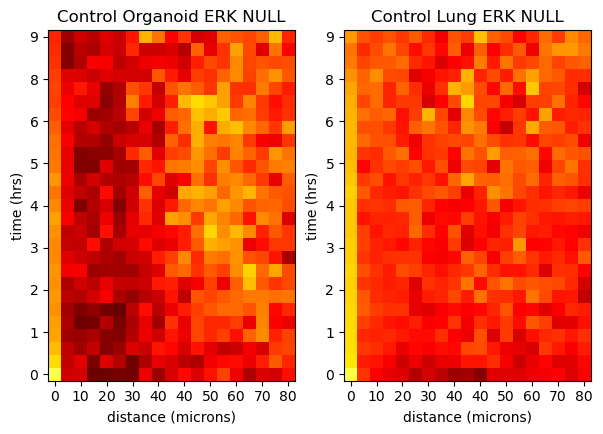

In [51]:
n_tm=len(tmSet)
fig,axs=plt.subplots(1,2,figsize=(7,10))
axs=axs.flatten()
for iplot in range(2):
    i_tm=tms[iplot]
    indmodels=np.where(inds_tmSet_models==i_tm)[0]
    indmodels=np.intersect1d(indmodels,indgood_models)
    scorr_av=np.nanmean(scorr_null[indmodels,...],axis=0)
    S=[]
    for imodel in indmodels:
        S.append(modelSet[imodel].x_signal)
    S=np.concatenate(S)
    scorr_av[np.logical_not(np.isfinite(scorr_av))]=0.
    scorr_av_smth=scipy.ndimage.gaussian_filter(scorr_av,.5,mode='reflect')
    ax=axs[iplot]
    ax.imshow(scorr_av_smth,origin='lower',cmap=plt.cm.hot,clim=(0.1,1))
    #cbar.set_label('ERK-active joint correlation')
    ax.set(xticks=np.linspace(0, nr-2, int(nr/2)), xticklabels=["%0d" % x for x in (np.round(.1*np.linspace(0, rmax*sctm.micron_per_pixel, int(nr/2)))*10).astype(int)], yticks=np.linspace(0,nt-1,int(nt/3)), yticklabels=["%.0f" % x for x in timestep*np.linspace(0,nt-1,int(nt/3))]);
    ax.set_xlabel('distance (microns)')
    ax.set_ylabel('time (hrs)')
    ax.set_title(f'{tmSet[i_tm]} ERK NULL')
    
plt.savefig(f'{date}/erk_on_spatiotemporal_all_null.png')
plt.show()

## Section 5 – Spatiotemporal motility correlations

Here, cell motility measures (e.g., speed, displacement, persistence) are related to spatial and temporal context. The analysis:

- Extracts cell trajectories and motion features.
- Compares motility for cells in different neighborhoods or signaling states.
- Looks for coordinated movement or confinement patterns.


### Overview: Section 5

This section computes motility–signal coupling.

**Biological purpose:**  
Determine whether ERK activity relates to directional persistence, displacement, and local tissue motion.

**What happens here:**  
- Compute instantaneous and integrated motility metrics  
- Join motility and ERK state data  
- Stratify motion patterns by ERK on/off status  
- Compute correlations across time  

**Key Parameters:**  
- Displacement smoothing windows  
- Minimum trajectory length  
- ERK segmentation thresholds (from Section 3)  

**Outputs produced:**  
- Motility-vs-signaling scatter/correlation datasets  



---


### Examine spatiotemporal relative motility correlations

In [52]:
#get spatiotemporal correlations in relative motility
def get_S_dx_rdf(self,S,dxv,time_lag=0,x_pos=None,cell_inds=None,rbins=None,nr=8,rmax=100,zscale=None,rescale_z=False,norm=False):
    #S needs to be indexed so S[cell_inds] gives the correct binary signal, same with x_pos
    if cell_inds is None:
        cell_inds=np.arange(self.cells_indSet.size).astype(int)
    if x_pos is None:
        x_pos=self.x
    if rescale_z:
        x_pos=np.multiply(x_pos,np.array([self.zscale,1.,1.]))
        dxv=np.multiply(dxv,np.array([self.zscale,1.,1.]))
    if norm:
        rdx=np.linalg.norm(dxv,axis=1,keepdims=True)
        dxv=dxv/rdx
    if rbins is None:
        rbins=np.linspace(0.,rmax,nr)
    nr=rbins.size
    traj_pairSet=self.get_traj_segments(time_lag+1)
    if time_lag==0:
        traj_pairSet=np.concatenate((traj_pairSet,traj_pairSet),axis=1)
    else:
        traj_pairSet=np.concatenate((traj_pairSet[:,[0]],traj_pairSet[:,[-1]]),axis=1)
    paircorr=np.zeros(nr)
    norm=np.zeros(nr)
    indimgs=np.unique(self.cells_indimgSet[traj_pairSet[:,0]])
    for im in indimgs:
        cell_inds_img1=np.where(self.cells_indimgSet[traj_pairSet[:,0]]==im)[0]
        indcomm_ctraj1=traj_pairSet[cell_inds_img1,0]
        indcomm_ctraj2=traj_pairSet[cell_inds_img1,1]
        inds_on1=np.where(S[indcomm_ctraj1]==1)[0] #finite length
        x_pos1=x_pos[indcomm_ctraj1,:] #only look at cells which are "on"
        x_pos2=x_pos[indcomm_ctraj2,:]
        dx1=dxv[indcomm_ctraj1,:] #signaling at first timepoint
        dx2=dxv[indcomm_ctraj2,:] #signaling timelagged
        dx_sep21=-x_pos2[np.newaxis, :, :] + x_pos1[:, np.newaxis, :]# Compute separation vectors for all pairs (N1, N2, 3)
        rdx_sep21 = np.linalg.norm(dx_sep21, axis=-1, keepdims=True)
        dx_sep21=dx_sep21/rdx_sep21
        dxmat = np.sum(dx_sep21 * dx2[np.newaxis, :, :], axis=-1)# Compute dot product between each separation vector and the corresponding dx2 vector (result shape: N1, N2)
        dmatr=utilities.get_dmat(x_pos1,x_pos2) #distance at time 0
        dmatr[np.eye(indcomm_ctraj1.size)>0]=np.inf #exclude same cell
        dxmat=dxmat[inds_on1,:]
        dmatr=dmatr[inds_on1,:]
        indr=np.digitize(dmatr,rbins)
        for ir in range(1,nr):
            indcells_dr=np.where(indr==ir)
            if indcells_dr[0].size>0:
                paircorr[ir]=paircorr[ir]+np.nansum(dxmat[indcells_dr])/indcells_dr[0].size
                norm[ir]=norm[ir]+1
    rbins=rbins[1:]
    paircorr=paircorr[1:]
    norm=norm[1:]
    #print(f'tlag: {time_lag} norm: {norm}')
    for ir in range(nr-1):
        paircorr[ir]=paircorr[ir]/norm[ir]
    return rbins,paircorr

In [53]:
nr=20;rmax=5.6*sctm.cellpose_diam;
nt=27
dx_corr=np.zeros((nmodels,nt,nr-1))
for i in indgood_models:
    print(f'calculation model {i}')
    for itt in range(nt):
        print(f' tlag {itt}')
        try:
            sctm=modelSet[i]
            rbins,dx_corr[i,itt,:]=get_S_dx_rdf(sctm,np.ones_like(sctm.x_signal).astype(bool),-sctm.dxv,time_lag=itt,nr=nr,rmax=rmax,zscale=sctm.zscale,rescale_z=True,norm=False)
        except:
            print(f'fail at m{i}')
    clear_output(wait=True)
dx_corr_av=np.nanmean(dx_corr,axis=0)

calculation model 31
 tlag 0
 tlag 1
 tlag 2
 tlag 3
 tlag 4
 tlag 5
 tlag 6
 tlag 7
 tlag 8
 tlag 9
 tlag 10
 tlag 11
 tlag 12
 tlag 13
 tlag 14
 tlag 15
 tlag 16
 tlag 17
 tlag 18
 tlag 19
 tlag 20
 tlag 21
 tlag 22
 tlag 23
 tlag 24
 tlag 25
 tlag 26


Control Organoid





/tmp/ipykernel_7906/1053839307.py:27: RuntimeWarning: Mean of empty slice
  dxc_bin[ir,0]=np.nanmean(dxc)
/home/wsltools/anaconda3/envs/celltraj_env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/wsltools/anaconda3/envs/celltraj_env/lib/python3.9/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


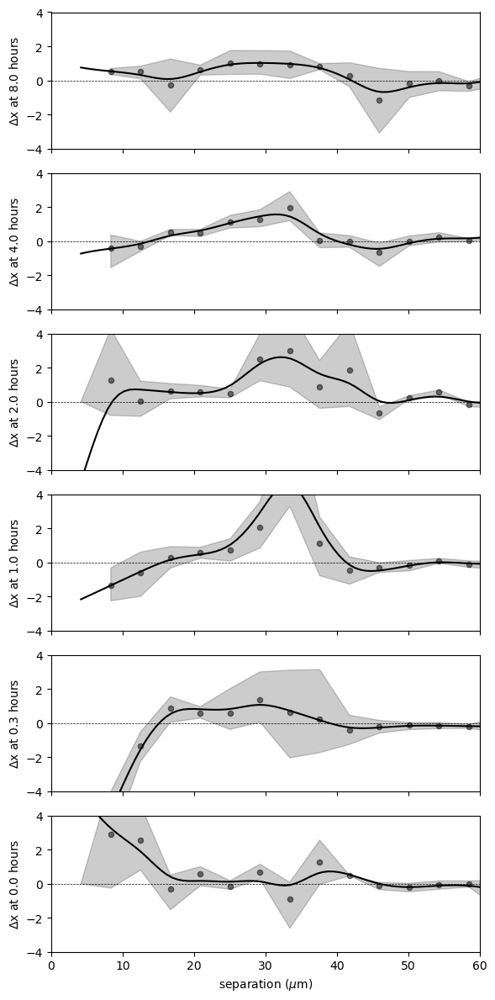

Control Lung





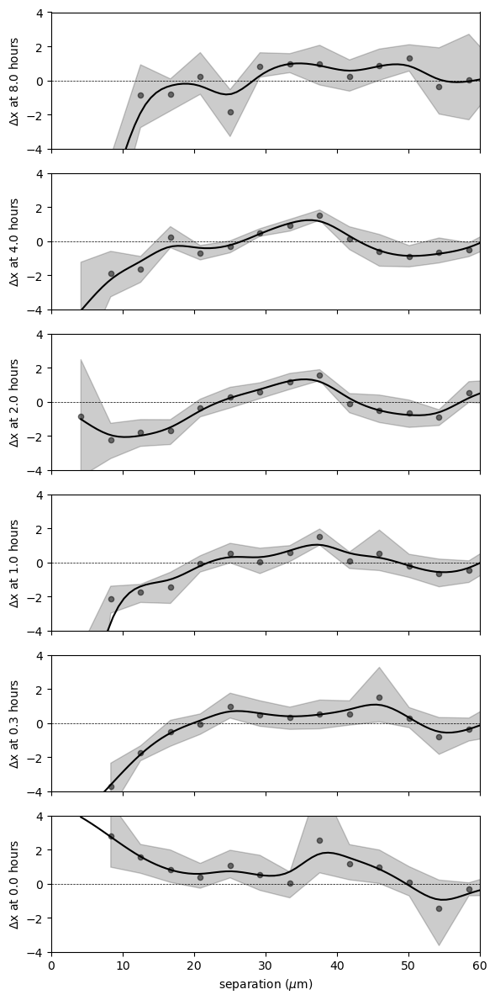

In [54]:
sys.path.append('/home/groups/CEDAR/copperma/dyn-cell-sys/dynamical-cell-systems-group/BayesianBootstrap')
scipy.average=np.mean
scipy.percentile=np.percentile
import bootstrap
framebins=np.array([0,1,3,6,12,24,49]).astype(int)
rbins_mu=sctm.micron_per_pixel*rbins
rbins_mu_smth=np.linspace(np.min(rbins_mu),np.max(rbins_mu),101)
for i_tm in range(nf):
    print(tmSet[i_tm]+'\n\n\n')
    fig,axs=plt.subplots(framebins.size-1,1,sharex=True,figsize=(6,2*(framebins.size-1)))
    indmodels=np.where(inds_tmSet_models==i_tm)[0]
    indmodels=np.intersect1d(indmodels,indgood_models)
    axs=axs.flatten()
    axs=np.flip(axs)
    for ibin in range(0,framebins.size-1):
        dxc_bin=np.zeros((nr-1,3))
        ax=axs[ibin]
        iframe=framebins[ibin]
        #if lf<0:
        #if uf>nt-1:
        lf=iframe
        uf=framebins[ibin+1]
        dxcr=dx_corr[indmodels,lf:uf,:]
        for ir in range(nr-1):
            dxc=dxcr[...,ir]
            dxc=dxc[np.isfinite(dxc)]
            dxc_bin[ir,0]=np.nanmean(dxc)
            dxc_bin[ir,1:]=bootstrap.get_CI(dxc,1000)
        ind=np.isfinite(dxc_bin[:,0])
        spl=csaps.CubicSmoothingSpline(rbins_mu[ind], dxc_bin[ind,0], smooth=10.e-2)
        dxc_bin_smooth=spl(rbins_mu_smth)
        ax.plot(rbins_mu_smth,dxc_bin_smooth,'k-')
        ax.scatter(rbins_mu,dxc_bin[:,0],s=20,c='black',alpha=.5)
        ax.fill_between(rbins_mu,dxc_bin[:,1],dxc_bin[:,2],color='black',alpha=.2)
        ax.plot(sctm.micron_per_pixel*np.array([0,np.max(rbins)]),[0.,0.],'k--',linewidth=.5)
        ax.set_ylim(-4,4)
        ax.set_xlim(0,60)
        ax.set_ylabel(r'$\Delta$x at '+f'{iframe*.333:.1f} hours')
        if ibin==0:
            ax.set_xlabel(r'separation ($\mu$m)')
    plt.tight_layout()
    plt.savefig(f'{date}/dxc_{tmSet[i_tm]}.png')
    plt.savefig(f'{date}/dxc_{tmSet[i_tm]}.svg')
    plt.show()

Control Organoid





/tmp/ipykernel_7906/3252080147.py:29: RuntimeWarning: Mean of empty slice
  dxc_bin[ir,0]=np.nanmean(dxc)


Control Lung





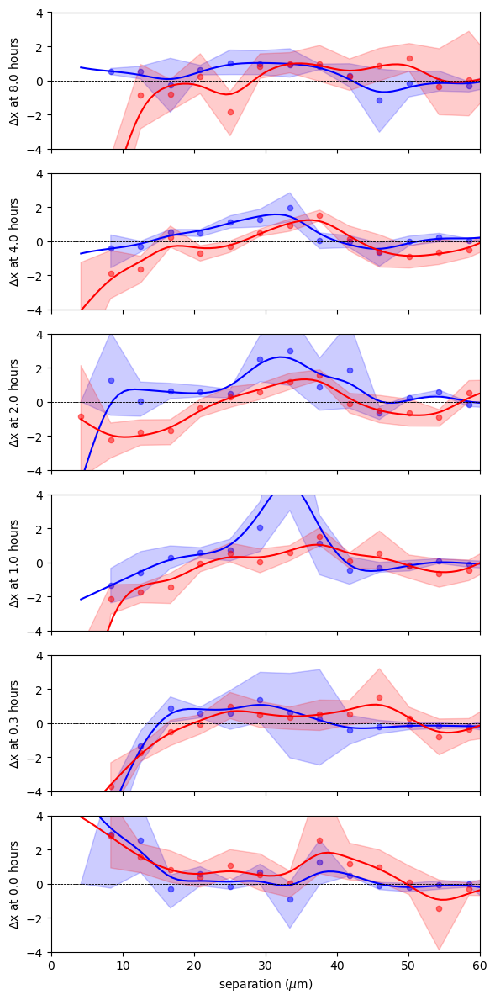

In [56]:
sys.path.append('/home/groups/CEDAR/copperma/dyn-cell-sys/dynamical-cell-systems-group/BayesianBootstrap')
scipy.average=np.mean
scipy.percentile=np.percentile
import bootstrap
framebins=np.array([0,1,3,6,12,24,49]).astype(int)
rbins_mu=sctm.micron_per_pixel*rbins
rbins_mu_smth=np.linspace(np.min(rbins_mu),np.max(rbins_mu),101)
treatment_pairs=[[0,1]]
for i_pair in range(len(treatment_pairs)):
    fig,axs=plt.subplots(framebins.size-1,1,sharex=True,figsize=(6,2*(framebins.size-1)))
    axs=axs.flatten()
    axs=np.flip(axs)
    for i_tm in treatment_pairs[i_pair]:
        print(tmSet[i_tm]+'\n\n\n')
        indmodels=np.where(inds_tmSet_models==i_tm)[0]
        indmodels=np.intersect1d(indmodels,indgood_models)
        for ibin in range(0,framebins.size-1):
            dxc_bin=np.zeros((nr-1,3))
            ax=axs[ibin]
            iframe=framebins[ibin]
            #if lf<0:
            #if uf>nt-1:
            lf=iframe
            uf=framebins[ibin+1]
            dxcr=dx_corr[indmodels,lf:uf,:]
            for ir in range(nr-1):
                dxc=dxcr[...,ir]
                dxc=dxc[np.isfinite(dxc)]
                dxc_bin[ir,0]=np.nanmean(dxc)
                dxc_bin[ir,1:]=bootstrap.get_CI(dxc,1000)
            ind=np.isfinite(dxc_bin[:,0])
            spl=csaps.CubicSmoothingSpline(rbins_mu[ind], dxc_bin[ind,0], smooth=10.e-2)
            dxc_bin_smooth=spl(rbins_mu_smth)
            ax.plot(rbins_mu_smth,dxc_bin_smooth,'-',color=colorSet[i_tm])
            ax.scatter(rbins_mu,dxc_bin[:,0],s=20,c=colorSet[i_tm],alpha=.5)
            ax.fill_between(rbins_mu,dxc_bin[:,1],dxc_bin[:,2],color=colorSet[i_tm],alpha=.2)
            ax.plot(sctm.micron_per_pixel*np.array([0,np.max(rbins)]),[0.,0.],'k--',linewidth=.5)
            ax.set_ylim(-4,4)
            ax.set_xlim(0,60)
            ax.set_ylabel(r'$\Delta$x at '+f'{iframe*.333:.1f} hours')
            if ibin==0:
                ax.set_xlabel(r'separation ($\mu$m)')
    plt.tight_layout()
    plt.savefig(f'{date}/dxc_pair_{tmSet[i_tm]}.png')
    plt.savefig(f'{date}/dxc_pair_{tmSet[i_tm]}.svg')
    plt.show()

/tmp/ipykernel_7906/1780195539.py:10: RuntimeWarning: Mean of empty slice
  dx_corr_av=np.nanmean(dx_corr[indmodels,...],axis=0)
/tmp/ipykernel_7906/1780195539.py:10: RuntimeWarning: Mean of empty slice
  dx_corr_av=np.nanmean(dx_corr[indmodels,...],axis=0)


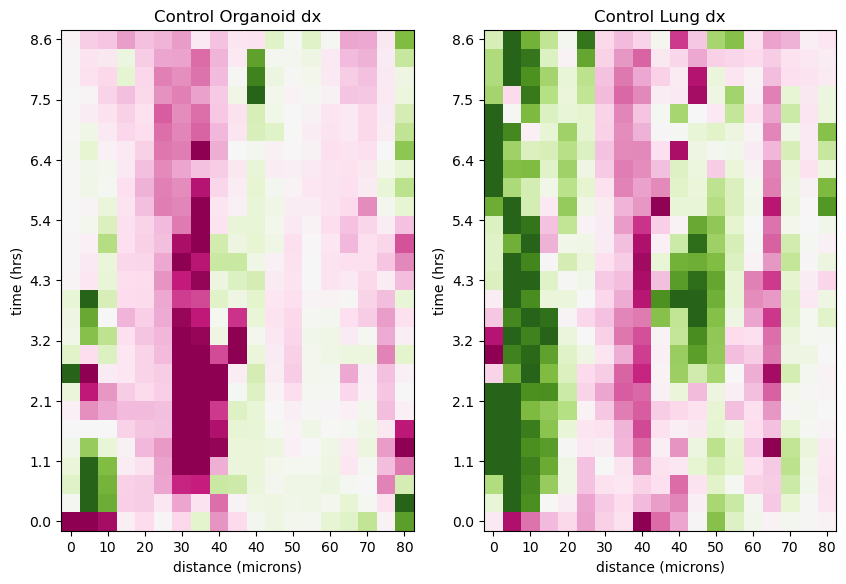

In [73]:
n_tm=len(tmSet)
fig,axs=plt.subplots(1,2,figsize=(10,10))
axs=axs.flatten()
timestep=.33
tms=[0,1]
for iplot in range(2):
    i_tm=tms[iplot]
    indmodels=np.where(inds_tmSet_models==i_tm)[0]
    indmodels=np.intersect1d(indmodels,indgood_models)
    dx_corr_av=np.nanmean(dx_corr[indmodels,...],axis=0)
    S=[]
    for imodel in indmodels:
        S.append(modelSet[imodel].x_signal)
    S=np.concatenate(S)
    dx_corr_av[np.logical_not(np.isfinite(dx_corr_av))]=0.
    dx_corr_av_smth=scipy.ndimage.gaussian_filter(dx_corr_av,.5,mode='reflect')
    ax=axs[iplot]
    ax.imshow(dx_corr_av_smth,origin='lower',cmap=plt.cm.PiYG_r,clim=(-2.,2.)) #,clim=(0,1))
    #cbar.set_label('ERK-active joint correlation')
    ax.set(xticks=np.linspace(0, nr-2, int(nr/2)), xticklabels=["%.0d" % x for x in (np.round(.1*np.linspace(0, rmax*sctm.micron_per_pixel, int(nr/2)))*10).astype(int)], yticks=np.linspace(0,nt-1,int(nt/3)), yticklabels=["%.1f" % x for x in timestep*np.linspace(0,nt-1,int(nt/3))]);
    ax.set_xlabel('distance (microns)')
    ax.set_ylabel('time (hrs)')
    ax.set_title(f'{tmSet[i_tm]} dx')
    
plt.savefig(f'{date}/dxcorr_piyg_spatiotemporal_allsig.png')
plt.savefig(f'{date}/dxcorr_piyg_spatiotemporal_allsig.svg')
plt.show()

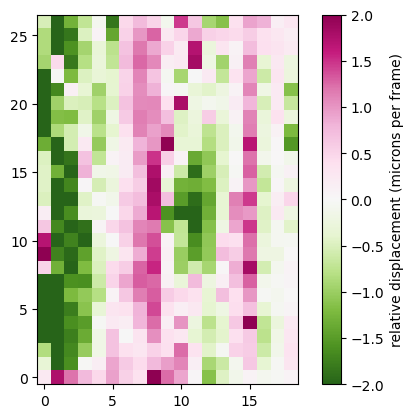

In [58]:
plt.imshow(dx_corr_av_smth,origin='lower',cmap=plt.cm.PiYG_r,clim=(-2.,2.)) #,clim=(0,1))
cbar=plt.colorbar()
cbar.set_label(f'relative displacement (microns per frame)')
plt.savefig(f'{date}/dxcorr_spatiotemporal_allsig_colorbar.png')
plt.savefig(f'{date}/dxcorr_spatiotemporal_allsig_colorbar.svg')
plt.show()

In [59]:
#null model with positions scrambled
nr=20;rmax=5.6*sctm.cellpose_diam;
nt=27
dx_corr_null=np.zeros((nmodels,nt,nr-1))
for i in indgood_models:
    print(f'calculation model {i}')
    for itt in range(nt):
        print(f' tlag {itt}')
        try:
            sctm=modelSet[i]
            x_pos=sctm.x.copy()
            np.random.shuffle(x_pos)
            rbins,dx_corr_null[i,itt,:]=get_S_dx_rdf(sctm,sctm.sigState,-sctm.dxv,time_lag=itt,x_pos=x_pos,nr=nr,rmax=rmax,zscale=sctm.zscale,rescale_z=True,norm=False)
        except:
            print(f'fail at m{i}')
    clear_output(wait=True)
dx_corr_null_av=np.nanmean(dx_corr_null,axis=0)

calculation model 31
 tlag 0
 tlag 1
 tlag 2
 tlag 3
 tlag 4
 tlag 5
 tlag 6
 tlag 7
 tlag 8
 tlag 9
 tlag 10
 tlag 11
 tlag 12
 tlag 13
 tlag 14
 tlag 15
 tlag 16
 tlag 17
 tlag 18
 tlag 19
 tlag 20
 tlag 21
 tlag 22
 tlag 23
 tlag 24
 tlag 25
 tlag 26


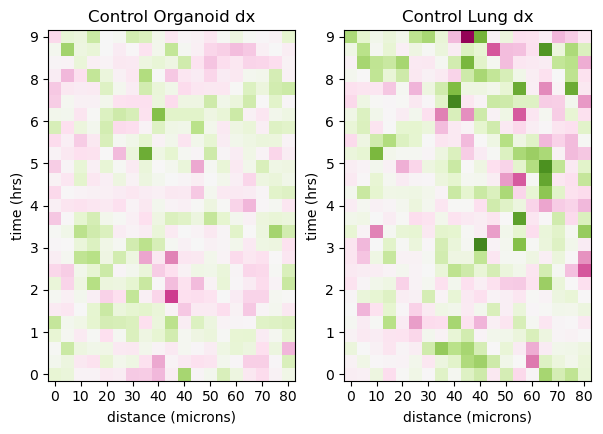

In [60]:
n_tm=len(tmSet)
fig,axs=plt.subplots(1,2,figsize=(7,10))
axs=axs.flatten()
timestep=.33
tms=[0,1]
for iplot in range(2):
    i_tm=tms[iplot]
    indmodels=np.where(inds_tmSet_models==i_tm)[0]
    indmodels=np.intersect1d(indmodels,indgood_models)
    dx_corr_av=np.nanmean(dx_corr_null[indmodels,...],axis=0)
    S=[]
    for imodel in indmodels:
        S.append(modelSet[imodel].x_signal)
    S=np.concatenate(S)
    dx_corr_av[np.logical_not(np.isfinite(dx_corr_av))]=0.
    dx_corr_av_smth=scipy.ndimage.gaussian_filter(dx_corr_av,.5,mode='reflect')
    ax=axs[iplot]
    ax.imshow(dx_corr_av_smth,origin='lower',cmap=plt.cm.PiYG_r,clim=(-2.,2.)) #,clim=(0,1))
    #cbar.set_label('ERK-active joint correlation')
    ax.set(xticks=np.linspace(0, nr-2, int(nr/2)), xticklabels=["%0d" % x for x in (np.round(.1*np.linspace(0, rmax*sctm.micron_per_pixel, int(nr/2)))*10).astype(int)], yticks=np.linspace(0,nt-1,int(nt/3)), yticklabels=["%.0f" % x for x in timestep*np.linspace(0,nt-1,int(nt/3))]);
    ax.set_xlabel('distance (microns)')
    ax.set_ylabel('time (hrs)')
    ax.set_title(f'{tmSet[i_tm]} dx')
    
plt.savefig(f'{date}/dxcorr_spatiotemporal_allsig_null.png')
plt.savefig(f'{date}/dxcorr_spatiotemporal_allsig_null.svg')
plt.show()

## Section 6 – ERK "on" neighborhood analysis

This section evaluates how ERK 'on' cells are arranged relative to one another and to ERK 'off' cells. It typically:

- Identifies ERK 'on' cells at each time point.
- Measures distances to neighboring ERK 'on' and 'off' cells.
- Tests whether ERK activation tends to occur in local clusters or isolated events.


### Overview: Section 6

This section analyzes ERK “on” neighborhoods.

**Biological purpose:**  
Test whether ERK “on” cells cluster more than expected by chance.

**What happens here:**  
- Identify ERK “on” cells at each frame  
- Compute nearest-neighbor distances  
- Compare distributions of neighbors for ERK on vs off  
- Assess enrichment of ERK-on-in-ERK-on proximity  

**Key Parameters:**  
- Distance metric (2D/3D)  
- Number of nearest neighbors to compute  
- Spatial scaling factors  

**Outputs produced:**  
- ERK neighborhood enrichment statistics  



---


### Look at signaling relationship with proximity to other ERK "on" cells

mkdir: cannot create directory ‘20251022/signaling_traj_plots’: File exists


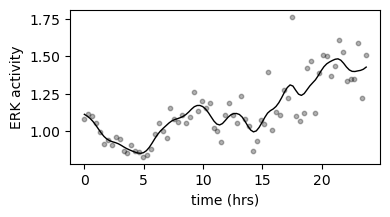

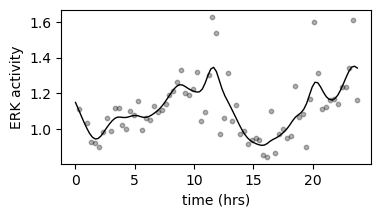

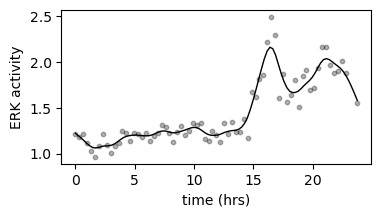

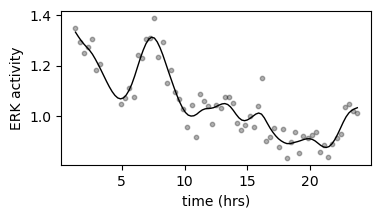

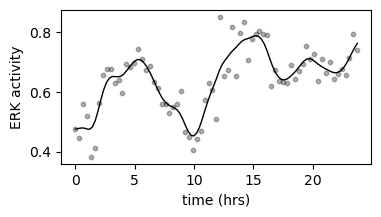

...

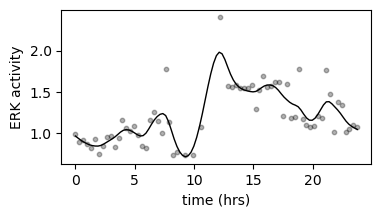

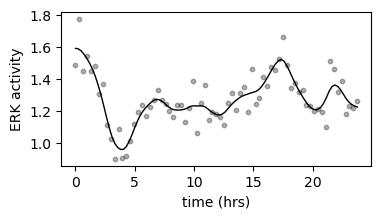

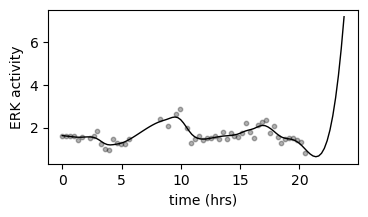

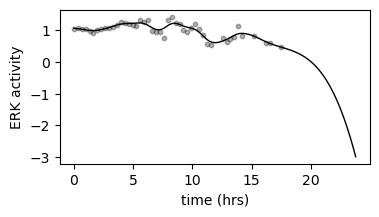

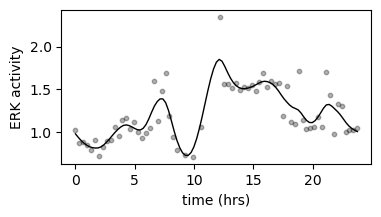

In [61]:
#look at a few ERK trajectories
timestep=.33
min_traj_len=61
tm='Control Organoid'
i_tm=np.where(np.array(tmSet)==tm)[0][0]
vizpath=f'{date}/signaling_traj_plots'
os.system(f'mkdir {vizpath}')
indmodels=np.where(inds_tmSet_models==i_tm)[0]
indmodels=np.intersect1d(indmodels,indgood_models)
for imodel in indmodels:
    sctm=modelSet[imodel]
    for itraj in range(len(sctm.trajectories)):
        cell_traj=sctm.trajectories[itraj]
        traj_len=cell_traj.size
        if traj_len>min_traj_len:
            erk_traj=sctm.x_signal[cell_traj]
            indgood=np.isfinite(erk_traj)
            if np.sum(indgood)>.66*min_traj_len:
                fig=plt.figure(figsize=(4,2))
        
                frames=sctm.cells_frameSet[cell_traj]
                frames_smooth=np.linspace(np.min(frames),np.max(frames),101)
        
                spl_erk=csaps.CubicSmoothingSpline(frames[indgood], erk_traj[indgood], smooth=.2)
                erk_traj_smooth=spl_erk(frames_smooth)
                ax=plt.gca()
                ax.plot(timestep*frames_smooth,erk_traj_smooth,'-',linewidth=1.,c='black',label='ERK activity')
                ax.scatter(timestep*frames,erk_traj,s=10,c='black',alpha=.3)
                ax.set_xlabel('time (hrs)')
                ax.set_ylabel('ERK activity')
                fig.savefig(f'{vizpath}/erk_traj_{tmSet[i_tm]}_m{imodel}_c{cell_traj[-1]}.svg')

In [62]:
#get S/R contributions (local proximity of signaling on cells)
for i in indgood_models:
    sctm=modelSet[i]
    S_r=sctm.get_signal_contributions(sctm.sigState,time_lag=0,rmax=8.*sctm.cellpose_diam,R=sctm.cellpose_diam,zscale=sctm.zscale,rescale_z=True)
    sctm.S_r=S_r.copy()
    sctm.S_r_cancer=sctm.S_r.copy()

In [63]:
#examing signaling on/off dynamics in context of S/R, so concatenate S/R and ERK c/n ratio in data vector
for i in indgood_models:
   indsf=np.where(indtreatment==i)[0]
   modelSet[i].Xpca=np.concatenate((modelSet[i].S_r[:,np.newaxis],modelSet[i].x_signal[:,np.newaxis]),axis=1)

In [64]:
#build trajectory data
trajl=1
ndim=modelSet[indgood_models[0]].Xpca.shape[1]
Xpcat=np.zeros((0,ndim*trajl))
indmodel_traj=np.array([]).astype(int)
indstack_traj=np.array([]).astype(int)
indframes_traj=np.array([]).astype(int)
cellinds0_traj=np.array([]).astype(int)
cellinds1_traj=np.array([]).astype(int)
corrc_traj=np.array([]).astype(float)
z_traj=np.array([]).astype(float)
corrc_full_traj=np.zeros((0,trajl))
cancer_cf_full_traj=np.zeros((0,trajl))
primary_cf_full_traj=np.zeros((0,trajl))
dx_full_traj=np.zeros((0,trajl))
dx_traj=np.array([])
SR_full_traj=np.zeros((0,trajl))
SR_traj=np.array([])
for i in indgood_models:
    print('building trajectory data for model {}...'.format(i))
    modelSet[i].trajectories=all_trajSet[i].copy()
    modelSet[i].trajl=trajl
    modelSet[i].traj=modelSet[i].get_traj_segments(trajl)
    data=modelSet[i].Xpca[modelSet[i].traj,:]
    data=data.reshape(modelSet[i].traj.shape[0],modelSet[i].Xpca.shape[1]*trajl)
    indgood=np.where(np.sum(np.isnan(data),axis=1)==0)[0]
    data=data[indgood,:]
    modelSet[i].traj=modelSet[i].traj[indgood,:]
    Xpcat=np.append(Xpcat,data,axis=0)
    indmodel_traj=np.append(indmodel_traj,i*np.ones(data.shape[0]).astype(int))
    indstacks=modelSet[i].cells_imgfileSet[modelSet[i].traj[:,0]]
    indstack_traj=np.append(indstack_traj,indstacks)
    indframes=modelSet[i].cells_frameSet[modelSet[i].traj[:,0]]
    indframes_traj=np.append(indframes_traj,indframes)
    cellinds0=modelSet[i].traj[:,0]
    cellinds0_traj=np.append(cellinds0_traj,cellinds0)
    cellinds1=modelSet[i].traj[:,-1]
    cellinds1_traj=np.append(cellinds1_traj,cellinds1)
    z_traj=np.append(z_traj,np.mean(modelSet[i].cellblocks[:,0],axis=1)[cellinds1])
    dx_traj=np.append(dx_traj,modelSet[i].dx[cellinds1])
    dx_full_traj=np.append(dx_full_traj,modelSet[i].dx[modelSet[i].traj],axis=0)
    SR_traj=np.append(SR_traj,modelSet[i].S_r[:,np.newaxis][cellinds1,0])
    SR_full_traj=np.append(SR_full_traj,modelSet[i].S_r[:,np.newaxis][modelSet[i].traj,0],axis=0)

cellinds0_traj=cellinds0_traj.astype(int)
cellinds1_traj=cellinds1_traj.astype(int)

x=Xpcat #x=np.matmul(Xpcat,np.real(M)) #x=np.concatenate((np.real(np.matmul(Xpcat,M)),np.imag(np.matmul(Xpcat,M))),axis=1) #x=np.concatenate((np.real(phi_X[:,indmodes_M1]),np.imag(phi_X[:,indmodes_M1])),axis=1)
for i in indgood_models:
    modelSet[i].trajectories=all_trajSet[i].copy()

neigen=x.shape[1]
inds_conditions=[None]*nf
for imf in range(nf):
    indmodels=np.intersect1d(indgood_models,np.where(inds_tmSet_models==imf)[0])
    indstm=np.array([])
    for imodel in indmodels:
        indtm=np.where(indmodel_traj==imodel)
        indstm=np.append(indstm,indtm)
    inds_conditions[imf]=indstm.astype(int).copy()

neigen=x.shape[1]
inds_conditions=[None]*nf
for imf in range(nf):
    indmodels=np.intersect1d(indgood_models,np.where(inds_tmSet_models==imf)[0])
    indstm=np.array([])
    for imodel in indmodels:
        indtm=np.where(indmodel_traj==imodel)
        indstm=np.append(indstm,indtm)
    inds_conditions[imf]=indstm.astype(int).copy()

#get transitions in the trajectory embedding space
x0set=np.zeros((0,neigen))
x1set=np.zeros((0,neigen))
inds_trajsteps_models=np.array([]).astype(int)
inds_trajsteps=np.zeros((0,2)).astype(int)
for i in indgood_models:
    print('getting flows from model: '+str(i))
    indstm=np.where(indmodel_traj==i)[0]
    if indstm.size>0:
        modelSet[i].Xtraj=x[indstm,0:neigen]
        indstm_model=indstm-np.min(indstm) #index in model
        modelSet[i].get_trajectory_steps(inds=None,get_trajectories=False,traj=modelSet[i].traj[indstm_model,:],Xtraj=modelSet[i].Xtraj[indstm_model,:])
        x0=modelSet[i].Xtraj0
        x1=modelSet[i].Xtraj1
        x0set=np.append(x0set,x0,axis=0)
        x1set=np.append(x1set,x1,axis=0)
        inds_trajsteps_models=np.append(inds_trajsteps_models,np.ones(x0.shape[0]).astype(int)*i)
        inds_trajsteps=np.append(inds_trajsteps,modelSet[i].inds_trajp1,axis=0)

building trajectory data for model 1...
building trajectory data for model 2...
building trajectory data for model 3...
building trajectory data for model 4...
building trajectory data for model 5...
building trajectory data for model 6...
building trajectory data for model 8...
building trajectory data for model 11...
building trajectory data for model 12...
building trajectory data for model 13...
building trajectory data for model 14...
building trajectory data for model 15...
building trajectory data for model 16...
building trajectory data for model 17...
building trajectory data for model 18...
building trajectory data for model 19...
building trajectory data for model 20...
building trajectory data for model 22...
building trajectory data for model 28...
building trajectory data for model 29...
building trajectory data for model 30...
building trajectory data for model 31...
getting flows from model: 1
matching up trajectory 0
matching up trajectory 100
matching up trajectory 20

In [65]:
#modeling with S/R, place clusters at S/R values and ERK on/off cutoffs
import sklearn.cluster
n_SR=5
SRmax=5.
Slow=lowcut
Shigh=highcut
SR_clusters=sklearn.cluster.KMeans(n_clusters=n_SR,init='k-means++').fit(SR_traj[SR_traj<SRmax,np.newaxis])
SR_clusters=np.sort(SR_clusters.cluster_centers_[:,0])
clustercenters0=np.concatenate((SR_clusters[:,np.newaxis],Slow*np.ones_like(SR_clusters)[:,np.newaxis]),axis=1)
clustercenters1=np.concatenate((SR_clusters[:,np.newaxis],Shigh*np.ones_like(SR_clusters)[:,np.newaxis]),axis=1)
clustercenters=np.append(clustercenters0,clustercenters1,axis=0)
n_clusters=clustercenters.shape[0]
clusters=coor.clustering.AssignCenters(clustercenters, metric='euclidean')

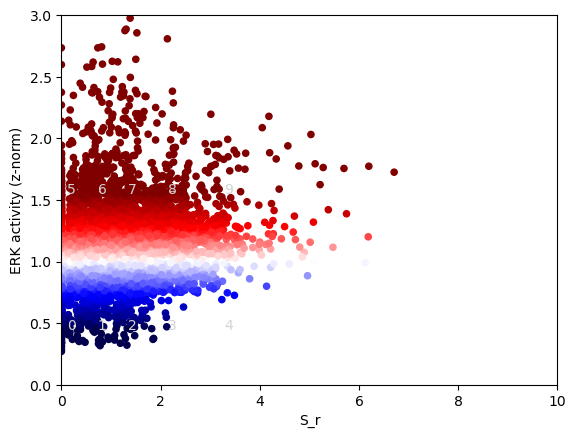

In [66]:
#show S/R and ERK signaling relationship and clusters
plt.figure()
plt.scatter(x[:,0],x[:,1],s=20,c=x[:,1],cmap=plt.cm.seismic,clim=(Slow,Shigh))
plt.ylim(0,3)
ind_clusters=clusters.assign(x)
x_clusters=np.zeros((n_clusters,2))
#for iclust in np.unique(ind_clusters):

for iclust in range(n_clusters):
    plt.text(clustercenters[iclust,0],clustercenters[iclust,1],str(iclust),color='lightgray')
    

plt.xlabel('S_r')
plt.xlim(0,10)
plt.ylabel('ERK activity (z-norm)')
plt.savefig(f'{date}/clusters_ERKSR.png')

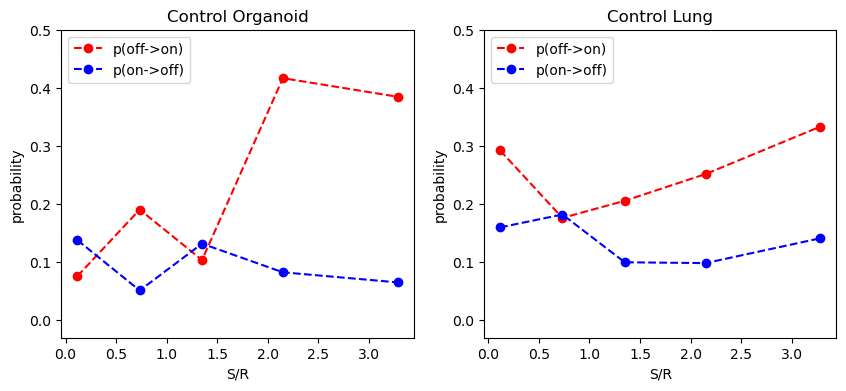

In [72]:
#Markov state model
fig,axs=plt.subplots(1,2,figsize=(10,4))
axs=axs.flatten()
MtSet=[None]*nf
tms=[0,1]
for iplot in range(2):
    i_tm=tms[iplot]
    centers_minima=clusters.clustercenters.copy()
    clusters_minima=coor.clustering.AssignCenters(centers_minima, metric='euclidean')
    indmodels=np.where(inds_tmSet_models==i_tm)[0]
    x0=[]
    x1=[]
    for imodel in indmodels:
        inds_model=np.where(inds_trajsteps_models==imodel)[0]
        x0.append(x0set[inds_model,:])
        x1.append(x1set[inds_model,:])

    x0=np.concatenate(x0)
    x1=np.concatenate(x1)
    P=model.get_transition_matrix(x0,x1,clusters=clusters_minima)
    MtSet[i_tm]=P.copy()
    
    P_ons=np.zeros(n_SR)
    P_offs=np.zeros(n_SR)
    P_stayons=np.zeros(n_SR)
    P_stayoffs=np.zeros(n_SR)
    ind0=np.where(centers_minima[:,1]==Slow)[0]
    ind1=np.where(centers_minima[:,1]==Shigh)[0]
    for i in range(n_SR):
        P_ons[i]=np.sum(P[i,ind1])
        P_offs[i]=np.sum(P[i+n_SR,ind0])
        P_stayons[i]=np.sum(P[i+n_SR,ind1])
        P_stayoffs[i]=np.sum(P[i,ind0])
    
    ax=axs[iplot]
    ax.plot(SR_clusters,P_ons,'ro--',label='p(off->on)')
    ax.plot(SR_clusters,P_offs,'bo--',label='p(on->off)')
    ax.set_xlabel('S/R')
    ax.set_ylabel('probability')
    ax.legend(loc='upper left')
    ax.set_title(tmSet[i_tm])
    ax.set_ylim(-.03,.5)
    
plt.savefig(f'{date}/SR_jointP_mean.png')
plt.savefig(f'{date}/SR_jointP_mean.svg')
plt.show()

This codeblock will only run with multiple replicates and is the above codeblock with confidence intervals. 

In [ ]:
#Markov state model, with errorbars of mean over fovs and replicates
fig,axs=plt.subplots(2,2,figsize=(12,12))
axs=axs.flatten()
tms=[0,1]
SR_clusters_smth=np.linspace(np.min(SR_clusters),np.max(SR_clusters),51)
nboots=100
for iplot in range(2):
    i_tm=tms[iplot]
    centers_minima=clusters.clustercenters.copy()
    clusters_minima=coor.clustering.AssignCenters(centers_minima, metric='euclidean')
    indmodels=np.where(inds_tmSet_models==i_tm)[0]
    P_ons_set=[]
    P_offs_set=[]
    P_ons_CR=np.zeros((n_SR,3))
    P_offs_CR=np.zeros((n_SR,3))
    imagingSets=np.unique(inds_imagingSet_models[indmodels])
    for iSet in imagingSets:
        indmodels_imagingSets=np.where(inds_imagingSet_models==iSet)[0]
        indmodels_Set=np.setdiff1d(indmodels,indmodels_imagingSets)
        for iboot in range(nboots):
            x0=[]
            x1=[]
            indmodels_boots= np.random.choice(indmodels_Set, size=indmodels_Set.size, replace=True)
            for imodel in indmodels_boots:
                inds_model=np.where(inds_trajsteps_models==imodel)[0]
                x0.append(x0set[inds_model,:])
                x1.append(x1set[inds_model,:])    
            x0=np.concatenate(x0)
            x1=np.concatenate(x1)
            P=model.get_transition_matrix(x0,x1,clusters=clusters_minima)  
            P_ons=np.zeros(n_SR)
            P_offs=np.zeros(n_SR)
            P_stayons=np.zeros(n_SR)
            P_stayoffs=np.zeros(n_SR)
            ind0=np.where(centers_minima[:,1]==Slow)[0]
            ind1=np.where(centers_minima[:,1]==Shigh)[0]
            for i in range(n_SR):
                P_ons[i]=np.sum(P[i,ind1])
                P_offs[i]=np.sum(P[i+n_SR,ind0])
                P_stayons[i]=np.sum(P[i+n_SR,ind1])
                P_stayoffs[i]=np.sum(P[i,ind0])
            if np.sum(P_ons>0.):
                P_ons_set.append(P_ons)
            if np.sum(P_offs>0.):
                P_offs_set.append(P_offs)
    P_ons_set=np.array(P_ons_set)
    P_offs_set=np.array(P_offs_set)
    P_ons_CR[:,0]=np.nanmean(P_ons_set,axis=0)
    P_offs_CR[:,0]=np.nanmean(P_offs_set,axis=0)
    for i in range(n_SR):
        P_ons_CR[i,1:]=bootstrap.get_CI(P_ons_set[:,i],1000)
        P_offs_CR[i,1:]=bootstrap.get_CI(P_offs_set[:,i],1000)
    spl_on=csaps.CubicSmoothingSpline(SR_clusters, P_ons_CR[:,0], smooth=20.e-2)
    P_ons_smth=spl_on(SR_clusters_smth)    
    spl_off=csaps.CubicSmoothingSpline(SR_clusters, P_offs_CR[:,0], smooth=20.e-2)
    P_offs_smth=spl_off(SR_clusters_smth) 
    ax=axs[iplot]
    ax.fill_between(SR_clusters,P_ons_CR[:,1],P_ons_CR[:,2],color='red',alpha=.2)
    ax.fill_between(SR_clusters,P_offs_CR[:,1],P_offs_CR[:,2],color='blue',alpha=.2)
    ax.plot(SR_clusters,P_ons_CR[:,0],'ro',label='p(off->on)',alpha=1)
    ax.plot(SR_clusters,P_offs_CR[:,0],'bo',label='p(on->off)',alpha=1)
    #for iSet in range(P_ons_set.shape[0]):
    ax.plot(SR_clusters_smth,P_ons_smth,'r-')
    ax.plot(SR_clusters_smth,P_offs_smth,'b-')
    ax.set_xlabel('S/R')
    ax.set_ylabel('probability')
    ax.legend(loc='upper left')
    ax.set_title(tmSet[i_tm])
    ax.set_ylim(-.03,.36)
    
plt.savefig(f'{date}/SR_jointP_bootstrap.png')
plt.savefig(f'{date}/SR_jointP_bootstrap.svg')
plt.show()

In [75]:
def get_SR(S,x_pos,rmax=np.inf,R=None):
    if R is None:
        R=1.
    S_r=np.ones(S.size)*np.nan #this will be the average spatial signal (S/r)
    dmatr=utilities.get_dmat(x_pos,x_pos)/R #distance at time 0
    for j in range(S.size):
        d_r=dmatr[j,:]
        inds=np.where(np.logical_and(d_r>0.,d_r<rmax))[0]
        S_r[j]=np.sum(np.divide(S[inds],d_r[inds]))
    return S_r

def generate_S(Sprev,S_possible,x_pos,P,clusters,nt,seed=0,R=1.):
    Nc=Sprev.size
    S=np.zeros((nt,Nc))
    rng = np.random.default_rng(seed)
    for itt in range(nt):
        SR=get_SR(Sprev,x_pos,R=R)
        #print(SR)
        xR=np.concatenate((SR[:,np.newaxis],Sprev[:,np.newaxis]),axis=1)
        Snew=np.zeros_like(Sprev)
        for icell in range(Nc):
            istate=clusters.assign(xR[[icell],:])
            Snew[icell]=rng.choice(S_possible,p=np.squeeze(P[istate,:]))
        S[itt,:]=Snew
        Sprev=Snew.copy()
    return S

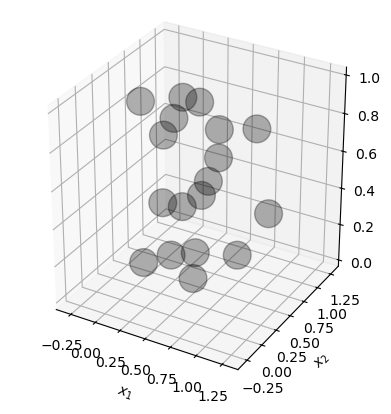

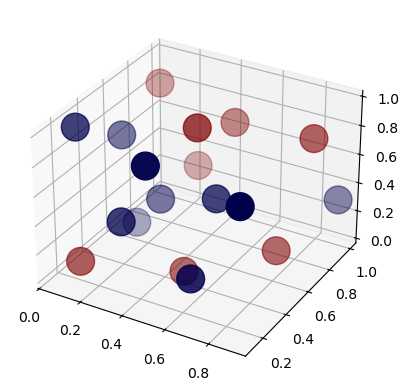

In [76]:
#sampling with random self-avoiding points in 3D
N_try=16.
rng = np.random.default_rng()
radius = 1./(N_try**.33)
engine = scipy.stats.qmc.PoissonDisk(d=3, radius=radius, seed=rng,hypersphere='surface')
x_pos = engine.fill_space()
Nc=x_pos.shape[0]
fig=plt.figure()
ax=fig.add_subplot(111,projection='3d')
_ = ax.scatter(x_pos[:, 0], x_pos[:, 1], x_pos[:,2],s=int(radius*1000),c='black',alpha=.3)
_ = ax.set(aspect='equal', xlabel=r'$x_1$', ylabel=r'$x_2$',xlim=[0-radius, 1+radius], ylim=[0-radius, 1+radius])
plt.pause(.1)

S_possible=clusters_minima.clustercenters[:,1]
Sprev=np.ones(Nc)
nt=100

S=generate_S(Sprev,S_possible,x_pos,P,clusters,nt,seed=0,R=2*radius)

fig=plt.figure()
for itt in range(nt):
    Scolor=S[itt,:]
    fig.clear()
    ax=fig.add_subplot(111,projection='3d')
    _ = ax.scatter(x_pos[:, 0], x_pos[:, 1],x_pos[:,2],s=radius*1000,c=Scolor,cmap=plt.cm.seismic)
    plt.pause(.1)

In [77]:
#set up to sample realistic heterogeneity, allow 24 hours to "equilibrate", then 24 hours measurement.
nt=144
N_try_set=np.array([0.5,1,1.5,2,3,8,10])
N_reps=10
S_possible=clusters_minima.clustercenters[:,1]

Smeans_tm=[None]*n_tm
S_set_tm= [[[None for _ in range(N_reps)] for _ in range(len(N_try_set))] for _ in range(n_tm)]
x_pos_set_tm=[[[None for _ in range(N_reps)] for _ in range(len(N_try_set))] for _ in range(n_tm)]
N_actual_tm=[None]*n_tm
for i_tm in [0,1,3,4]: #range(n_tm):
    Smeans=np.zeros((N_try_set.size,N_reps))
    N_actual_set=np.zeros((N_try_set.size,N_reps))
    invr_model_set=np.zeros((N_try_set.size,N_reps))
    P=MtSet[i_tm]
    for i_N in range(N_try_set.size):
        for irep in range(N_reps):
            N_try=N_try_set[i_N]
            rng = np.random.default_rng()
            radius = 1./(N_try**.33)
            engine = scipy.stats.qmc.PoissonDisk(d=3, radius=radius, seed=rng,hypersphere='surface')
            x_pos = engine.fill_space()
            Nc=x_pos.shape[0]
            print(Nc)
            N_actual_set[i_N,irep]=Nc
            invr_model_set[i_N,irep]=np.mean(get_SR(np.ones(Nc),x_pos))
            Sprev=np.zeros(Nc)
            S=generate_S(Sprev,S_possible,x_pos,P,clusters,nt,seed=rng.integers(0,high=100000),R=2*radius)
            S_set_tm[i_tm][i_N][irep]=S.copy()
            x_pos_set_tm[i_tm][i_N][irep]=x_pos.copy()
            Smeans[i_N,irep]=np.mean(S[-int(nt/2):,:]>midcut)
            print(f'{tmSet[i_tm]} {Nc} cells rep {irep} of {N_reps}, invr {invr_model_set[i_N,irep]:.1f} mean {Smeans[i_N,irep]:.2f}')
    Smeans_tm[i_tm]=Smeans.copy()
    N_actual_tm[i_tm]=N_actual_set.copy()

with open(f'{date}/smeans_onfrac_model.npy','wb') as file:
    pickle.dump(Smeans_tm,file)

with open(f'{date}/Nactual_model.npy','wb') as file:
    pickle.dump(N_actual_tm,file)

1
Control Organoid 1 cells rep 0 of 10, invr 0.0 mean 0.29
1
Control Organoid 1 cells rep 1 of 10, invr 0.0 mean 0.44
1
Control Organoid 1 cells rep 2 of 10, invr 0.0 mean 0.40
1
Control Organoid 1 cells rep 3 of 10, invr 0.0 mean 0.10
1
Control Organoid 1 cells rep 4 of 10, invr 0.0 mean 0.56
1
Control Organoid 1 cells rep 5 of 10, invr 0.0 mean 0.21
1
Control Organoid 1 cells rep 6 of 10, invr 0.0 mean 0.44
1
Control Organoid 1 cells rep 7 of 10, invr 0.0 mean 0.49
1
Control Organoid 1 cells rep 8 of 10, invr 0.0 mean 0.32
2
Control Organoid 2 cells rep 9 of 10, invr 0.8 mean 0.87
2
Control Organoid 2 cells rep 0 of 10, invr 1.0 mean 0.94
2
Control Organoid 2 cells rep 1 of 10, invr 1.0 mean 0.78
2
Control Organoid 2 cells rep 2 of 10, invr 1.0 mean 0.96
1
Control Organoid 1 cells rep 3 of 10, invr 0.0 mean 0.24
2
Control Organoid 2 cells rep 4 of 10, invr 1.0 mean 0.84
2
Control Organoid 2 cells rep 5 of 10, invr 1.0 mean 0.86
2
Control Organoid 2 cells rep 6 of 10, invr 1.0 mean 0.

IndexError: list index out of range

1
2
3
3
5
13
12


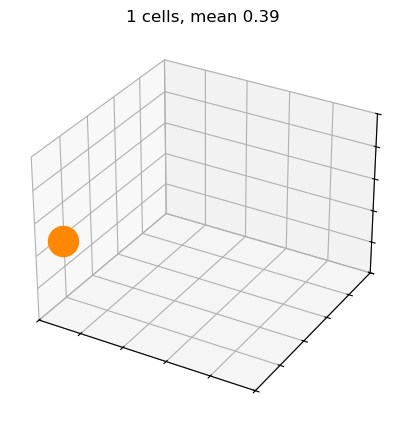

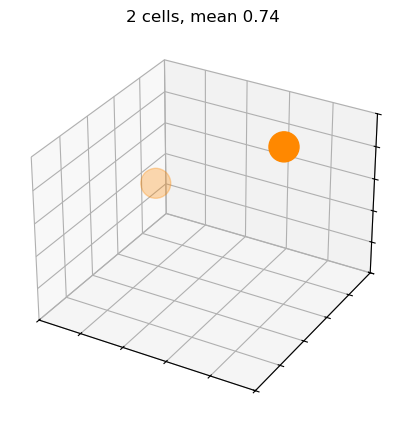

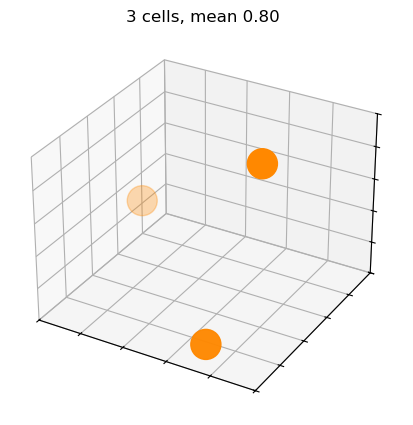

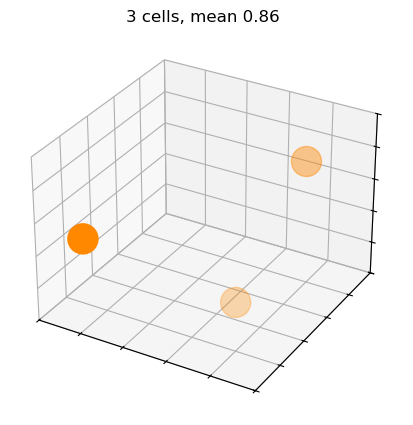

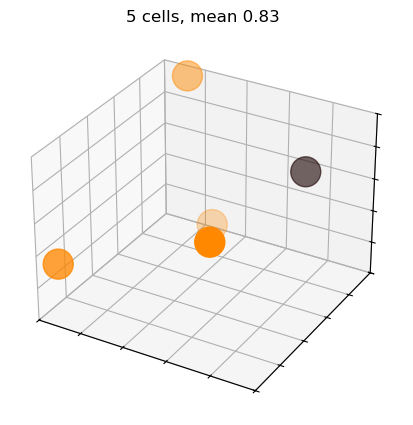

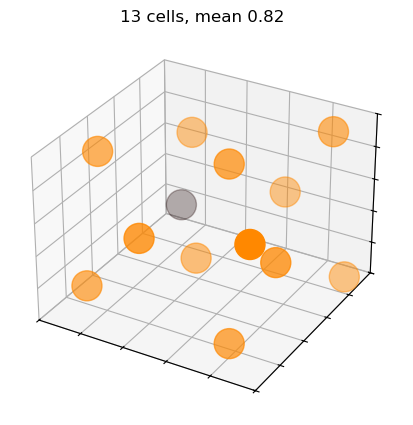

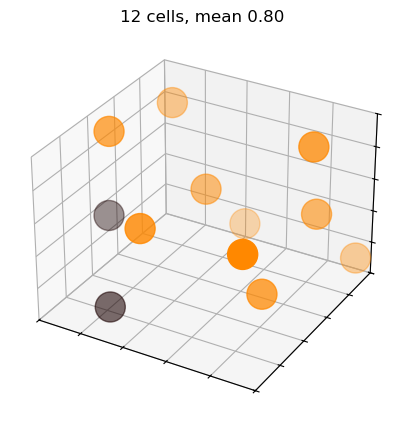

In [49]:
i_tm=0
irep=0
for itt in [140]: #range(nt):
    for i_N in range(N_try_set.size):
        fig=plt.figure(figsize=(5,5))
        x_pos=x_pos_set_tm[i_tm][i_N][irep]
        S=S_set_tm[i_tm][i_N][irep]
        S=S>midcut
        ax=fig.add_subplot(111,projection='3d')
        N=x_pos.shape[0]
        print(N)
        Scolor=S[itt,:]
        _ = ax.scatter(x_pos[:, 0], x_pos[:, 1],x_pos[:,2],s=radius*1000,c=Scolor,cmap=plt.cm.hot,clim=(-.05,1.8))
        ax.set(xlim=(0,1),ylim=(0,1),zlim=(0,1))
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_zticklabels([])
        plt.title(f'{N} cells, mean {np.mean(S[-int(nt/2):,:]):.2f}')
        plt.savefig(f'{date}/SR_markovmodel_cartoon_N{N}.svg')

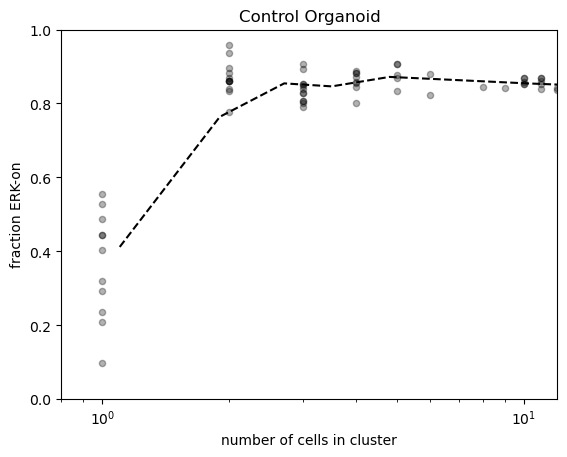

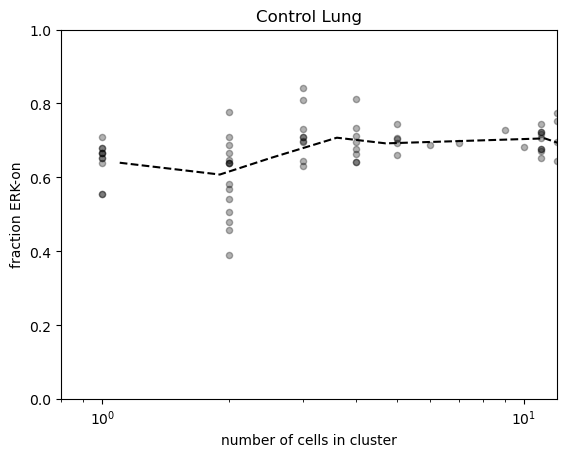

In [78]:
for i_tm in [0,1]: #range(n_tm):
    N_actual_set=N_actual_tm[i_tm]
    Smeans=Smeans_tm[i_tm]
    plt.figure()
    plt.scatter(N_actual_set.flatten(),Smeans.flatten(),s=20,c='black',alpha=.3)
    plt.plot(np.mean(N_actual_set,axis=1),np.mean(Smeans,axis=1),'k--')
    plt.xlabel('number of cells in cluster')
    plt.ylabel('fraction ERK-on')
    plt.xlim(.8,12)
    plt.ylim(0.,1.)
    plt.xscale('log')
    plt.title(f'{tmSet[i_tm]}')
    plt.savefig(f'{date}/SR_clustersize_{tmSet[i_tm]}.png')
    plt.savefig(f'{date}/SR_clustersize_{tmSet[i_tm]}.svg')
    plt.show()
    

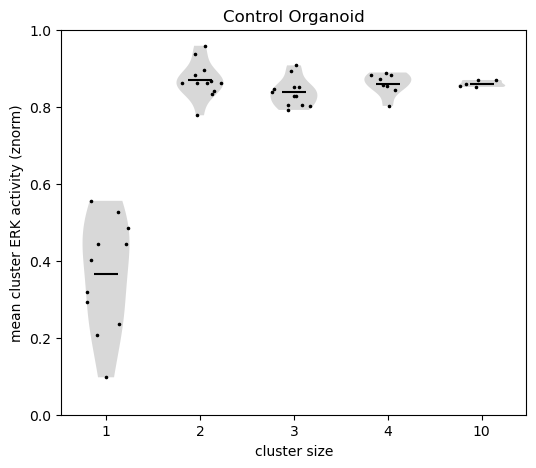

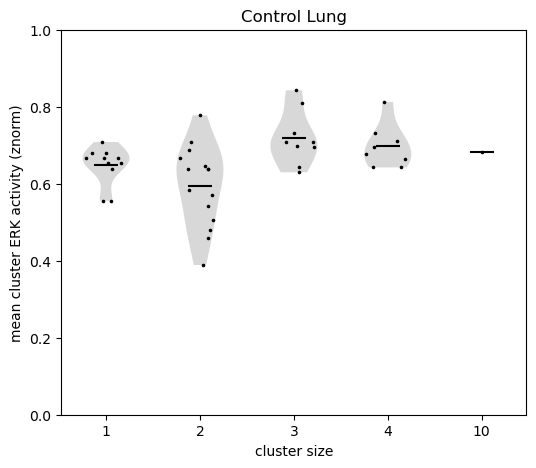

In [82]:
clusterbins=np.array([0,1,2,3,4,10,15])
for i_tm in [0,1]: #range(nf):
    Smean_csize=Smeans_tm[i_tm]
    csize=N_actual_tm[i_tm]
    plt.figure(figsize=(6,5))
    ax=plt.gca()
    for i_size in range(1,clusterbins.size-1):
        inds_csize=np.digitize(csize,clusterbins)-1
        inds=csize==clusterbins[i_size]
        setv=Smean_csize[inds]
        setv=setv[np.isfinite(setv)]
        if setv.size>0:
            vplot=ax.violinplot(setv,positions=[i_size],showmeans=True,showextrema=False)#,quantiles=[.05,.95])
            vplot['cmeans'].set_color('black')
            for pc in vplot['bodies']:
                pc.set_facecolor('gray')
            xpoints=utilities.generate_xcoords_violin(vplot,[setv[np.isfinite(setv)]])
            plt.scatter(xpoints,setv[np.isfinite(setv)],s=10,c='black',marker='.')
    plt.ylabel('mean cluster ERK activity (znorm)')
    plt.xlabel('cluster size')
    plt.title(tmSet[i_tm])
    plt.ylim(0.,1.)
    ax.set_xticks(np.arange(1,clusterbins.size-1))
    ax.set_xticklabels(clusterbins[1:-1],rotation=0)
    plt.savefig(f'{date}/smeans_csize_onfrac_model_{tmSet[i_tm]}.svg')
    plt.pause(.1)

In [63]:
rsmooth=10./sctm.micron_per_pixel #this is the radius for smoothing for combining cells in clusters

In [65]:
#@ray.remote(num_cpus=2)
def get_clusterids(h5filename,rsmooth=None):
    print(f'calc {h5filename}')
    sctm=trajectory.Trajectory(h5filename=h5filename)
    status=sctm.load_from_h5('/cell_data_m0/')
    try:
        del sctm.fmsks_cancer; del sctm.fmsks_primary; del sctm.boundary_library #delete off these for memory conservation
    except:
        pass
    print(sctm.h5filename)
    rep_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
    if rsmooth is None:
        rsmooth=sctm.cellpose_diam/2.
    zcut=2.0
    cluster_ids=np.zeros(sctm.cells_indSet.size).astype(int)
    cluster_sizes=np.zeros(sctm.cells_indSet.size).astype(int)
    clusterid=1
    for iframe in range(sctm.nt):
        print(f'extracting cluster data for model {sctm.figid.decode()}, frame {iframe}')
        msk=sctm.get_mask_data(iframe);
        msk_cyto=msk[...,cyto_msk_channel];
        img_rep=sctm.get_image_data(iframe)[...,rep_img_channel];
        img_rep_smth=skimage.filters.gaussian(img_rep,sigma=[rsmooth/sctm.zscale,rsmooth,rsmooth],mode='mirror')
        fmsk=imprep.znorm(img_rep_smth)>zcut
        indframe=np.where(sctm.cells_frameSet==iframe)[0]
        labelids_frame=sctm.cells_labelidSet[indframe]
        msk_clusters=imprep.get_labeled_mask(fmsk,fill_holes=False)
        titlestr=f''
        for icluster in np.unique(msk_clusters)[1:]:
            #print(f'{iframe}, {icluster}')
            labelids_cluster=np.unique(msk_cyto[msk_clusters==icluster])
            labelids_cluster=labelids_cluster[labelids_cluster>0] #indices one less than labeled mask, ignore 0
            labelids_common,inds_common_frame,inds_common_cluster=np.intersect1d(labelids_frame,labelids_cluster,return_indices=True)
            global_inds=indframe[inds_common_frame]
            print(f'frame {iframe} cluster {clusterid} size {global_inds.size} ids {global_inds}')
            if global_inds.size>0:
                cluster_ids[global_inds]=clusterid
                cluster_sizes[global_inds]=global_inds.size
                clusterid=clusterid+1
    sctm.cluster_ids=cluster_ids
    sctm.cluster_sizes=cluster_sizes
    sctm.save_to_h5('/cell_data_m0/',['cluster_ids','cluster_sizes'],overwrite=True)
    return cluster_ids

In [56]:
results = [get_clusterids(h5filename,rsmooth=rsmooth) for h5filename in np.array(modelList)[indgood_models]] #serial

calc /mnt/d/vaibhav/Documentation/20251015_Organoid_Documentation_XY0_roi1.h5
loading /mnt/d/vaibhav/Documentation/20251015_Organoid_Documentation_XY0_roi1.h5
interpreting image as zxyc
interpreting mask as zxyc
loading /mnt/d/vaibhav/Documentation/20251015_Organoid_Documentation_XY0_roi1.h5:/cell_data_m0/
/mnt/d/vaibhav/Documentation/20251015_Organoid_Documentation_XY0_roi1.h5
extracting cluster data for model 20251015_Organoid_Documentation_XY0_roi1, frame 0
frame 0 cluster 1 size 10 ids [ 1  2  3  4  5  6  7  8  9 10]
extracting cluster data for model 20251015_Organoid_Documentation_XY0_roi1, frame 1
frame 1 cluster 2 size 12 ids [12 13 14 15 16 17 18 19 20 21 22 24]
extracting cluster data for model 20251015_Organoid_Documentation_XY0_roi1, frame 2
frame 2 cluster 3 size 13 ids [25 26 27 28 29 30 31 32 33 34 35 36 37]
extracting cluster data for model 20251015_Organoid_Documentation_XY0_roi1, frame 3
frame 3 cluster 4 size 12 ids [38 39 40 41 42 43 44 45 46 47 48 49]
extracting clu

In [58]:
vizpath=f'{date}/collsig_31jan25'
os.system(f'mkdir {vizpath}')

0

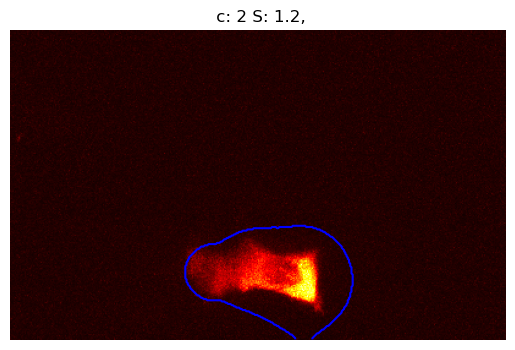

extracting cluster data for model 31, frame 71
extracting cluster data for model 31, frame 72
saving attributes ['Smean_csize', 'csize'] to /cell_data_m0/ in /mnt/d/vaibhav/Documentation/20251015_Documentation_Lung_XY3_roi3.h5
Smean_csize:[       nan 0.44147728        nan        nan        nan 0.59759626
 0.50827396 0.54536701 0.63103318 1.89736847 1.81492017 1.7467847
 1.30641734 1.43628733 1.15768715 1.20478268 1.11553807 1.02347822
 0.99548968 1.02841042        nan 1.0330048  1.14004432 1.00655519
 1.07624129 1.02446864 1.30792988 1.19487949 1.14705214 1.10415719
 1.2306622  1.13297722 1.22841741 1.07408613 0.99638903] -- the data representation in the HDF5 file does not match the original dict.
saved Smean_csize to /mnt/d/vaibhav/Documentation/20251015_Documentation_Lung_XY3_roi3.h5//cell_data_m0/
saved csize to /mnt/d/vaibhav/Documentation/20251015_Documentation_Lung_XY3_roi3.h5//cell_data_m0/


In [67]:
results2 = [get_smean_csize_distributed(imodel, modelSet,visual=True,vizpath=vizpath) for imodel in list(indgood_models)]

Trajectory objects need to be reloaded after running get_clusterids.

In [84]:
Smean_csize_set=[None]*nf
csize_set=[None]*nf
clusterbins=np.array([0,1,2,1000])
fl=36
fu=72
for i_tm in range(nf):
    csize=[]
    Smean_csize=[]
    inds_csize_models=np.array([]).astype(int)
    indmodels=np.where(inds_tmSet_models==i_tm)[0]
    indmodels=np.intersect1d(indmodels,indgood_models)
    for imodel in indmodels:
        try:
            sctm=modelSet[imodel]
            #sctm.load_from_h5('/cell_data_m0/')
            print(f'{sctm.figid.decode()}')
            inds_frames=np.where(np.logical_and(sctm.cells_frameSet>fl,sctm.cells_frameSet<fu))[0]
            ind_clusters,cluster_sizes=np.unique(sctm.cluster_ids,return_counts=True)
            if np.isin(0,ind_clusters):
                ind_clusters=ind_clusters[1:]
                cluster_sizes=cluster_sizes[1:]
            ind_clusterbins=np.digitize(cluster_sizes,clusterbins)-1
            for iclusterbin in np.unique(ind_clusterbins):
                inds_bin=np.where(ind_clusterbins==iclusterbin)[0]
                clusterids=ind_clusters[inds_bin]
                global_ids=np.where(np.isin(sctm.cluster_ids,clusterids))[0]
                global_ids=np.intersect1d(global_ids,inds_frames)
                indgood=np.where(np.isfinite(sctm.x_signal[global_ids]))[0]
                Smean=np.nanmean(sctm.x_signal[global_ids[indgood]])#>midcut)
                csize.append(clusterbins[iclusterbin])
                Smean_csize.append(Smean)
            inds_csize_models=np.append(inds_csize_models,np.ones_like(csize)*imodel)
        except Exception as e:
            print(e)
    csize=np.array(csize)
    Smean_csize=np.array(Smean_csize)
    Smean_csize_set[i_tm]=Smean_csize.copy()
    csize_set[i_tm]=csize.copy()

20251015_Organoid_Documentation_XY0_roi1
20251015_Organoid_Documentation_XY0_roi2
20251015_Organoid_Documentation_XY0_roi3
20251015_Organoid_Documentation_XY1_roi0
20251015_Organoid_Documentation_XY1_roi1
20251015_Organoid_Documentation_XY2_roi0
20251015_Organoid_Documentation_XY2_roi2
20251015_Organoid_Documentation_XY3_roi0
20251015_Organoid_Documentation_XY3_roi1
20251015_Organoid_Documentation_XY3_roi2
20251015_Documentation_Lung_XY0_roi0
20251015_Documentation_Lung_XY0_roi1
20251015_Documentation_Lung_XY0_roi2
20251015_Documentation_Lung_XY1_roi0
20251015_Documentation_Lung_XY1_roi1
20251015_Documentation_Lung_XY1_roi2
20251015_Documentation_Lung_XY1_roi3
20251015_Documentation_Lung_XY2_roi0
20251015_Documentation_Lung_XY3_roi0
20251015_Documentation_Lung_XY3_roi1
20251015_Documentation_Lung_XY3_roi2
20251015_Documentation_Lung_XY3_roi3


/tmp/ipykernel_7906/1566202480.py:29: RuntimeWarning: Mean of empty slice
  Smean=np.nanmean(sctm.x_signal[global_ids[indgood]])#>midcut)


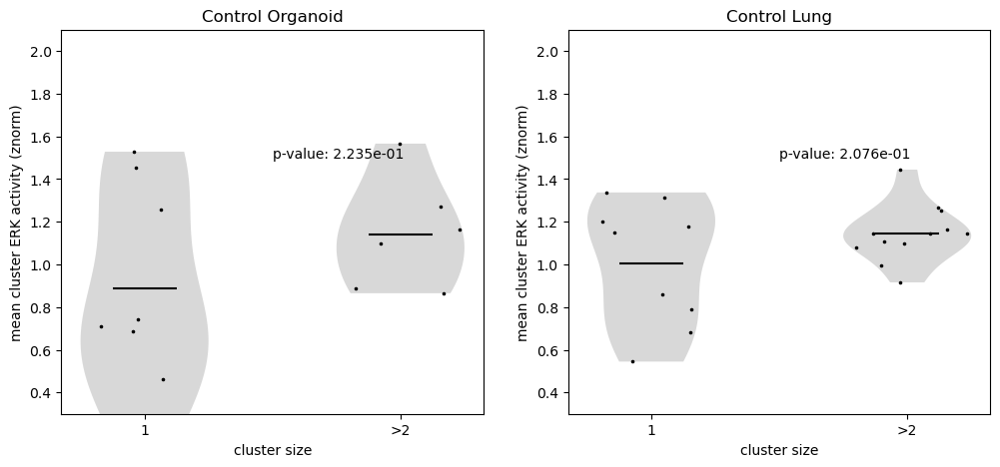

In [88]:
from scipy import stats
fig,axs=plt.subplots(1,2,figsize=(12,5))
axs=axs.flatten()
tms=[0,1]
iplot=0
for i_tm in tms: #range(nf):
    Smean_csize=Smean_csize_set[i_tm]
    csize=csize_set[i_tm]

    ax=axs[iplot]
    for i_size in range(clusterbins.size):
        inds=csize==clusterbins[i_size]
        setv=Smean_csize[inds]
        setv=setv[np.isfinite(setv)]
        if clusterbins[i_size]==1:
            setv0=setv.copy()
        if setv.size>0:
            vplot=ax.violinplot(setv,positions=[i_size],showmeans=True,showextrema=False)#,quantiles=[.05,.95])
            vplot['cmeans'].set_color('black')
            for pc in vplot['bodies']:
                pc.set_facecolor('gray')
            xpoints=utilities.generate_xcoords_violin(vplot,[setv[np.isfinite(setv)]])
            ax.scatter(xpoints,setv[np.isfinite(setv)],s=10,c='black',marker='.')
            t_statistic, p_value = stats.ttest_ind(setv0, setv, equal_var=False)
            if i_size!=1:
                ax.text(i_size-.5,1.5,f'p-value: {p_value:.3e}')
    ax.set_ylabel('mean cluster ERK activity (znorm)')
    ax.set_xlabel('cluster size')
    ax.set_title(tmSet[i_tm])
    ax.set_ylim(0.3,2.1)
    ax.set_xticks(np.arange(1,clusterbins.size-1))
    ax.set_xticklabels(['1','>2'],rotation=0)
    iplot=iplot+1
plt.savefig(f'{date}/smeans_csize_cratio_2bins.png')
plt.savefig(f'{date}/smeans_csize_cratio_2bins.svg')
plt.pause(.1)

## Section 7 – Boundary library

This section constructs libraries of cell and region boundaries for downstream shape and interface analysis. It may:

- Build polygonal representations of cell outlines.
- Annotate boundaries with features (e.g., curvature, orientation, neighbor identity).
- Save reusable boundary libraries for separate contact and niche analyses.


### Overview: Section 7

This section constructs boundary libraries.

**Biological purpose:**  
Extract high-resolution boundaries of cells or tissue regions to enable shape and contact analysis.

**What happens here:**  
- Build polygonal outlines for each cell  
- Extract geometric descriptors (curvature, arc length)  
- Assign boundaries to time-indexed frames  
- Save reusable boundary libraries  

**Key Parameters:**  
- Border resolution  
- Mask channel for surface boundaries  
- Smoothing parameters  

**Outputs produced:**  
- Boundary libraries for downstream analyses  



---


### Boundary library

examine spatial distribution of cells via boundary maps

0
14


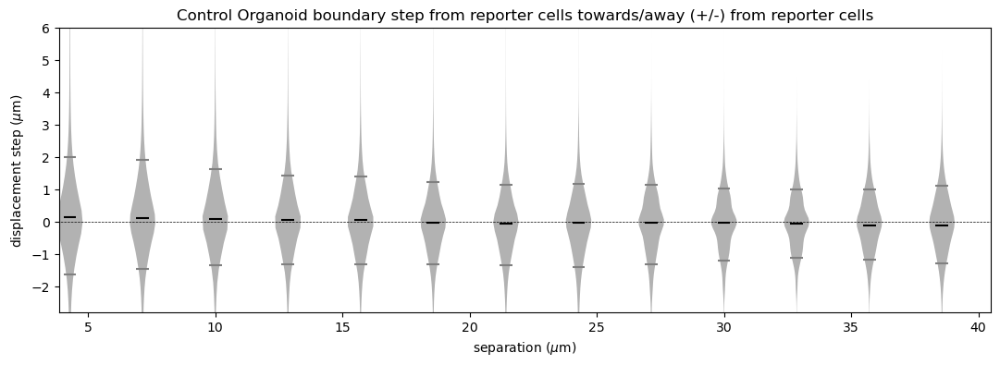

0
13


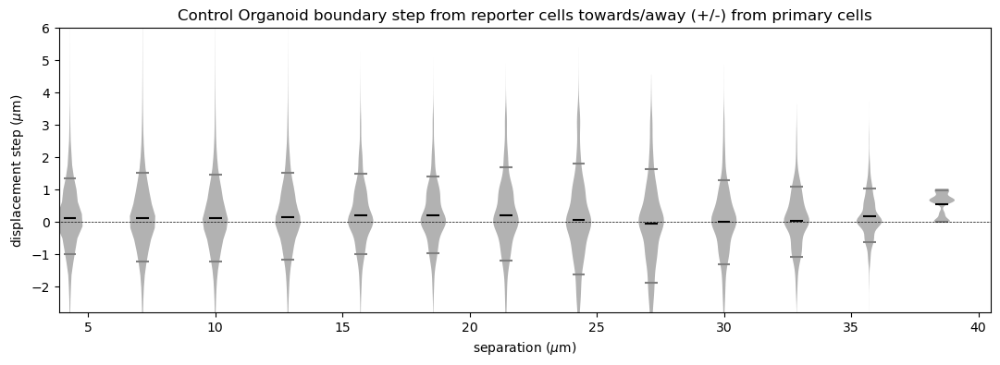

0
10


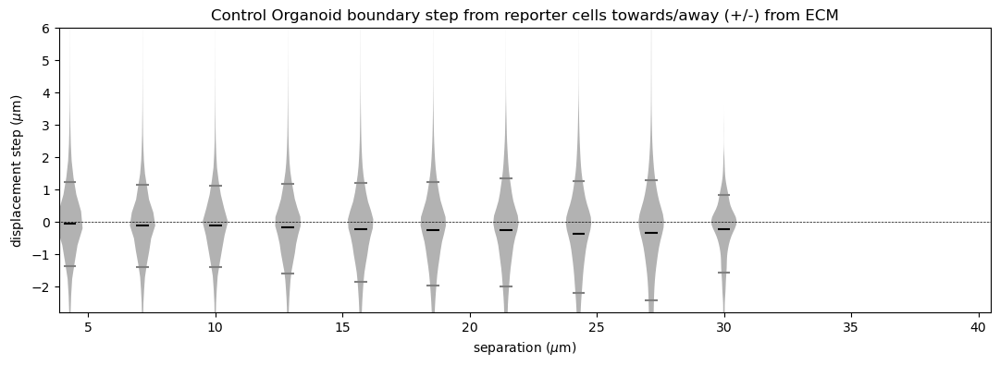

0
14


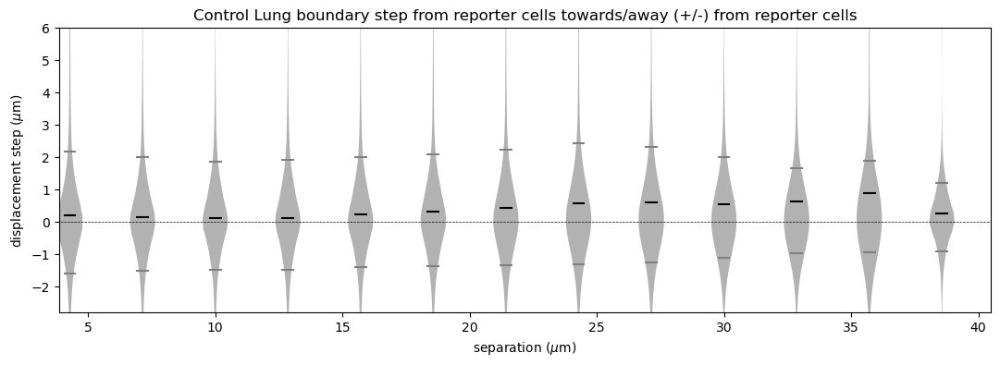

0
14


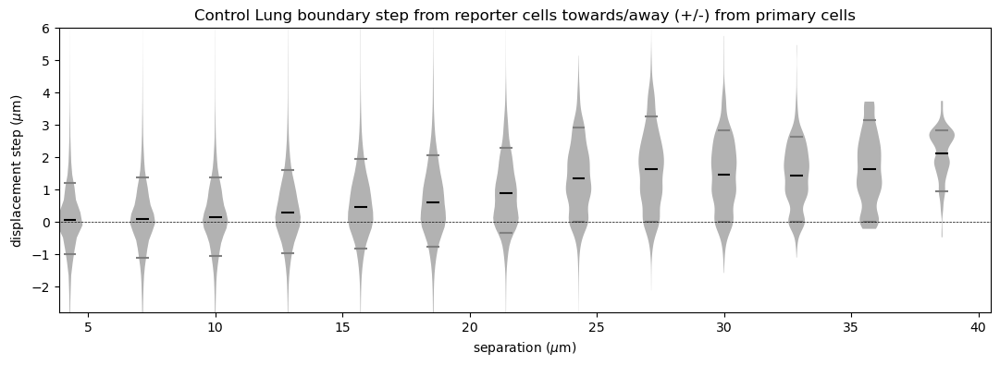

0
8


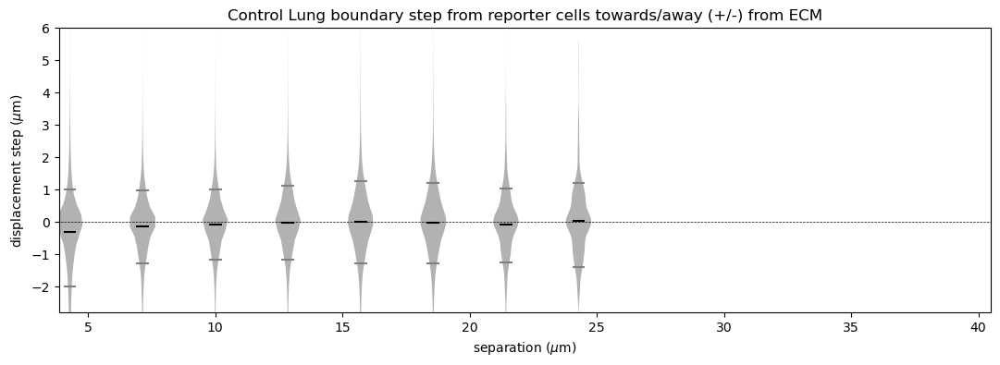

In [91]:
#boundary displacement as a function of distance, mean and single-cell distributions
boundary_resolution=sctm.boundary_library['border_resolution']
state_labels=['nothing','reporter cells','primary cells','reporter mask','ECM']
states_possible=np.array([1]).astype(int)
states_possible_nn=np.array([1,2,4]).astype(int)
min_step=0.
max_step=40./boundary_resolution
nbins=15
rmax=40/boundary_resolution
rbins=np.linspace(0,rmax,nbins)
for i_tm in [0,1]:
    for istate in states_possible:
        for istate_nn in states_possible_nn:
            x=[]
            y=[]    
            indmodels=np.where(inds_tmSet_models==i_tm)[0]
            indmodels=np.intersect1d(indmodels,indgood_models)
            for imodel in indmodels:  
                sctm=modelSet[imodel]
                ind_state=np.where(sctm.boundary_library['states']==istate)[0]
                nn_dx=sctm.boundary_library['nn_pts_states'][ind_state,istate_nn,:]-sctm.boundary_library['pts'][ind_state]
                nn_r=np.linalg.norm(nn_dx,axis=1)
                nn_hat=np.divide(nn_dx,np.array([nn_r,nn_r,nn_r]).T)
                rdx_nn=np.sum(np.multiply(sctm.boundary_library['dx_nexts'][ind_state],nn_hat),axis=1)
                x_model=nn_r*boundary_resolution
                y_model=rdx_nn*boundary_resolution
                x.append(x_model)
                y.append(y_model)
            x=np.concatenate(x)
            y=np.concatenate(y)
            inds_finite=np.logical_and(np.isfinite(y),np.isfinite(x))
            y=y[inds_finite]
            x=x[inds_finite]
            inds_max=np.where(np.logical_and(np.abs(y)<max_step,np.abs(y)>=min_step))[0]
            y=y[inds_max]
            x=x[inds_max]
            ind_rbin=np.digitize(x,rbins)-1
            rbinsc=.5*rbins[0:-1]+.5*rbins[1:]
            xmean_rbins=np.zeros(nbins)
            plt.figure(figsize=(13,4))
            ax=plt.gca()
            for ibin in range(1,nbins-1):
                indbin=np.where(ind_rbin==ibin)[0]
                if indbin.size>0:
                    xmean_rbins[ibin]=np.nanpercentile(y[indbin],90)
                    
                    vplot=ax.violinplot(boundary_resolution*y[indbin],positions=[boundary_resolution*rbinsc[ibin]],widths=[1.],showmeans=True,showextrema=False,quantiles=[.1,.9],bw_method=.25)
                    vplot['cmeans'].set_color('black')
                    vplot['cquantiles'].set_color('gray')
                    for pc in vplot['bodies']:
                        pc.set_facecolor('black')        
            plt.plot([-1,boundary_resolution*rmax+1],[0,0],'k--',linewidth=.5)
            plt.ylim(-2.8,6)
            plt.xlim(rbins[1]+boundary_resolution,boundary_resolution*rmax+.5)
            print(np.min(ind_rbin));print(np.max(ind_rbin))
            plt.xlabel(r'separation ($\mu$m)');plt.ylabel(r'displacement step ($\mu$m)')
            plt.title(f'{tmSet[i_tm]} boundary step from {state_labels[istate]} towards/away (+/-) from {state_labels[istate_nn]}')
            plt.savefig(f'{date}/cellstate{istate}_state{istate_nn}_lrdisplacement_{tmSet[i_tm]}.png')
            plt.savefig(f'{date}/cellstate{istate}_state{istate_nn}_lrdisplacement_{tmSet[i_tm]}.svg')
            plt.show()


This codeblock requires multiple replicates

In [ ]:
sys.path.append('/home/groups/CEDAR/copperma/dyn-cell-sys/dynamical-cell-systems-group/BayesianBootstrap')
scipy.average=np.mean
scipy.percentile=np.percentile
import bootstrap
boundary_resolution=sctm.boundary_library['border_resolution']
surface_names={'cancer':1, 'primary':3, 'matrix':4}
state_labels_surf=['nothing','reporter cells','reporter mask','primary cells','ECM']
states_possible=np.array([1]).astype(int)
states_possible_nn=np.array([1,3]).astype(int)
min_step=0.
max_step=4000./boundary_resolution
nbins_nn=[None,10,10,10,10]
rmax_nn=[None,20/boundary_resolution,20/boundary_resolution,20/boundary_resolution,20/boundary_resolution]
ymax_nn=[None,.5,1.,1.5,1.0,1.0]
rbins=np.linspace(0,rmax,nbins)
rbinsc=.5*rbins[0:-1]+.5*rbins[1:]
rwin=4.0
nboots=10
costh_cut=0.
for i_tm in [0,1,3,4]:#1,3,4]:
    for istate in states_possible:
        for istate_nn in states_possible_nn:
            plt.figure(figsize=(8,3))
            ax=plt.gca()
            #for istate_erk in [0,1]:
            rmax=rmax_nn[istate_nn]
            nbins=nbins_nn[istate_nn]
            rbins=np.linspace(0,rmax,nbins)
            rbinsc=.5*rbins[0:-1]+.5*rbins[1:]
            indmodels=np.where(inds_tmSet_models==i_tm)[0]
            indmodels=np.intersect1d(indmodels,indgood_models)
            border_displacements=[]
            border_displacements_CR=np.zeros((nbins-1,3))
            imagingSets=np.unique(inds_imagingSet_models[indmodels])
            for iSet in imagingSets:
                indmodels_imagingSets=np.where(inds_imagingSet_models==iSet)[0]
                indmodels_Set=np.setdiff1d(indmodels,indmodels_imagingSets)
                for iboot in range(nboots):
                    print(f'rep {iSet} bootstrapping {iboot}/{nboots}...')
                    x=[]
                    y=[]    
                    indmodels_boots= np.random.choice(indmodels_Set, size=indmodels_Set.size, replace=True)
                    for imodel in indmodels_boots:  
                        sctm=modelSet[imodel]
                        ind_state=np.where(sctm.boundary_library['states']==istate)[0]
                        nn_dx=sctm.boundary_library['nn_pts_states'][ind_state,istate_nn,:]-sctm.boundary_library['pts'][ind_state]
                        nn_r=np.linalg.norm(nn_dx,axis=1)
                        nn_hat=np.divide(nn_dx,np.array([nn_r,nn_r,nn_r]).T)
                        x_out=sctm.boundary_library['surface_normals'][ind_state]
                        x_out_r=np.linalg.norm(x_out,axis=1)
                        x_out_hat=np.divide(x_out,np.array([x_out_r,x_out_r,x_out_r]).T)
                        out_costh=np.sum(np.multiply(x_out_hat,nn_hat),axis=1)
                        ind_out=np.where(out_costh>costh_cut)[0]
                        rdx_nn=np.sum(np.multiply(sctm.boundary_library['dx_nexts'][ind_state[ind_out]],nn_hat[ind_out]),axis=1)
                        x_model=nn_r[ind_out]*boundary_resolution
                        y_model=rdx_nn*boundary_resolution
                        x.append(x_model)
                        y.append(y_model)
                    x=np.concatenate(x)
                    y=np.concatenate(y)
                    inds_finite=np.logical_and(np.isfinite(y),np.isfinite(x))
                    y=y[inds_finite]
                    x=x[inds_finite]
                    inds_max=np.where(np.logical_and(np.abs(y)<max_step,np.abs(y)>=min_step))[0]
                    y=y[inds_max]
                    x=x[inds_max]
                    bdisp=np.ones(nbins-1)*np.nan
                    ind_rbin=np.digitize(x,rbins)-1
                    for ibin in range(0,nbins-1):
                        indbin=np.where(ind_rbin==ibin)[0]
                        bdisp[ibin]=np.nanmean(y[indbin])
                    border_displacements.append(bdisp)
            border_displacements=np.array(border_displacements)
            x=[]
            y=[]    
            for imodel in indmodels:  
                sctm=modelSet[imodel]
                ind_state=np.where(sctm.boundary_library['states']==istate)[0]
                nn_dx=sctm.boundary_library['nn_pts_states'][ind_state,istate_nn,:]-sctm.boundary_library['pts'][ind_state]
                nn_r=np.linalg.norm(nn_dx,axis=1)
                nn_hat=np.divide(nn_dx,np.array([nn_r,nn_r,nn_r]).T)
                x_out=sctm.boundary_library['surface_normals'][ind_state]
                x_out_r=np.linalg.norm(x_out,axis=1)
                x_out_hat=np.divide(x_out,np.array([x_out_r,x_out_r,x_out_r]).T)
                out_costh=np.sum(np.multiply(x_out_hat,nn_hat),axis=1)
                ind_out=np.where(out_costh>costh_cut)[0]
                rdx_nn=np.sum(np.multiply(sctm.boundary_library['dx_nexts'][ind_state[ind_out]],nn_hat[ind_out]),axis=1)
                x_model=nn_r[ind_out]*boundary_resolution
                y_model=rdx_nn*boundary_resolution
                try:
                    print(f'model {imodel} max nn: {np.max(x_model[np.isfinite(x_model)])}')
                except:
                    print(f'model {imodel} no finite nn')
                    print(nn_r)
                x.append(x_model)
                y.append(y_model)
            x=np.concatenate(x)
            y=np.concatenate(y)
            inds_finite=np.logical_and(np.isfinite(y),np.isfinite(x))
            y=y[inds_finite]
            x=x[inds_finite]
            inds_max=np.where(np.logical_and(np.abs(y)<max_step,np.abs(y)>=min_step))[0]
            y=y[inds_max]
            x=x[inds_max]
            ind_rbin=np.digitize(x,rbins)-1
            border_displacements_mean=np.ones_like(border_displacements_CR[:,0])*np.nan
            for ibin in range(0,nbins-1):
                indbin=np.where(ind_rbin==ibin)[0]
                border_displacements_mean[ibin]=np.nanmean(y[indbin])
                #if indbin.size>0:            
                #    vplot['cmeans'].set_color('black')
                #    vplot['cquantiles'].set_color('gray')
                #        pc.set_facecolor('black')        
            border_displacements_CR[:,0]=np.nanmean(border_displacements,axis=0)
            for i in range(0,nbins-1):
                indgood=np.where(np.isfinite(border_displacements[:,i]))[0]
                border_displacements_CR[i,1:]=bootstrap.get_CI(border_displacements[indgood,i],1000)
                if border_displacements_CR[i,1]==0.:
                    border_displacements_CR[i,1]=border_displacements_CR[i,0]
                if border_displacements_CR[i,2]==0.:
                    border_displacements_CR[i,2]=border_displacements_CR[i,0]
            ax.errorbar(boundary_resolution*rbinsc,border_displacements_mean,xerr=None,yerr=[(border_displacements_CR[:,0]-border_displacements_CR[:,1]),(border_displacements_CR[:,2]-border_displacements_CR[:,0])],fmt='--',capsize=4.,linewidth=2.,color='black') #,color=colorSet_erk[istate_erk],label=captions[istate_erk])
            plt.plot([-1,boundary_resolution*rmax+1],[0,0],'k--',linewidth=.5)
            plt.ylim(-.5*ymax_nn[istate_nn],ymax_nn[istate_nn])
            plt.xlim(boundary_resolution*rbins[0],boundary_resolution*rmax)
            print(np.min(ind_rbin));print(np.max(ind_rbin))
            plt.xlabel(r'separation ($\mu$m)');plt.ylabel(r'displacement step ($\mu$m)')
            plt.title(f'{tmSet[i_tm]} boundary step from {state_labels_surf[istate]} towards/away (+/-) from {state_labels_surf[istate_nn]}')
            plt.savefig(f'{date}/cellstate{istate}_state{istate_nn}_lrdisplacement_binerrorbar_equalscale_{tmSet[i_tm]}.png')
            plt.savefig(f'{date}/cellstate{istate}_state{istate_nn}_lrdisplacement_binerrorbar_equalscale_{tmSet[i_tm]}.svg')
            plt.show()


## Section 8 – Contact niche and ERK signaling analysis

Using the boundary libraries and contact maps, this section relates local cell–cell neighborhood ('niche') to ERK signaling states.
It typically:

- Identifies which neighbors contact each cell.
- Computes enrichment of ERK 'on' states in specific contact niches.
- Tests hypotheses about how microenvironmental structure shapes signaling.


### Overview: Section 8

This section computes contact niches and relates them to ERK signaling.

**Biological purpose:**  
Determine if ERK activity is influenced by specific contact environments.

**What happens here:**  
- Construct cell–cell adjacency graphs  
- Identify which neighbors each cell directly contacts  
- Compute niche composition (ERK on/off neighbors, identity counts)  
- Compute enrichment of signaling states by niche  

**Key Parameters:**  
- Neighborhood radius  
- Minimum contact duration  
- Cell identity categories  

**Outputs produced:**  
- Per-cell niche annotation tables  
- ERK-niche enrichment data  



---


### Contact niche and ERK signaling analysis

This only needs to be run once. 

In [75]:
#calculate contact fractions and mean distances and save as attributes
surface_names={'cancer':1, 'primary':3, 'matrix':4}
contact_radius=1.4 #distance less means in contact
border_resolution=1.33 #microns
for imodel in indgood_models:
    print(f'calculating contact features for {sctm.figid.decode()}')
    sctm=modelSet[imodel]
    ncells=sctm.cells_indSet.size
    boundary_library=sctm.boundary_library
    for surfname in ['cancer','primary','matrix']:
        contact_fraction=np.zeros(ncells)
        mean_distance=np.zeros(ncells)
        for ic in range(ncells):
            b_inds=np.where(np.isin(boundary_library['global_index'],[ic]))[0]
            bpts=boundary_library['nn_pts_states'][b_inds,surface_names[surfname],:]
            pts=boundary_library['pts'][b_inds,:]
            dists=np.linalg.norm(bpts-pts,axis=1)/border_resolution
            dists=dists[np.isfinite(dists)]
            contact_fraction[ic]=np.sum(dists<contact_radius)/dists.size
            mean_distance[ic]=np.mean(dists)
        setattr(sctm,f'{surfname}_contact_fraction',contact_fraction)
        setattr(sctm,f'{surfname}_mean_distance',mean_distance)
        sctm.save_to_h5('/cell_data_m0/',[f'{surfname}_contact_fraction',f'{surfname}_mean_distance'],overwrite=True)
        

calculating contact features for 20251015_Documentation_Lung_XY3_roi3
saving attributes ['cancer_contact_fraction', 'cancer_mean_distance'] to /cell_data_m0/ in /mnt/d/vaibhav/Documentation/20251015_Organoid_Documentation_XY0_roi1.h5
saved cancer_contact_fraction to /mnt/d/vaibhav/Documentation/20251015_Organoid_Documentation_XY0_roi1.h5//cell_data_m0/
saved cancer_mean_distance to /mnt/d/vaibhav/Documentation/20251015_Organoid_Documentation_XY0_roi1.h5//cell_data_m0/
saving attributes ['primary_contact_fraction', 'primary_mean_distance'] to /cell_data_m0/ in /mnt/d/vaibhav/Documentation/20251015_Organoid_Documentation_XY0_roi1.h5
saved primary_contact_fraction to /mnt/d/vaibhav/Documentation/20251015_Organoid_Documentation_XY0_roi1.h5//cell_data_m0/
saved primary_mean_distance to /mnt/d/vaibhav/Documentation/20251015_Organoid_Documentation_XY0_roi1.h5//cell_data_m0/
saving attributes ['matrix_contact_fraction', 'matrix_mean_distance'] to /cell_data_m0/ in /mnt/d/vaibhav/Documentation/

/tmp/ipykernel_514519/2999639479.py:19: RuntimeWarning: invalid value encountered in scalar divide
  contact_fraction[ic]=np.sum(dists<contact_radius)/dists.size
/home/wsltools/anaconda3/envs/celltraj_env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/wsltools/anaconda3/envs/celltraj_env/lib/python3.9/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


calculating contact features for 20251015_Organoid_Documentation_XY0_roi2
saving attributes ['cancer_contact_fraction', 'cancer_mean_distance'] to /cell_data_m0/ in /mnt/d/vaibhav/Documentation/20251015_Organoid_Documentation_XY0_roi3.h5
cancer_contact_fraction:[nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan] -- the data representation in the HDF5 file does not match the original dict.
saved cancer_contact_fraction to /mnt/d/vaibhav/Documentation/20251015_Organoid_Documentation_XY0_roi3.h5//cell_data_m0/
cancer_mean_distance:[nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 

In [93]:
data_id=f'SITE_contacts'

In [92]:
#Map all trajectories
all_trajSet=[None]*nmodels
for i in indgood_models:
    modelSet[i].get_unique_trajectories()
    all_trajSet[i]=modelSet[i].trajectories.copy()

tracked cell 752, 1 tracks, 300 left
tracked cell 0, 1 tracks, 0 left
tracked cell 0, 1 tracks, 0 left
tracked cell 72, 73 tracks, 0 left
tracked cell 72, 73 tracks, 0 left
tracked cell 22, 8 tracks, 0 left
tracked cell 124, 50 tracks, 0 left
tracked cell 119, 2 tracks, 0 left
tracked cell 18, 4 tracks, 0 left
tracked cell 72, 73 tracks, 0 left
tracked cell 16, 6 tracks, 0 left
tracked cell 263, 40 tracks, 100 left
tracked cell 0, 1 tracks, 0 left
tracked cell 5, 1 tracks, 0 left
tracked cell 43, 43 tracks, 0 left
tracked cell 5, 2 tracks, 0 left
tracked cell 567, 73 tracks, 300 left
tracked cell 515, 63 tracks, 200 left
tracked cell 1, 1 tracks, 0 left
tracked cell 2, 1 tracks, 0 left
tracked cell 13, 3 tracks, 0 left
tracked cell 23, 2 tracks, 0 left
tracked cell 10, 3 tracks, 0 left
tracked cell 14, 1 tracks, 0 left
tracked cell 11, 4 tracks, 0 left
tracked cell 6, 3 tracks, 0 left


In [94]:
cancer_contact_fraction=[]
primary_contact_fraction=[]
matrix_contact_fraction=[]
indtreatment=np.array([]).astype(int)
indcellSet=np.array([]).astype(int)
indcells_global_Set=np.array([]).astype(int)
indcells_models=np.array([]).astype(int)
for i in indgood_models:
    sctm=modelSet[i]
    cancer_contact_fraction.append(sctm.cancer_contact_fraction)
    primary_contact_fraction.append(sctm.primary_contact_fraction)
    matrix_contact_fraction.append(sctm.matrix_contact_fraction)
    indtreatment=np.append(indtreatment,inds_tmSet_models[i]*np.ones(sctm.cancer_contact_fraction.size).astype(int))
    indcellSet=np.append(indcellSet,sctm.cells_indSet)
    indcells_global_Set=np.append(indcells_global_Set,np.arange(sctm.cancer_contact_fraction.size).astype(int))
    indcells_models=np.append(indcells_models,i*np.ones(sctm.cancer_contact_fraction.size).astype(int))

cancer_contact_fraction=np.concatenate(cancer_contact_fraction)
primary_contact_fraction=np.concatenate(primary_contact_fraction)
matrix_contact_fraction=np.concatenate(matrix_contact_fraction)

In [95]:
cancer_mean_distance=[]
primary_mean_distance=[]
matrix_mean_distance=[]
indtreatment=np.array([]).astype(int)
indcellSet=np.array([]).astype(int)
indcells_models=np.array([]).astype(int)
for i in indgood_models:
    sctm=modelSet[i]
    cancer_mean_distance.append(sctm.cancer_mean_distance)
    primary_mean_distance.append(sctm.primary_mean_distance)
    matrix_mean_distance.append(sctm.matrix_mean_distance)
    indtreatment=np.append(indtreatment,inds_tmSet_models[i]*np.ones(sctm.cancer_mean_distance.size).astype(int))
    indcellSet=np.append(indcellSet,sctm.cells_indSet)
    indcells_models=np.append(indcells_models,i*np.ones(sctm.cancer_mean_distance.size).astype(int))

cancer_mean_distance=np.concatenate(cancer_mean_distance)
primary_mean_distance=np.concatenate(primary_mean_distance)
matrix_mean_distance=np.concatenate(matrix_mean_distance)

In [96]:
frames_models=[]
for i in indgood_models:
    sctm=modelSet[i]
    frames_models.append(sctm.cells_frameSet)

frames_models=np.concatenate(frames_models)

2290


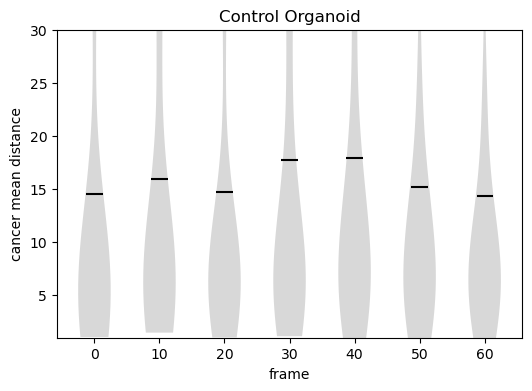

3895


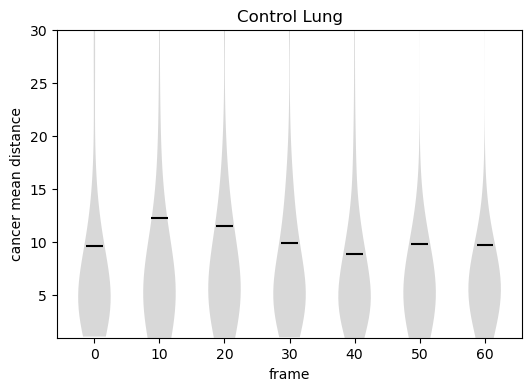

In [100]:
#plot time-dependence of contact distributions
framebins=np.array([0,10,20,30,40,50,60,70])
maxd=100.
for i_tm in range(nf):
    indtm=np.where(np.isin(indtreatment,i_tm))[0]
    print(indtm.size)
    plt.figure(figsize=(6,4))
    ax=plt.gca()
    for i_size in range(1,framebins.size):
        inds=np.where(np.logical_and(frames_models>=framebins[i_size-1],frames_models<framebins[i_size]))[0]
        inds=np.intersect1d(inds,indtm)
        setv=cancer_mean_distance[inds]
        setv=setv[np.isfinite(setv)]
        setv=setv[setv<maxd]
        if setv.size>0:
            vplot=ax.violinplot(setv,positions=[i_size],showmeans=True,showextrema=False)#,quantiles=[.05,.95])
            vplot['cmeans'].set_color('black')
            for pc in vplot['bodies']:
                pc.set_facecolor('gray')
            xpoints=utilities.generate_xcoords_violin(vplot,[setv[np.isfinite(setv)]])
    plt.ylabel(r'cancer mean distance')
    plt.xlabel('frame')
    plt.title(tmSet[i_tm])

    ax.set_xticks(np.arange(1,framebins.size))
    ax.set_xticklabels(framebins[0:-1],rotation=0)
    plt.ylim(1,30)
    plt.savefig(f'{date}/cancer_meandist_frame_{tmSet[i_tm]}.png')
    plt.savefig(f'{date}/cancer_meandist_frame_{tmSet[i_tm]}.svg')
    plt.pause(.1)

2290


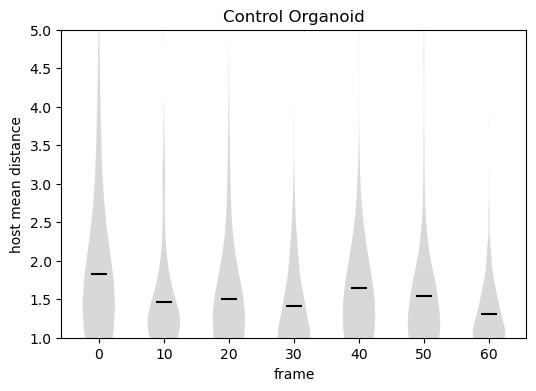

3895


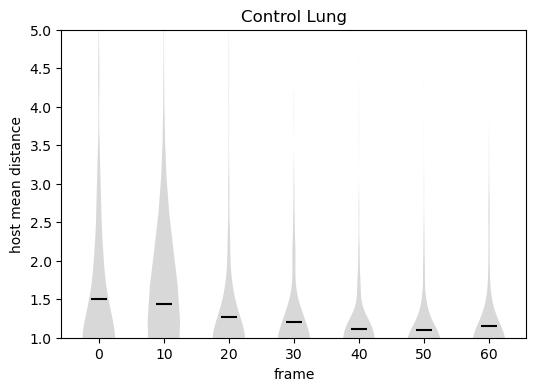

In [102]:
#plot time-dependence of contact distributions
framebins=np.array([0,10,20,30,40,50,60,70])
maxd=100.
for i_tm in range(nf):
    indtm=np.where(np.isin(indtreatment,i_tm))[0]
    print(indtm.size)
    plt.figure(figsize=(6,4))
    ax=plt.gca()
    for i_size in range(1,framebins.size):
        inds=np.where(np.logical_and(frames_models>=framebins[i_size-1],frames_models<framebins[i_size]))[0]
        inds=np.intersect1d(inds,indtm)
        setv=primary_mean_distance[inds]
        setv=setv[np.isfinite(setv)]
        setv=setv[setv<maxd]
        if setv.size>0:
            vplot=ax.violinplot(setv,positions=[i_size],showmeans=True,showextrema=False)#,quantiles=[.05,.95])
            vplot['cmeans'].set_color('black')
            for pc in vplot['bodies']:
                pc.set_facecolor('gray')
            xpoints=utilities.generate_xcoords_violin(vplot,[setv[np.isfinite(setv)]])
    plt.ylabel(r'host mean distance')
    plt.xlabel('frame')
    plt.title(tmSet[i_tm])

    ax.set_xticks(np.arange(1,framebins.size))
    ax.set_xticklabels(framebins[0:-1],rotation=0)
    plt.ylim(1,5)
    plt.savefig(f'{date}/primary_meandist_frame_{tmSet[i_tm]}.png')
    plt.savefig(f'{date}/primary_meandist_frame_{tmSet[i_tm]}.svg')
    plt.pause(.1)

In [104]:
for i_tm in range(nf):
    csize=[]
    Smean_csize=[]
    inds_csize_models=np.array([]).astype(int)
    indmodels=np.where(inds_tmSet_models==i_tm)[0]
    indmodels=np.intersect1d(indmodels,indgood_models)
    for imodel in indmodels:
        try:
            sctm=modelSet[imodel]
            print(f'{sctm.figid.decode()}')
            ind_clusters,cluster_sizes=np.unique(sctm.cluster_ids,return_counts=True)
            clustersize_cells=np.zeros_like(sctm.cluster_ids)
            for icluster in range(ind_clusters.size):
                clusterid=ind_clusters[icluster]
                cluster_size=cluster_sizes[icluster]
                ind_cells=np.where(sctm.cluster_ids==clusterid)[0]
                clustersize_cells[ind_cells]=cluster_size
            sctm.cluster_sizes=clustersize_cells.copy()
        except Exception as e:
            print(e)

20251015_Organoid_Documentation_XY0_roi1
20251015_Organoid_Documentation_XY0_roi2
20251015_Organoid_Documentation_XY0_roi3
20251015_Organoid_Documentation_XY1_roi0
20251015_Organoid_Documentation_XY1_roi1
20251015_Organoid_Documentation_XY2_roi0
20251015_Organoid_Documentation_XY2_roi2
20251015_Organoid_Documentation_XY3_roi0
20251015_Organoid_Documentation_XY3_roi1
20251015_Organoid_Documentation_XY3_roi2
20251015_Documentation_Lung_XY0_roi0
20251015_Documentation_Lung_XY0_roi1
20251015_Documentation_Lung_XY0_roi2
20251015_Documentation_Lung_XY1_roi0
20251015_Documentation_Lung_XY1_roi1
20251015_Documentation_Lung_XY1_roi2
20251015_Documentation_Lung_XY1_roi3
20251015_Documentation_Lung_XY2_roi0
20251015_Documentation_Lung_XY3_roi0
20251015_Documentation_Lung_XY3_roi1
20251015_Documentation_Lung_XY3_roi2
20251015_Documentation_Lung_XY3_roi3


In [105]:
cluster_sizes=[]
for i in indgood_models:
    sctm=modelSet[i]
    try:
        cluster_sizes.append(sctm.cluster_sizes)
    except:
        cluster_sizes.append(np.ones(sctm.cells_indSet.size)*np.nan)

cluster_sizes=np.concatenate(cluster_sizes)

2290


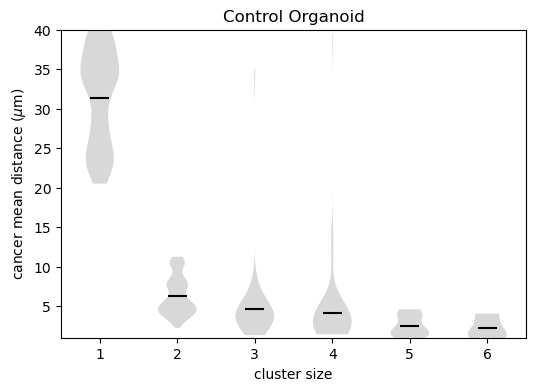

3895


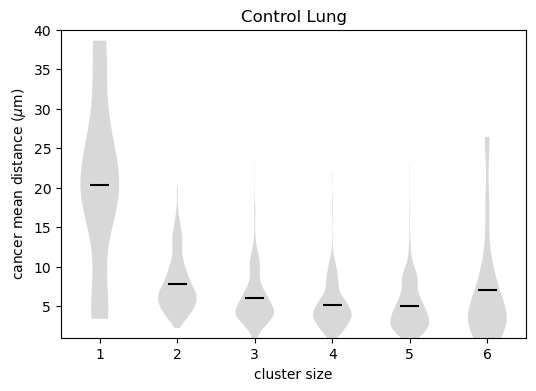

2290


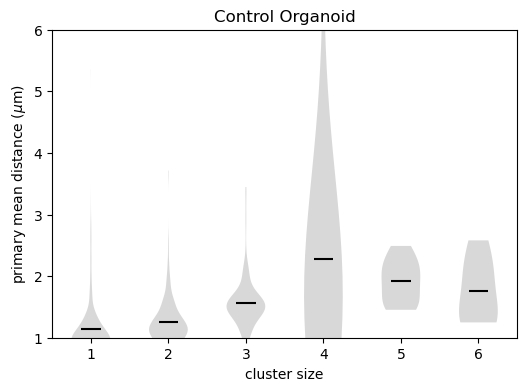

3895


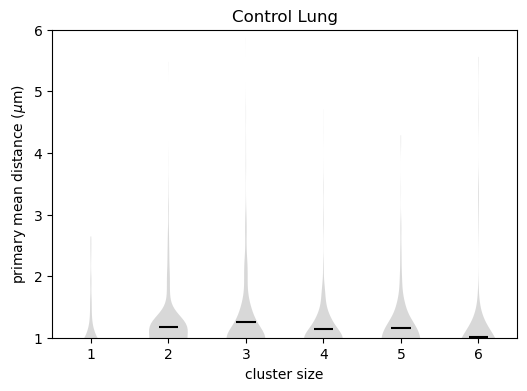

2290


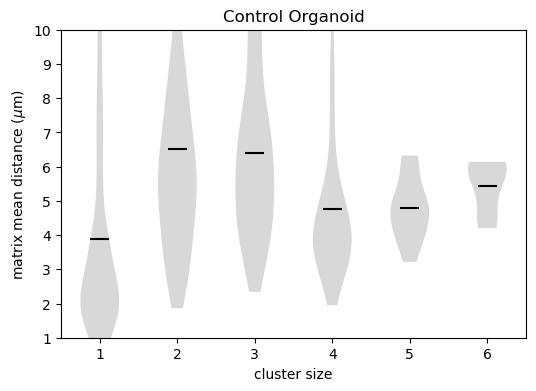

3895


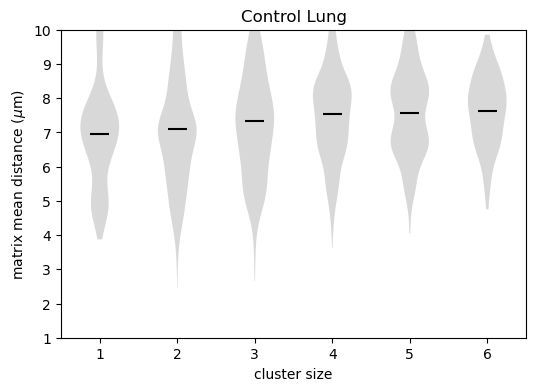

In [108]:
clusterbins=np.array([0,1,2,3,4,5,6,10,1000])
maxd=40
for i_tm in range(nf):
    indtm=np.where(np.isin(indtreatment,i_tm))[0]
    print(indtm.size)
    plt.figure(figsize=(6,4))
    ax=plt.gca()
    for i_size in range(1,clusterbins.size):
        inds=np.where(np.logical_and(cluster_sizes>=clusterbins[i_size-1],cluster_sizes<clusterbins[i_size]))[0]
        inds=np.intersect1d(inds,indtm)
        setv=cancer_mean_distance[inds]
        setv=setv[np.isfinite(setv)]
        setv=setv[setv<maxd]
        if setv.size>0:
            vplot=ax.violinplot(setv,positions=[i_size],showmeans=True,showextrema=False)#,quantiles=[.05,.95])
            vplot['cmeans'].set_color('black')
            for pc in vplot['bodies']:
                pc.set_facecolor('gray')
            xpoints=utilities.generate_xcoords_violin(vplot,[setv[np.isfinite(setv)]])
    plt.ylabel(r'cancer mean distance ($\mu$m)')
    plt.xlabel('cluster size')
    plt.title(tmSet[i_tm])

    ax.set_xticks(np.arange(1,clusterbins.size))
    ax.set_xticklabels(clusterbins[0:-1],rotation=0)
    plt.ylim(1,maxd)
    plt.xlim(1.5,7.5)
    plt.savefig(f'{date}/cancer_dist_{tmSet[i_tm]}.png')
    plt.savefig(f'{date}/cancer_dist_{tmSet[i_tm]}.svg')
    plt.pause(.1)

for i_tm in range(nf):
    indtm=np.where(np.isin(indtreatment,i_tm))[0]
    print(indtm.size)
    plt.figure(figsize=(6,4))
    ax=plt.gca()
    for i_size in range(1,clusterbins.size):
        inds=np.where(np.logical_and(cluster_sizes>=clusterbins[i_size-1],cluster_sizes<clusterbins[i_size]))[0]
        inds=np.intersect1d(inds,indtm)
        setv=primary_mean_distance[inds]
        setv=setv[np.isfinite(setv)]
        setv=setv[setv<maxd]
        if setv.size>0:
            vplot=ax.violinplot(setv,positions=[i_size],showmeans=True,showextrema=False)#,quantiles=[.05,.95])
            vplot['cmeans'].set_color('black')
            for pc in vplot['bodies']:
                pc.set_facecolor('gray')
            xpoints=utilities.generate_xcoords_violin(vplot,[setv[np.isfinite(setv)]])
    plt.ylabel(r'primary mean distance ($\mu$m)')
    plt.xlabel('cluster size')
    plt.title(tmSet[i_tm])

    ax.set_xticks(np.arange(1,clusterbins.size))
    ax.set_xticklabels(clusterbins[0:-1],rotation=0)
    plt.ylim(1,6)
    plt.xlim(1.5,7.5)
    plt.savefig(f'{date}/primary_dist_{tmSet[i_tm]}.png')
    plt.savefig(f'{date}/primary_dist_{tmSet[i_tm]}.svg')
    plt.pause(.1)

for i_tm in range(nf):
    indtm=np.where(np.isin(indtreatment,i_tm))[0]
    print(indtm.size)
    plt.figure(figsize=(6,4))
    ax=plt.gca()
    for i_size in range(1,clusterbins.size):
        inds=np.where(np.logical_and(cluster_sizes>=clusterbins[i_size-1],cluster_sizes<clusterbins[i_size]))[0]
        inds=np.intersect1d(inds,indtm)
        setv=matrix_mean_distance[inds]
        setv=setv[np.isfinite(setv)]
        setv=setv[setv<maxd]
        if setv.size>0:
            vplot=ax.violinplot(setv,positions=[i_size],showmeans=True,showextrema=False)#,quantiles=[.05,.95])
            vplot['cmeans'].set_color('black')
            for pc in vplot['bodies']:
                pc.set_facecolor('gray')
            xpoints=utilities.generate_xcoords_violin(vplot,[setv[np.isfinite(setv)]])
    plt.ylabel(r'matrix mean distance ($\mu$m)')
    plt.xlabel('cluster size')
    plt.title(tmSet[i_tm])

    ax.set_xticks(np.arange(1,clusterbins.size))
    ax.set_xticklabels(clusterbins[0:-1],rotation=0)
    plt.ylim(1,10)
    plt.xlim(1.5,7.5)
    plt.savefig(f'{date}/matrix_dist_{tmSet[i_tm]}.png')
    plt.savefig(f'{date}/matrix_dist_{tmSet[i_tm]}.svg')
    plt.pause(.1)

/tmp/ipykernel_7906/2482362013.py:46: RuntimeWarning: Mean of empty slice
  meanSet_erk[i_tm] = np.nanmean(trajs_erk, axis=0)


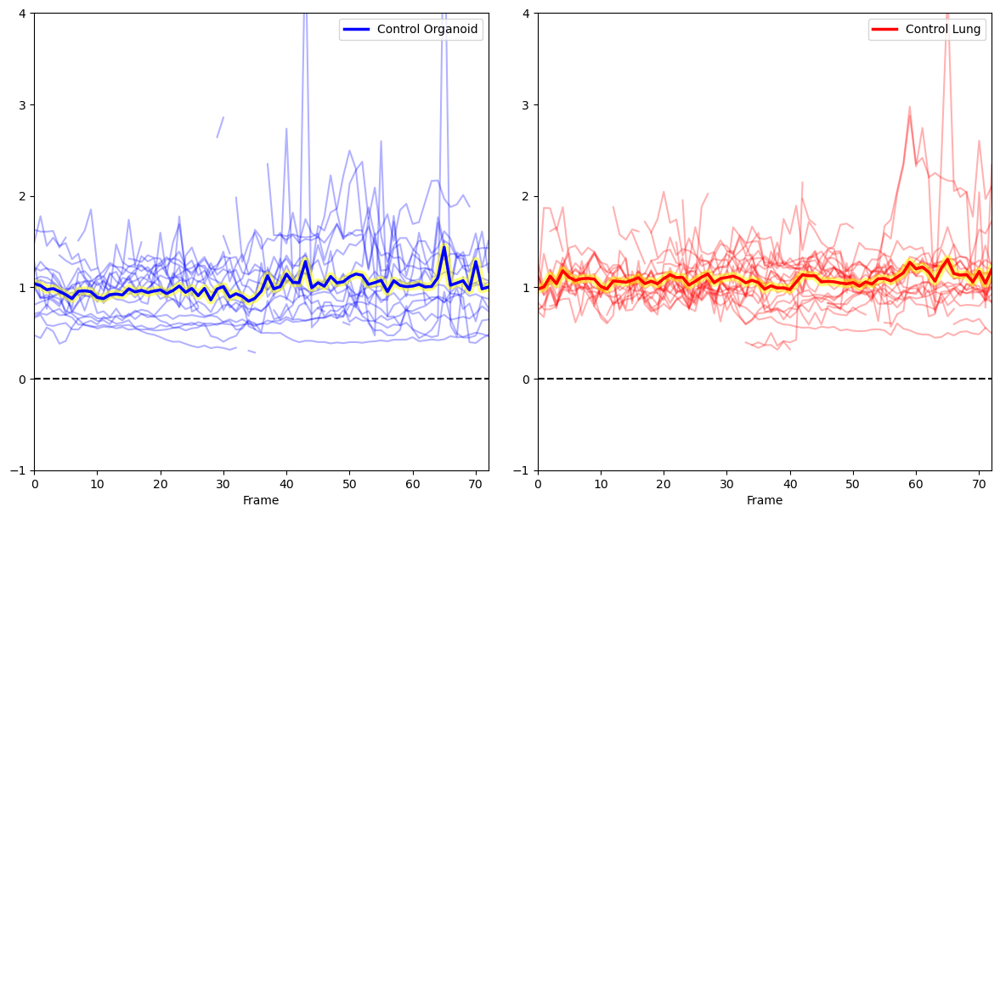

In [111]:
import matplotlib.pyplot as plt
import numpy as np

# Create subplots based on the number of treatments
nplots = int(np.ceil(np.sqrt(len(tmSet))))
fig, ax = plt.subplots(nplots, nplots, figsize=(12, 12))
ax = ax.flatten()

# Set minimum trajectory length
min_traj_len = 50
nt = 200  # Number of time points

trajSet_erk = [None] * len(tmSet)
trajSet_akt = [None] * len(tmSet)
meanSet_erk = [None] * len(tmSet)
meanSet_akt = [None] * len(tmSet)

for i_tm in range(len(tmSet)):
    ind_models = np.where(inds_tmSet_models == i_tm)[0]
    ind_models = np.intersect1d(ind_models, indgood_models)
    trajs_erk = np.zeros((0, nt))

    current_treatment = tmSet[i_tm]
    color = colorSet[i_tm]

    for imodel in ind_models:
        for itraj in range(len(modelSet[imodel].trajectories)):
            trajlen = modelSet[imodel].trajectories[itraj].size
            if trajlen > min_traj_len:
                inds = modelSet[imodel].trajectories[itraj]
                frames = modelSet[imodel].cells_frameSet[inds]
                cr_erk = modelSet[imodel].x_signal[inds]

                # Initialize trajectory arrays with NaNs
                tr_erk = np.ones(nt) * np.nan
                tr_akt = np.ones(nt) * np.nan
                tr_erk[frames] = cr_erk

                # Append the trajectory data
                trajs_erk = np.append(trajs_erk, tr_erk[np.newaxis, :], axis=0)

                # Plot individual trajectories
                ax[i_tm].plot(frames, cr_erk, '-', color=color, alpha=0.3)

    # Calculate and plot mean trajectory
    meanSet_erk[i_tm] = np.nanmean(trajs_erk, axis=0)
    ax[i_tm].plot(np.arange(nt), meanSet_erk[i_tm], '-', color='yellow', alpha=0.5, linewidth=7.5)
    ax[i_tm].plot(np.arange(nt), meanSet_erk[i_tm], '-', color=color, alpha=1.0, linewidth=2.5, label=tmSet[i_tm])

    # Add baseline line and set plot properties
    ax[i_tm].plot([0, nt], [0, 0], 'k--')
    ax[i_tm].set_xlim(0, np.max(np.where(np.isfinite(meanSet_erk[i_tm]))[0], initial=0))
    ax[i_tm].set_ylim(-1, 4)
    ax[i_tm].set_xlabel('Frame')
    ax[i_tm].legend(loc='upper right')

    # Store trajectory data
    trajSet_erk[i_tm] = trajs_erk.copy()

plt.tight_layout()

for i_ax in range(i_tm+1,nplots*nplots):
    ax[i_ax].axis('off')
    
plt.savefig(os.path.join(date, f'ERK_signaling_lineplot_.png'))
plt.savefig(os.path.join(date, f'ERK_signaling_lineplot_.svg'), format='svg')

plt.show()

In [112]:
feature_list=[]
Xpca=np.zeros((cratio_erk.size,0)) #use this if you want to leave out pca morphology features

Xpca=np.concatenate((Xpca,cancer_contact_fraction[:,np.newaxis]),axis=1)
feature_list.append('cancer contact fraction')

Xpca=np.concatenate((Xpca,primary_contact_fraction[:,np.newaxis]),axis=1)
feature_list.append('primary contact fraction')

print(feature_list)

for i in indgood_models:
   indsf=np.where(indcells_models==i)[0]
   modelSet[i].Xpca=Xpca[indsf,:]

ndim=Xpca.shape[1]

['cancer contact fraction', 'primary contact fraction']


## Section 9 – Trajectory embedding and state analysis

This section embeds single-cell or trajectory-level features into a lower-dimensional space for visualization and clustering.
For example, it may:

- Assemble features into a matrix and apply UMAP or related methods.
- Identify distinct dynamical or signaling states as clusters.
- Visualize trajectories in embedded space colored by treatment or ERK state.


### Overview: Section 9

This section embeds trajectories into lower dimensions.

**Biological purpose:**  
Reveal dynamical states or clusters in trajectory feature space.

**What happens here:**  
- Assemble trajectory feature matrices  
- Apply PCA/UMAP  
- Visualize state distributions  
- Identify trajectory clusters  

**Key Parameters:**  
- Number of PCA components  
- UMAP distance metric  
- Minimum trajectory length  

**Outputs produced:**  
- Embedded coordinates  
- Cluster/state assignments  



---


### Trajectory Embedding and State Analysis

/home/wsltools/anaconda3/envs/celltraj_env/lib/python3.9/site-packages/trajectory.py:2615: RuntimeWarning: invalid value encountered in scalar divide
  dxcorr[it] = dxcorr[it] / tnorm[it]
/tmp/ipykernel_7906/4174492553.py:8: RuntimeWarning: Mean of empty slice
  av_sq = np.sum(np.power(np.nanmean(sctm.Xpca, axis=0), 2))
/tmp/ipykernel_7906/4174492553.py:9: RuntimeWarning: Mean of empty slice
  avsq = np.nanmean(np.power(np.linalg.norm(sctm.Xpca, axis=1), 2))


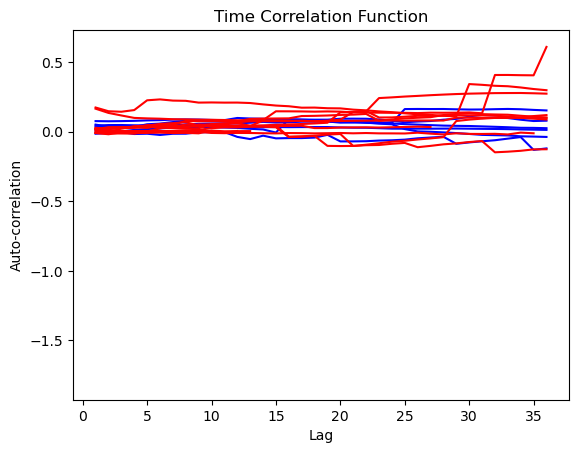

In [113]:
tcfSet = [None] * nmodels

for imodel in indgood_models:
    i_tm=inds_tmSet_models[imodel]
    sctm = modelSet[imodel]
    tcf = sctm.get_tcf(x=sctm.Xpca, minlength=1)
    if tcf.size > 0:
        av_sq = np.sum(np.power(np.nanmean(sctm.Xpca, axis=0), 2))
        avsq = np.nanmean(np.power(np.linalg.norm(sctm.Xpca, axis=1), 2))
        tcf = (tcf - av_sq) / tcf[0]  # Auto-correlation
        tcfSet[imodel] = tcf
        
        current_treatment = tmSet[inds_tmSet_models[imodel]]
        color = colorSet[i_tm]  # Default to 'grey' if not found
        
        # Plot with the correct color
        plt.plot(np.arange(1, tcf.size + 1), tcf, color=color, label=current_treatment)

plt.xlabel('Lag')
plt.ylabel('Auto-correlation')
plt.title('Time Correlation Function')
plt.show()


Control Organoid models [ 1  2  3  4  5  6  8 11 12 13]
Control Lung models [14 15 16 17 18 19 20 22 28 29 30 31]


/tmp/ipykernel_7906/3553717031.py:19: RuntimeWarning: Mean of empty slice
  tcf_tm[i_tm] = np.nanmean(tcfs, axis=1)


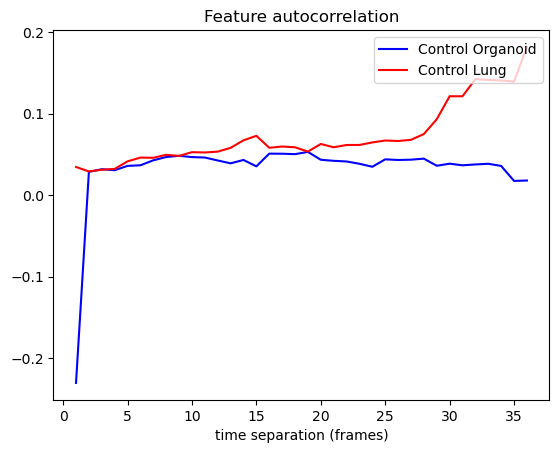

In [114]:
n_tm=len(tmSet)
nf = n_tm
tcf_tm = [None] * nf
tmax = 60

for i_tm in range(nf):
    ind_models = indgood_models[inds_tmSet_models[indgood_models] == i_tm]
    print(f'{tmSet[i_tm]} models {ind_models}')
    tcfs = np.ones((tmax, ind_models.size)) * np.nan

    for ii in range(ind_models.size):
        try:
            tmax_model = tcfSet[ind_models[ii]].size
            tmax_model = np.min(np.array([tmax, tmax_model]))
            tcfs[0:tmax_model, ii] = tcfSet[ind_models[ii]][0:tmax_model]
        except Exception as e:
            print(e)

    tcf_tm[i_tm] = np.nanmean(tcfs, axis=1)

    color = colorSet[i_tm]  # Default to 'grey' if not found

    # Plot with the correct color
    plt.plot(np.arange(1, tmax + 1), tcf_tm[i_tm], color=color, label=tmSet[i_tm])

# Customize plot labels and title
plt.title('Feature autocorrelation')
plt.xlabel('time separation (frames)')
plt.legend(loc='upper right')
plt.savefig(f'{date}/tcf.svg')
plt.show()


In [115]:
#trajectory embedding
#choose a trajectory length where there is decay
trajl=1
ndim=modelSet[indgood_models[0]].Xpca.shape[1]
Xpcat=np.zeros((0,ndim*trajl))
indmodel_traj=np.array([]).astype(int)
indstack_traj=np.array([]).astype(int)
indframes_traj=np.array([]).astype(int)
cellinds0_traj=np.array([]).astype(int)
cellinds1_traj=np.array([]).astype(int)
cancer_cf_traj=np.array([])
primary_cf_traj=np.array([])
matrix_cf_traj=np.array([])
cratio_erk_traj=np.array([]).astype(float)
cratio_erk_full_traj=np.zeros((0,trajl))
cancer_cf_full_traj=np.zeros((0,trajl))
primary_cf_full_traj=np.zeros((0,trajl))
matrix_cf_full_traj=np.zeros((0,trajl))
dx_full_traj=np.zeros((0,trajl))
dx_traj=np.array([])
for i in indgood_models:
    print('building trajectory data for model {}...'.format(i))
    modelSet[i].trajectories=all_trajSet[i].copy()
    modelSet[i].trajl=trajl
    modelSet[i].traj=modelSet[i].get_traj_segments(trajl)
    data=modelSet[i].Xpca[modelSet[i].traj,:]
    data=data.reshape(modelSet[i].traj.shape[0],modelSet[i].Xpca.shape[1]*trajl)
    indgood=np.where(np.sum(np.isnan(data),axis=1)==0)[0]
    data=data[indgood,:]
    modelSet[i].traj=modelSet[i].traj[indgood,:]
    Xpcat=np.append(Xpcat,data,axis=0)
    indmodel_traj=np.append(indmodel_traj,i*np.ones(data.shape[0]).astype(int))
    indstacks=modelSet[i].cells_imgfileSet[modelSet[i].traj[:,0]]
    indstack_traj=np.append(indstack_traj,indstacks)
    indframes=modelSet[i].cells_frameSet[modelSet[i].traj[:,-1]]
    indframes_traj=np.append(indframes_traj,indframes)
    cellinds0=modelSet[i].traj[:,0]
    cellinds0_traj=np.append(cellinds0_traj,cellinds0)
    cellinds1=modelSet[i].traj[:,-1]
    cellinds1_traj=np.append(cellinds1_traj,cellinds1)
    cratio_erk_traj=np.append(cratio_erk_traj,modelSet[i].x_signal[cellinds1])
    cratio_erk_full_traj=np.append(cratio_erk_full_traj,modelSet[i].x_signal[modelSet[i].traj],axis=0)
    cancer_cf_traj=np.append(cancer_cf_traj,modelSet[i].cancer_contact_fraction[cellinds1])
    primary_cf_traj=np.append(primary_cf_traj,modelSet[i].primary_contact_fraction[cellinds1])
    matrix_cf_traj=np.append(matrix_cf_traj,modelSet[i].matrix_contact_fraction[cellinds1])
    cancer_cf_full_traj=np.append(cancer_cf_full_traj,modelSet[i].cancer_contact_fraction[modelSet[i].traj],axis=0)
    primary_cf_full_traj=np.append(primary_cf_full_traj,modelSet[i].primary_contact_fraction[modelSet[i].traj],axis=0)
    matrix_cf_full_traj=np.append(matrix_cf_full_traj,modelSet[i].matrix_contact_fraction[modelSet[i].traj],axis=0)
    dx_traj=np.append(dx_traj,modelSet[i].dx[cellinds1])
    dx_full_traj=np.append(dx_full_traj,modelSet[i].dx[modelSet[i].traj],axis=0)

cellinds0_traj=cellinds0_traj.astype(int)
cellinds1_traj=cellinds1_traj.astype(int)

x=Xpcat #x=np.matmul(Xpcat,np.real(M)) #x=np.concatenate((np.real(np.matmul(Xpcat,M)),np.imag(np.matmul(Xpcat,M))),axis=1) #x=np.concatenate((np.real(phi_X[:,indmodes_M1]),np.imag(phi_X[:,indmodes_M1])),axis=1)
for i in indgood_models:
    modelSet[i].trajectories=all_trajSet[i].copy()

neigen=x.shape[1]
inds_conditions=[None]*nf
for imf in range(nf):
    indmodels=np.intersect1d(indgood_models,np.where(inds_tmSet_models==imf)[0])
    indstm=np.array([])
    for imodel in indmodels:
        indtm=np.where(indmodel_traj==imodel)
        indstm=np.append(indstm,indtm)
    inds_conditions[imf]=indstm.astype(int).copy()

neigen=x.shape[1]
inds_conditions=[None]*nf
for imf in range(nf):
    indmodels=np.intersect1d(indgood_models,np.where(inds_tmSet_models==imf)[0])
    indstm=np.array([])
    for imodel in indmodels:
        indtm=np.where(indmodel_traj==imodel)
        indstm=np.append(indstm,indtm)
    inds_conditions[imf]=indstm.astype(int).copy()

#get transitions in the trajectory embedding space
x0set=np.zeros((0,neigen))
x1set=np.zeros((0,neigen))
inds_trajsteps_models=np.array([]).astype(int)
inds_trajsteps=np.zeros((0,2)).astype(int)
for i in indgood_models:
    print('getting flows from model: '+str(i))
    indstm=np.where(indmodel_traj==i)[0]
    if indstm.size>0:
        modelSet[i].Xtraj=x[indstm,0:neigen]
        indstm_model=indstm-np.min(indstm) #index in model
        modelSet[i].get_trajectory_steps(inds=None,get_trajectories=False,traj=modelSet[i].traj[indstm_model,:],Xtraj=modelSet[i].Xtraj[indstm_model,:])
        x0=modelSet[i].Xtraj0
        x1=modelSet[i].Xtraj1
        x0set=np.append(x0set,x0,axis=0)
        x1set=np.append(x1set,x1,axis=0)
        inds_trajsteps_models=np.append(inds_trajsteps_models,np.ones(x0.shape[0]).astype(int)*i)
        inds_trajsteps=np.append(inds_trajsteps,modelSet[i].inds_trajp1,axis=0)

building trajectory data for model 1...
building trajectory data for model 2...
building trajectory data for model 3...
building trajectory data for model 4...
building trajectory data for model 5...
building trajectory data for model 6...
building trajectory data for model 8...
building trajectory data for model 11...
building trajectory data for model 12...
building trajectory data for model 13...
building trajectory data for model 14...
building trajectory data for model 15...
building trajectory data for model 16...
building trajectory data for model 17...
building trajectory data for model 18...
building trajectory data for model 19...
building trajectory data for model 20...
building trajectory data for model 22...
building trajectory data for model 28...
building trajectory data for model 29...
building trajectory data for model 30...
building trajectory data for model 31...
getting flows from model: 1
matching up trajectory 0
matching up trajectory 100
matching up trajectory 20

<a id="sec10"></a>
## Section 10 – Data-driven modeling

Here, statistical or machine-learning models are fit to the extracted features and trajectories to explain or predict behavior.
The analysis might:

- Fit regression or classification models to ERK states or outcomes.
- Use Markov models or MSMs to describe transitions between states.
- Evaluate model performance across treatments.


### Overview: Section 10

This section performs modeling-driven analyses.

**Biological purpose:**  
Fit dynamic models or statistical models to interpret cell state transitions.

**What happens here:**  
- Build transition matrices  
- Fit MSM models  
- Compare models across treatments  
- Predict ERK activation probability  

**Key Parameters:**  
- Number of states  
- Regularization parameters  
- Transition lag time  

**Outputs produced:**  
- Model fits  
- Predicted trajectories  



---


### Date Driven Modeling

In [118]:
#Analysis identifiers
figid=f'SITE_20251117_trajl{trajl}_'


In [120]:
#get microstate clusters
get_clusters=True
n_clusters=int(np.sqrt(x.shape[0]))
if get_clusters:
    clusters=coor.cluster_kmeans([x],k=n_clusters,metric='euclidean',fixed_seed=2,max_iter=100)
    np.save(f'{date}/clusters_nc{n_clusters}_{figid}.npy',clusters)
else:
    clusters=np.load(f'{date}/clusters_nc{n_clusters}_{figid}.npy',allow_pickle=True)
    clusters=clusters.item()

/home/wsltools/anaconda3/envs/celltraj_env/lib/python3.9/site-packages/decorator.py:232: PyEMMA_DeprecationWarning: Call to deprecated function "cluster_kmeans". Called from /home/wsltools/anaconda3/envs/celltraj_env/lib/python3.9/site-packages/decorator.py line 232. Use deeptime.clustering.KMeans instead.
  return caller(func, *(extras + args), **kw)


initialize kmeans++ centers:   0%|                                                            | 0/76 [00:00<?,…

kmeans iterations:   0%|                                                                     | 0/100 [00:00<?,…

In [121]:
#check out a umap of the embedding space
import sklearn
reducer=sklearn.manifold.TSNE(n_components=2)
trans = reducer.fit(x.astype(np.float32))
x_umap=trans.embedding_

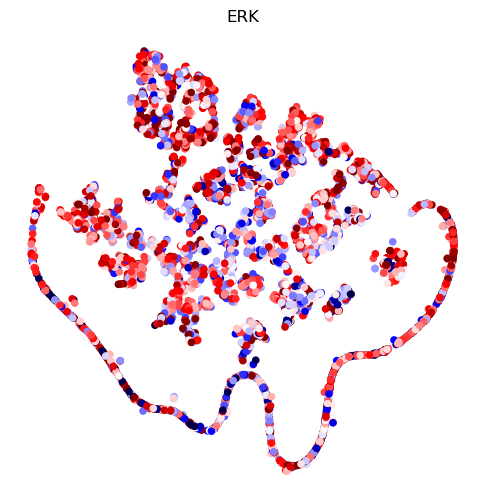

In [126]:
#plot umap of the embedding space
fig,ax=plt.subplots(1,1,figsize=(6,6))

ax.scatter(x_umap[:,0],x_umap[:,1],s=20,c=cratio_erk_traj,cmap=plt.cm.seismic,clim=(lowcut,highcut))
ax.set_title('ERK')
ind_clusters=clusters.assign(x)
x_umap_clusters=np.zeros((n_clusters,2))
for iclust in np.unique(ind_clusters):
    indclust=np.where(ind_clusters==iclust)[0]
    x_umap_clusters[iclust,:]=np.mean(x_umap[indclust,:],axis=0)
    #ax[0].text(x_umap_clusters[iclust,0],x_umap_clusters[iclust,1],str(iclust))
    ax.axis('off')

plt.savefig(os.path.join(date, f'_UMAP_{figid}.png'))
plt.savefig(os.path.join(date, f'_UMAP_{figid}.svg'), format='svg')
plt.show()

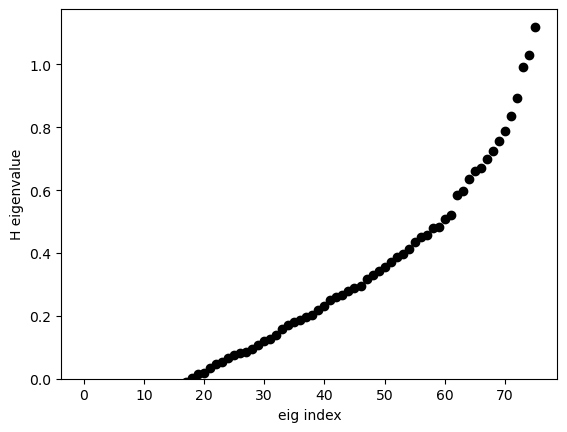

In [127]:
#Markov state model
centers_minima=clusters.clustercenters.copy()
clusters_minima=coor.clustering.AssignCenters(centers_minima, metric='euclidean')
P=model.get_transition_matrix(x0set,x1set,clusters=clusters_minima)
graph = csr_matrix(P>0.)
n_components, labels = connected_components(csgraph=graph, directed=False, return_labels=True)
unique, counts = np.unique(labels, return_counts=True)
icc=unique[np.argmax(counts)]
indcc=np.where(labels==icc)[0]
centers_minima=centers_minima[indcc,:];stateCenters=centers_minima
clusters_minima=coor.clustering.AssignCenters(centers_minima, metric='euclidean')
P=model.get_transition_matrix(x0set,x1set,clusters=clusters_minima)
n_clusters=indcc.size

H=.5*(P+np.transpose(P))+.5j*(P-np.transpose(P))
w,v=np.linalg.eig(H)
w=np.real(w)
indsort=np.argsort(w)
w=w[indsort]
v=v[:,indsort]

plt.clf()
plt.plot(np.arange(n_clusters),w,'ko',label='eigenvalues')
plt.ylim(0.,np.max(w)+.05*np.max(w))
plt.xlabel('eig index')
plt.ylabel('H eigenvalue')
plt.pause(.1)

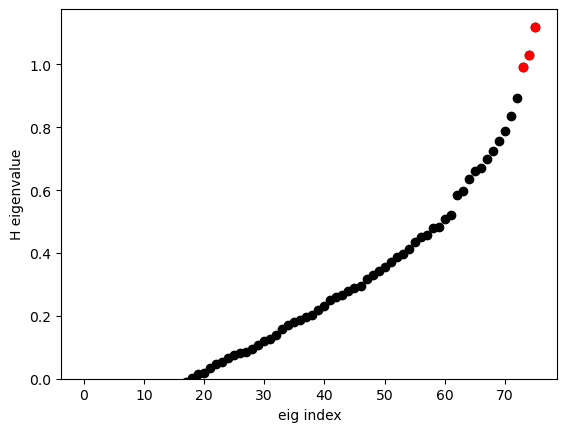

In [129]:
ncomp=3 #number of eigencomponents to keep
vr=np.multiply(w[-ncomp:],np.real(v[:,-ncomp:]))
vi=np.multiply(w[-ncomp:],np.imag(v[:,-ncomp:]))
vkin=np.append(vr,vi,axis=1)
va=np.abs(v[:,-ncomp:])
vkin=np.append(vr,vi,axis=1)
vth=np.arctan2(vr,vi)
plt.clf()
plt.plot(np.arange(n_clusters),w,'ko',label='eigenvalues')
plt.plot(np.arange(n_clusters)[-ncomp:],w[-ncomp:],'ro')
plt.ylim(0.,np.max(w)+.05*np.max(w))
plt.xlabel('eig index')
plt.ylabel('H eigenvalue')
plt.savefig(os.path.join(date, f'_eigenvalues_{figid}.png'))
plt.savefig(os.path.join(date, f'_eigenvalues_{figid}.svg'), format='svg')
plt.pause(.1)

In [100]:
"""
If you want to view a new set of coordinates based upon eigen vectors


get_cluster_embedding=True
if get_cluster_embedding:
    reducer=umap.UMAP(n_components=2) #n_neighbors=int(n_clusters),min_dist=0.1, n_components=2, metric='euclidean')
    trans = reducer.fit(vkin)
    x_clusters=trans.embedding_
    np.save(f'{date}/cluster_embedding_nc{n_clusters}_ncomp{ncomp}_{figid}.npy',x_clusters)
else:
    x_clusters=np.load(f'{date}/cluster_embedding_nc{n_clusters}_ncomp{ncomp}_{figid}.npy')

ind_clusters=clusters_minima.assign(x)
x_clusters_all=x_clusters[ind_clusters,:]
"""

"\nget_cluster_embedding=True\nif get_cluster_embedding:\n    reducer=umap.UMAP(n_components=2) #n_neighbors=int(n_clusters),min_dist=0.1, n_components=2, metric='euclidean')\n    trans = reducer.fit(vkin)\n    x_clusters=trans.embedding_\n    np.save(f'{date}/cluster_embedding_nc{n_clusters}_ncomp{ncomp}_{figid}.npy',x_clusters)\nelse:\n    x_clusters=np.load(f'{date}/cluster_embedding_nc{n_clusters}_ncomp{ncomp}_{figid}.npy')\n\nind_clusters=clusters_minima.assign(x)\nx_clusters_all=x_clusters[ind_clusters,:]\n"

In [130]:
#to visualize in a different basis
##view in the direct contact coordinates
ind_clusters=clusters_minima.assign(x)
x_clusters_all=np.array([cancer_cf_traj,primary_cf_traj]).T
x_clusters=np.zeros((n_clusters,2))
for iclust in range(n_clusters):
    indclust=np.where(ind_clusters==iclust)[0]
    x_clusters[iclust,:]=np.nanmean(x_clusters_all[indclust,:],axis=0)

inds_finite_traj=np.where(np.sum(np.isnan(x_clusters_all),axis=1)==0)[0]

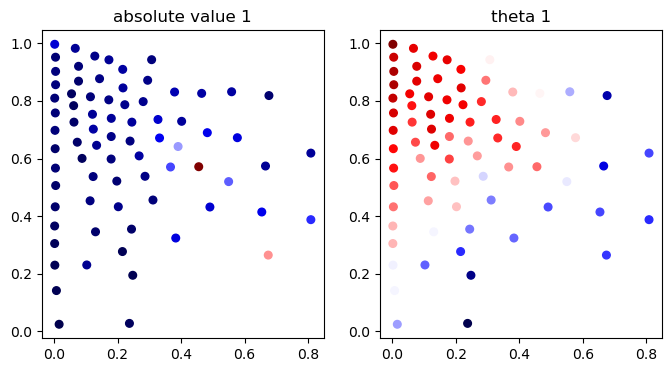

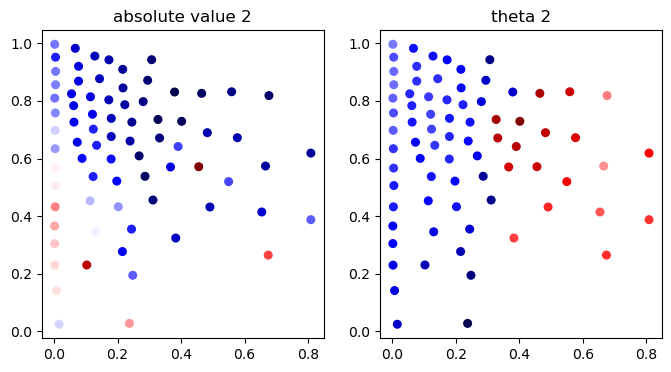

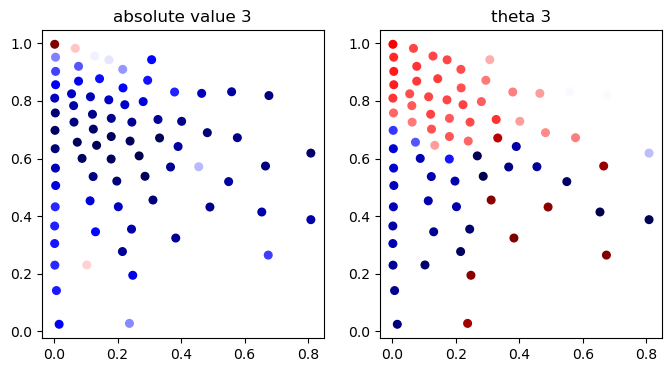

In [131]:
plt.close('all')
for icomp in range(ncomp-1,0-1,-1): #range(ncomp):
    plt.figure(figsize=(8,4))
    plt.subplot(1,2,1);plt.scatter(x_clusters[:,0],x_clusters[:,1],s=30,c=va[:,icomp],cmap=plt.cm.seismic)
    plt.title('absolute value '+str(ncomp-icomp))
    plt.subplot(1,2,2);plt.scatter(x_clusters[:,0],x_clusters[:,1],s=30,c=vth[:,icomp],cmap=plt.cm.seismic)
    plt.title('theta '+str(ncomp-icomp))
    plt.savefig(os.path.join(date, f'componentrth_'+str(ncomp-icomp)+'_H_nc'+str(n_clusters)+'_ncomp'+str(ncomp)+'_'+figid+'.png'))
    plt.savefig(os.path.join(date, f'componentrth_'+str(ncomp-icomp)+'_H_nc'+str(n_clusters)+'_ncomp'+str(ncomp)+'_'+figid+'.svg'), format='svg')

In [132]:
dx_clusters=np.zeros((nf,n_clusters,x_clusters.shape[1]))
MtSet=[None]*nf
for i in range(nf):
    indmodels=np.where(inds_tmSet_models==i)[0]
    indstm=np.array([]).astype(int)
    for imodel in indmodels:
        indstm=np.append(indstm,np.where(inds_trajsteps_models==imodel)[0].astype(int))
    x0=x0set[indstm,:]
    x1=x1set[indstm,:]
    Mt=model.get_transition_matrix(x0,x1,clusters_minima)
    MtSet[i]=Mt.copy()
    dxmatrix=np.zeros((n_clusters,n_clusters,x_clusters.shape[1]))
    for ii in range(n_clusters):
        for jj in range(n_clusters):
            dxmatrix[ii,jj]=(x_clusters[jj,:]-x_clusters[ii,:])*Mt[ii,jj]
    dx_clusters[i,:,:]=np.sum(dxmatrix,axis=1)

dx_clusters_smooth=np.zeros_like(dx_clusters)
knn=5
for i in range(nf):
    for iclust in range(n_clusters):
        xc=np.array([clusters_minima.clustercenters[iclust,:]])
        dmatr=utilities.get_dmat(clusters_minima.clustercenters,xc) #get closest cells to cluster center
        indr=np.argsort(dmatr[:,0])
        indr=indr[0:knn]
        dx_clusters_smooth[i,iclust,:]=np.mean(dx_clusters[i,indr,:],axis=0)

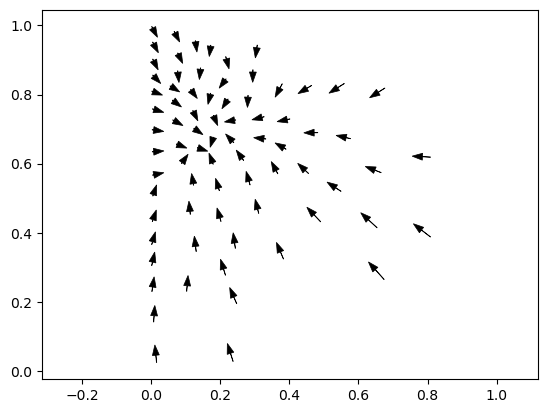

In [133]:
dxsav=np.mean(dx_clusters_smooth,axis=0)
ascale=.2
ax=plt.gca()
for ic in range(n_clusters):
    ax.arrow(x_clusters[ic,0],x_clusters[ic,1],ascale*dxsav[ic,0],ascale*dxsav[ic,1],head_width=.02,linewidth=.5,color='black',alpha=1.0)

plt.axis('equal')
plt.savefig(os.path.join(date, f'dx_clusters'+figid+'.png'))
plt.savefig(os.path.join(date, f'dx_clusters'+figid+'.svg'), format='svg')
plt.pause(.1)
plt.show()

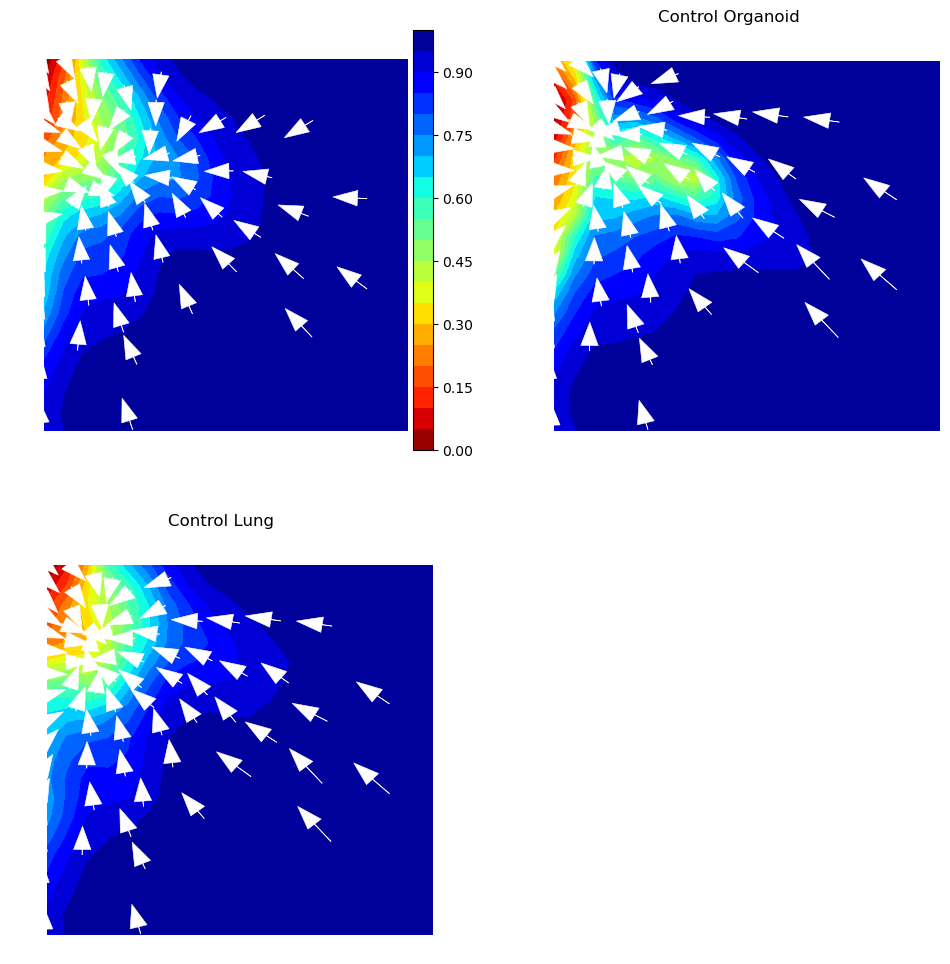

In [134]:
plt.close('all')
head_width=.04
nbins=20
fl=0
fu=192 #frames for time window
sml=1.
nplots=int(np.ceil(np.sqrt(nf+1)))
plt.figure(figsize=(12,12))
indstw=np.where(np.logical_and(indframes_traj<fu,indframes_traj>fl))[0]
probSet=[None]*nf
plt.subplot(nplots,nplots,1)
prob1,xedges1,yedges1=np.histogram2d(x_clusters_all[indstw,0],x_clusters_all[indstw,1],bins=nbins,density=True)
prob1=scipy.ndimage.gaussian_filter(prob1,sigma=sml)
prob1c=utilities.get_cdist2d(prob1)
xx,yy=np.meshgrid(.5*xedges1[1:]+.5*xedges1[0:-1],.5*yedges1[1:]+.5*yedges1[0:-1])
levels=np.linspace(0,1,21)
cs=plt.contourf(xx,yy,prob1c.T,levels=levels,cmap=plt.cm.jet_r)
cbar=utilities.colorbar(cs)
#cbar.set_label('cumulative probability')
plt.axis('off')
for ic in range(n_clusters):
    ax=plt.gca()
    ax.arrow(x_clusters[ic,0],x_clusters[ic,1],ascale*dxsav[ic,0],ascale*dxsav[ic,1],head_width=head_width,linewidth=.4,color='white',alpha=1.0)
    
for imf in range(nf):
    tm=tmSet[imf]
    indstm=inds_conditions[imf]
    indstwm=np.intersect1d(indstm,indstw)
    prob,xedges2,yedges2=np.histogram2d(x_clusters_all[indstwm,0],x_clusters_all[indstwm,1],bins=[xedges1,yedges1],density=True)
    prob=scipy.ndimage.gaussian_filter(prob,sigma=sml)
    probc=utilities.get_cdist2d(prob)
    probSet[imf]=prob.copy()
    plt.subplot(nplots,nplots,imf+2)
    cs=plt.contourf(xx,yy,probc.T,levels=levels,cmap=plt.cm.jet_r,extend='both')
    dxf=dx_clusters_smooth[i,:,:]
    ax=plt.gca()
    for ic in range(n_clusters):
        ax.arrow(x_clusters[ic,0],x_clusters[ic,1],ascale*dxf[ic,0],ascale*dxf[ic,1],head_width=head_width,linewidth=.4,color='white',alpha=1.0)
    plt.title(tmSet[imf])
    cs.cmap.set_over('darkred')
    plt.axis('off')

plt.savefig(os.path.join(date, f'probflow'+figid+'.png'))
plt.savefig(os.path.join(date, f'probflow'+figid+'.svg'), format='svg')

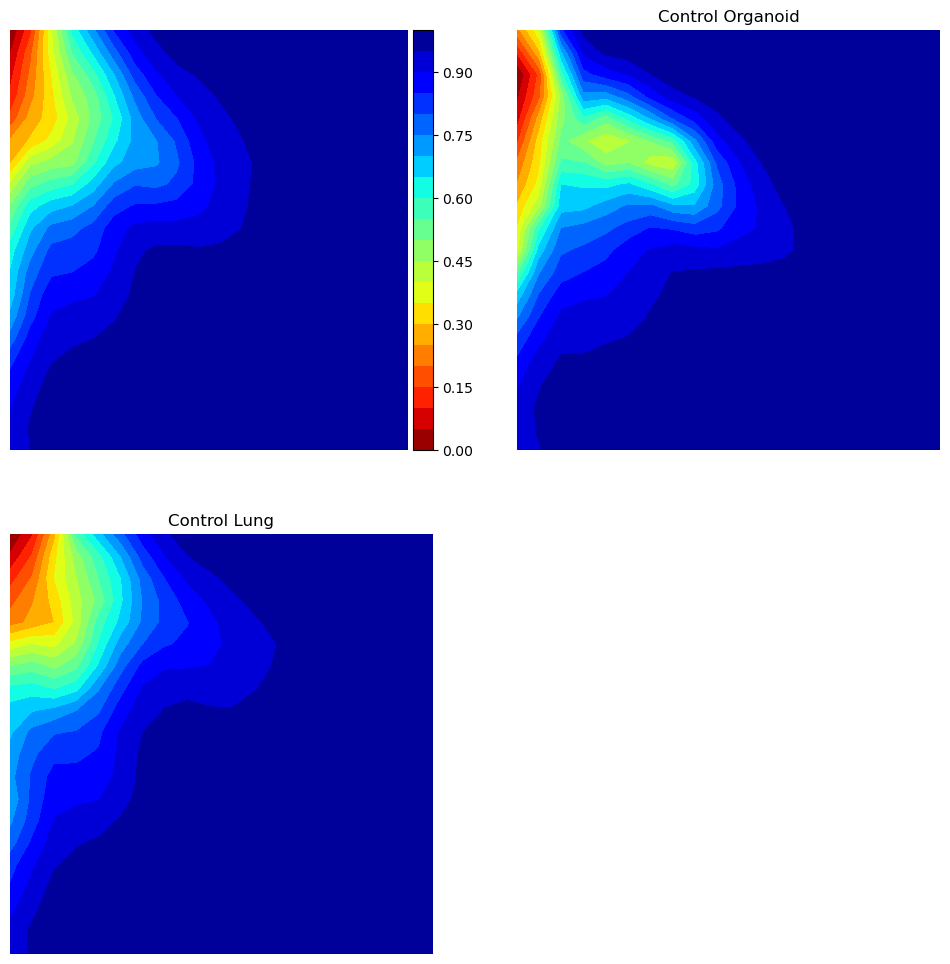

In [135]:
plt.close('all')
head_width=.04
nbins=20
fl=0
fu=72 #frames for time window
sml=1.
nplots=int(np.ceil(np.sqrt(nf+1)))
plt.figure(figsize=(12,12))
indstw=np.where(np.logical_and(indframes_traj<fu,indframes_traj>fl))[0]
probSet=[None]*nf
plt.subplot(nplots,nplots,1)
prob1,xedges1,yedges1=np.histogram2d(x_clusters_all[indstw,0],x_clusters_all[indstw,1],bins=nbins,density=True)
prob1=scipy.ndimage.gaussian_filter(prob1,sigma=sml)
prob1c=utilities.get_cdist2d(prob1)
xx,yy=np.meshgrid(.5*xedges1[1:]+.5*xedges1[0:-1],.5*yedges1[1:]+.5*yedges1[0:-1])
levels=np.linspace(0,1,21)
cs=plt.contourf(xx,yy,prob1c.T,levels=levels,cmap=plt.cm.jet_r)
cbar=utilities.colorbar(cs)
#cbar.set_label('cumulative probability')
plt.axis('off')
#for ic in range(n_clusters):
    
for imf in range(nf):
    tm=tmSet[imf]
    indstm=inds_conditions[imf]
    indstwm=np.intersect1d(indstm,indstw)
    prob,xedges2,yedges2=np.histogram2d(x_clusters_all[indstwm,0],x_clusters_all[indstwm,1],bins=[xedges1,yedges1],density=True)
    prob=scipy.ndimage.gaussian_filter(prob,sigma=sml)
    probc=utilities.get_cdist2d(prob)
    probSet[imf]=prob.copy()
    plt.subplot(nplots,nplots,imf+2)
    cs=plt.contourf(xx,yy,probc.T,levels=levels,cmap=plt.cm.jet_r,extend='both')
    dxf=dx_clusters_smooth[i,:,:]
    ax=plt.gca()
    #for ic in range(n_clusters):
    plt.title(tmSet[imf])
    cs.cmap.set_over('darkred')
    plt.axis('off')

plt.savefig(os.path.join(date, f'prob_noflows'+figid+'.png'))
plt.savefig(os.path.join(date, f'prob_noflows'+figid+'.svg'), format='svg')

IndexError: list index out of range

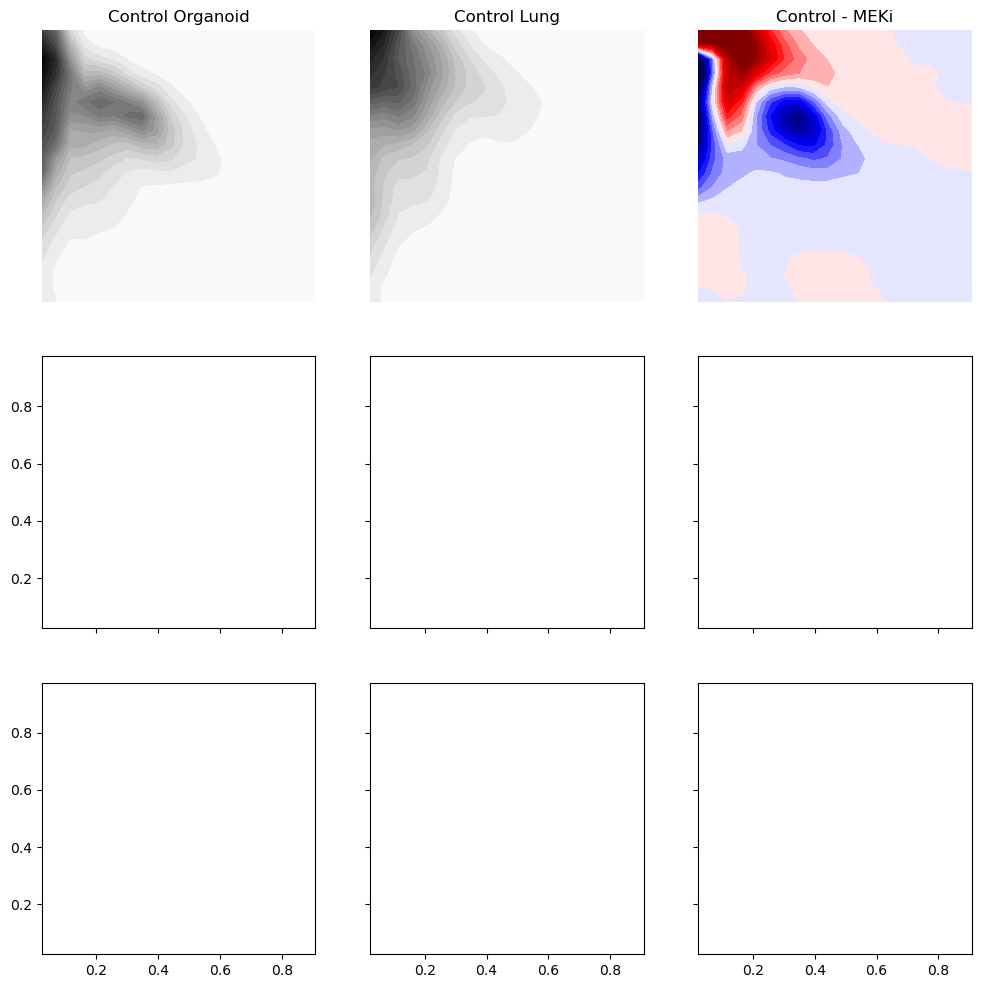

In [137]:
fig,axs=plt.subplots(3,3,sharex=True,sharey=True,figsize=(12,12))
rows=[0,1]
tms=[[0,1]]
for irow in rows:
    i_tm_ctrl=tms[irow][0]
    i_tm_meki=tms[irow][1]
    prob_ctrl=probSet[i_tm_ctrl]/np.sum(probSet[i_tm_ctrl])
    probc_ctrl=utilities.get_cdist2d(prob_ctrl)
    cs=axs[irow,0].contourf(xx,yy,probc_ctrl.T,levels=levels,cmap=plt.cm.binary_r,extend='both')
    axs[irow,0].set_title(tmSet[i_tm_ctrl])
    axs[irow,0].axis('off')
    

    axs[irow,1].axis('off')
    cs=axs[irow,2].contourf(xx,yy,prob_meki.T-prob_ctrl.T,levels=.02*(levels-.5),cmap=plt.cm.seismic,extend='both')
    axs[irow,2].set_title('Control - MEKi')
    axs[irow,2].axis('off')

prob_gland=probSet[3]/np.sum(probSet[3])
prob_lung=probSet[0]/np.sum(probSet[0])
cs=axs[irow+1,0].contourf(xx,yy,prob_gland.T-prob_lung.T,levels=.02*(levels-.5),cmap=plt.cm.seismic,extend='both')
axs[irow+1,0].set_title('Control gland - Control lung')
axs[irow+1,0].axis('off')



plt.savefig(f'{date}/prob_contactspace_differences.svg')

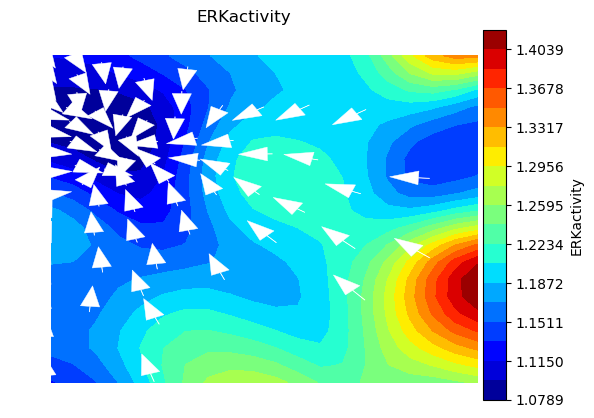

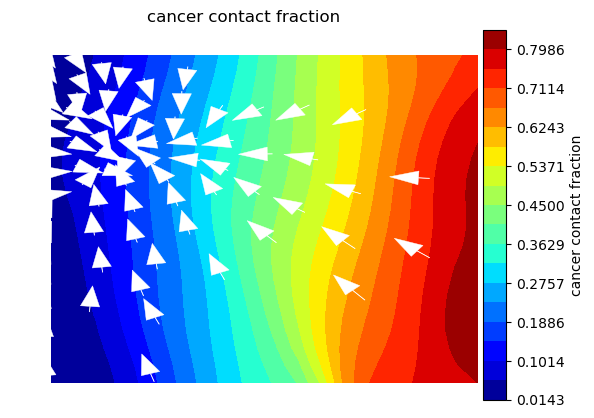

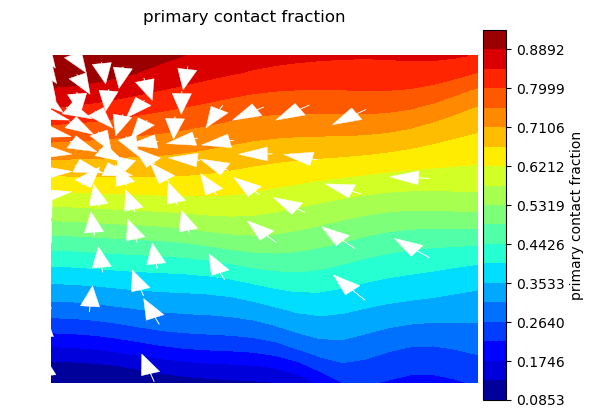

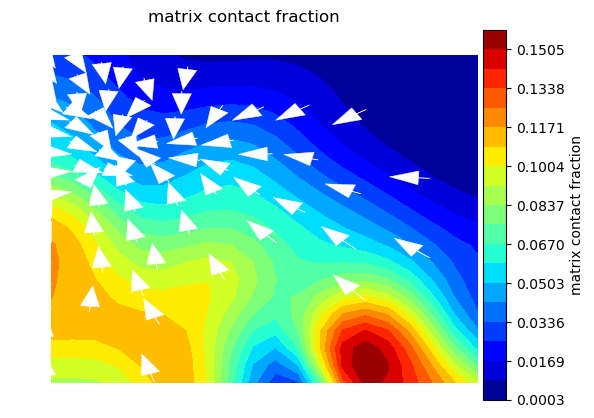

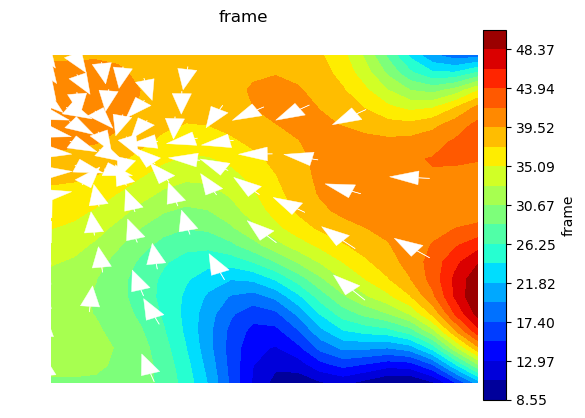

Contour levels must be increasing


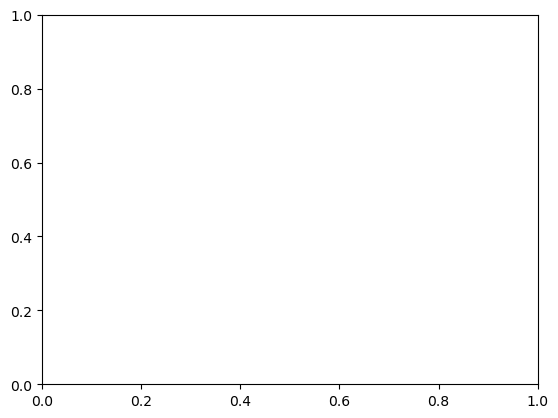

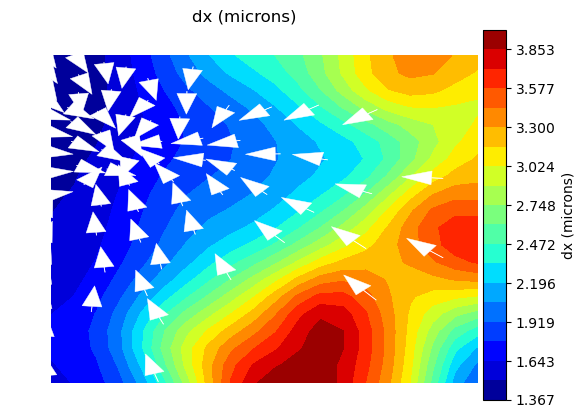

In [138]:
sml=2.
head_width=.04
cratio_erk_var_traj=np.std(cratio_erk_full_traj,axis=1)
vsetList=[cratio_erk_traj,cancer_cf_traj,primary_cf_traj,matrix_cf_traj,indframes_traj,cratio_erk_var_traj,dx_traj]#,dx_traj,beta_traj,alpha_traj,erk_akt_crosscorr]
captionset=['ERKactivity','cancer contact fraction','primary contact fraction','matrix contact fraction','frame','ERKvariability',r'dx (microns)'] #,'motility alignment (beta)','contact avoidance (alpha)','ERK-AKT timec ross-corr']
nf=len(tmSet)
nbins=20
for iv in range(len(vsetList)):
    try:
        vset=vsetList[iv]
        indg=np.where(np.logical_and(np.logical_not(np.isnan(vset)),np.logical_not(np.isinf(vset))))[0]
        plt.figure()
        vdist1,xedges1,yedges1=np.histogram2d(x_clusters_all[indg,0],x_clusters_all[indg,1],bins=nbins,weights=vset[indg])
        vdist1=scipy.ndimage.gaussian_filter(vdist1,sigma=sml)
        norm1,xedges1,yedges1=np.histogram2d(x_clusters_all[indg,0],x_clusters_all[indg,1],bins=[xedges1,yedges1])
        norm1=scipy.ndimage.gaussian_filter(norm1,sigma=sml)
        vdist1=np.divide(vdist1,norm1)
        indnan=np.where(np.isnan(vdist1))
        indgood=np.where(np.logical_and(np.logical_not(np.isnan(vdist1)),np.logical_not(np.isinf(vdist1))))
        xedges1c=.5*(xedges1[1:]+xedges1[0:-1])
        yedges1c=.5*(yedges1[1:]+yedges1[0:-1])
        xx,yy=np.meshgrid(xedges1c,yedges1c)
        levels=np.linspace(np.min(vdist1[indgood]),np.max(vdist1[indgood]),20)
        cs=plt.contourf(xx,yy,vdist1.T,cmap=plt.cm.jet,levels=levels)
        for ic in range(n_clusters):
            ax=plt.gca()
            ax.arrow(x_clusters[ic,0],x_clusters[ic,1],ascale*dxsav[ic,0],ascale*dxsav[ic,1],head_width=head_width,linewidth=.3,color='white',alpha=1.0)
        cs.cmap.set_over('darkred')
        cs.cmap.set_under('darkblue')
        cbar=utilities.colorbar(cs)
        cbar.set_label(captionset[iv])
        #cbar.set_label('cell-cell boundary fraction')
        #cbar.set_label('speed')
        #cbar.set_label('beta')
        plt.title(captionset[iv])
        plt.axis('off')
        plt.savefig(os.path.join(date, f''+captionset[iv]+'_wflows_comb_'+figid+'.png'))
        plt.savefig(os.path.join(date, f''+captionset[iv]+'_wflows_comb_'+figid+'.svg'), format='svg')   
        plt.pause(.4)
    except Exception as e:
        print(e)

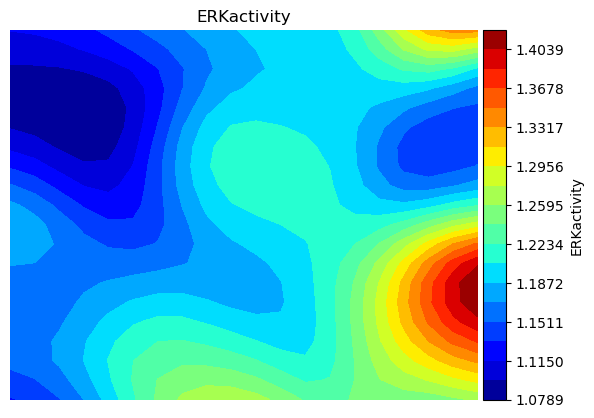

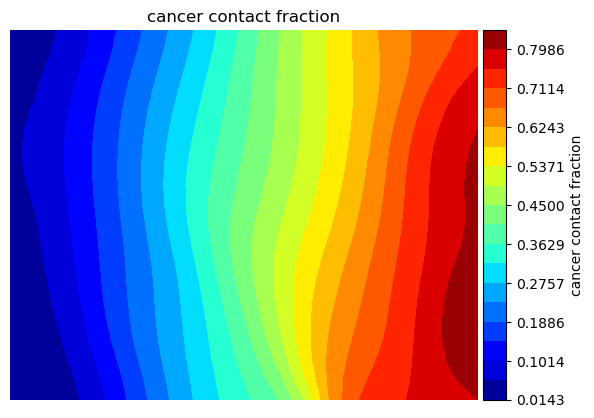

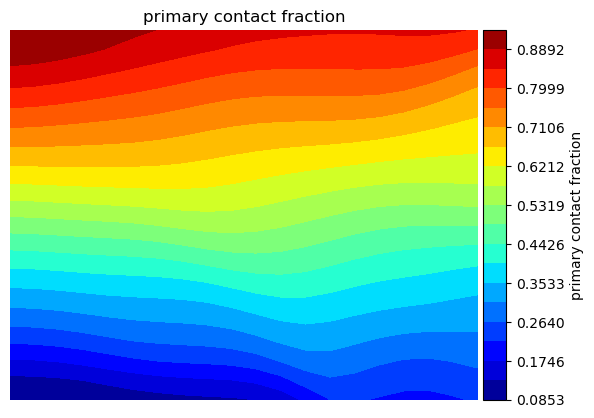

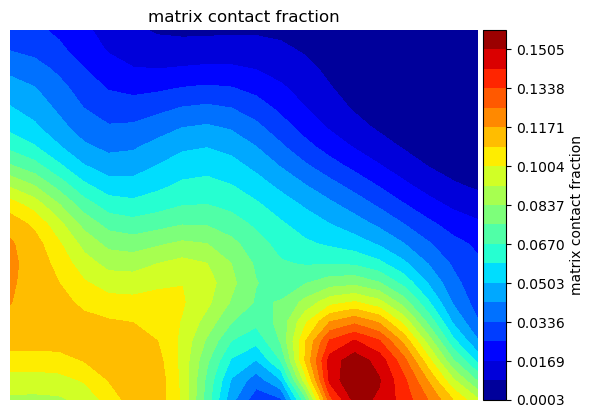

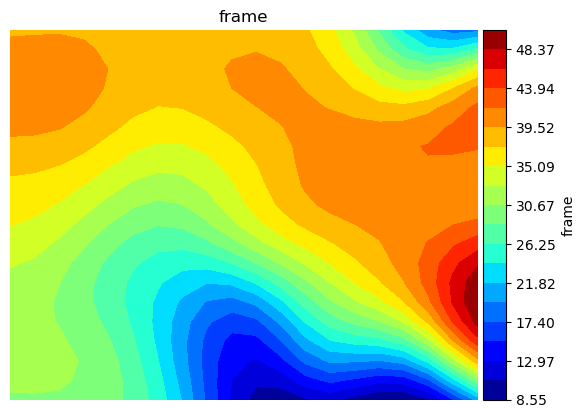

Contour levels must be increasing


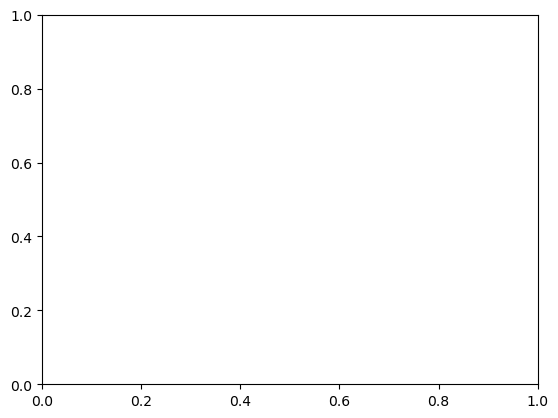

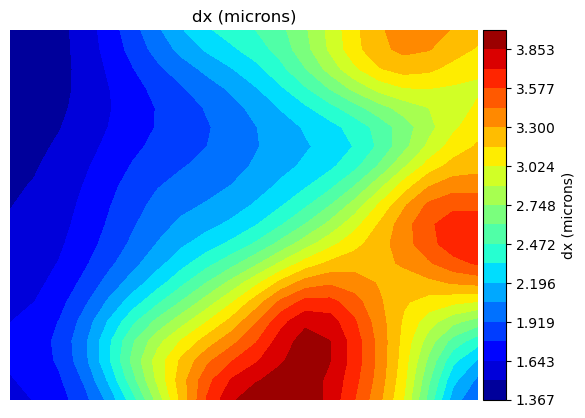

In [139]:
sml=2.
head_width=.04
cratio_erk_var_traj=np.std(cratio_erk_full_traj,axis=1)
vsetList=[cratio_erk_traj,cancer_cf_traj,primary_cf_traj,matrix_cf_traj,indframes_traj,cratio_erk_var_traj,dx_traj]#,dx_traj,beta_traj,alpha_traj,erk_akt_crosscorr]
captionset=['ERKactivity','cancer contact fraction','primary contact fraction','matrix contact fraction','frame','ERKvariability','dx (microns)'] #,'motility alignment (beta)','contact avoidance (alpha)','ERK-AKT timec ross-corr']
nf=len(tmSet)
nbins=20
for iv in range(len(vsetList)):
    try:
        vset=vsetList[iv]
        indg=np.where(np.logical_and(np.logical_not(np.isnan(vset)),np.logical_not(np.isinf(vset))))[0]
        plt.figure()
        vdist1,xedges1,yedges1=np.histogram2d(x_clusters_all[indg,0],x_clusters_all[indg,1],bins=nbins,weights=vset[indg])
        vdist1=scipy.ndimage.gaussian_filter(vdist1,sigma=sml)
        norm1,xedges1,yedges1=np.histogram2d(x_clusters_all[indg,0],x_clusters_all[indg,1],bins=[xedges1,yedges1])
        norm1=scipy.ndimage.gaussian_filter(norm1,sigma=sml)
        vdist1=np.divide(vdist1,norm1)
        indnan=np.where(np.isnan(vdist1))
        indgood=np.where(np.logical_and(np.logical_not(np.isnan(vdist1)),np.logical_not(np.isinf(vdist1))))
        xedges1c=.5*(xedges1[1:]+xedges1[0:-1])
        yedges1c=.5*(yedges1[1:]+yedges1[0:-1])
        xx,yy=np.meshgrid(xedges1c,yedges1c)
        levels=np.linspace(np.min(vdist1[indgood]),np.max(vdist1[indgood]),20)
        cs=plt.contourf(xx,yy,vdist1.T,cmap=plt.cm.jet,levels=levels)
        #for ic in range(n_clusters):
        cs.cmap.set_over('darkred')
        cs.cmap.set_under('darkblue')
        cbar=utilities.colorbar(cs)
        cbar.set_label(captionset[iv])
        #cbar.set_label('cell-cell boundary fraction')
        #cbar.set_label('speed')
        #cbar.set_label('beta')
        plt.title(captionset[iv])
        plt.axis('off')
        plt.savefig(os.path.join(date, f''+captionset[iv]+'_noflows_comb_'+figid+'.png'))
        plt.savefig(os.path.join(date, f''+captionset[iv]+'_noflows_comb_'+figid+'.svg'), format='svg')   
        plt.pause(.4)
    except Exception as e:
        print(e)

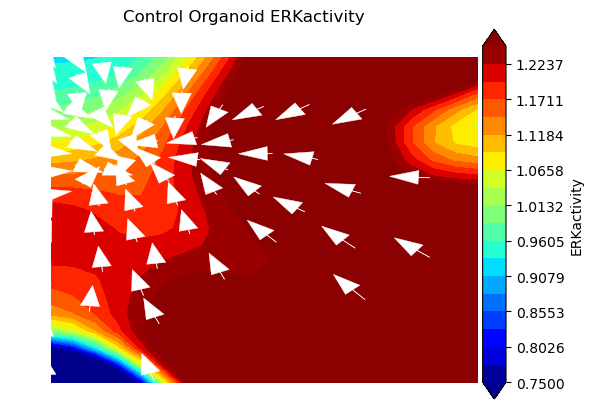

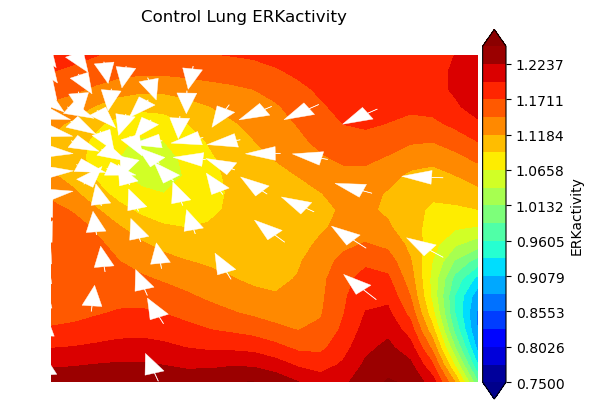

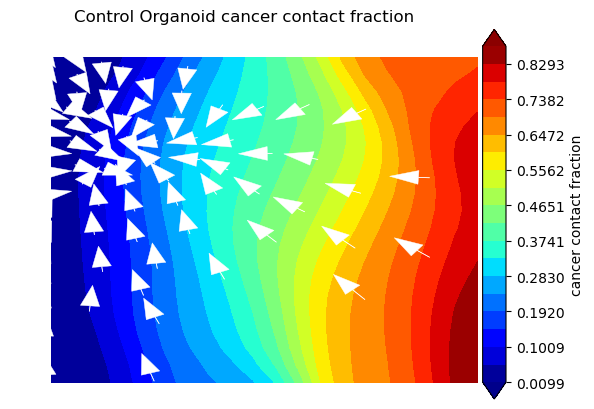

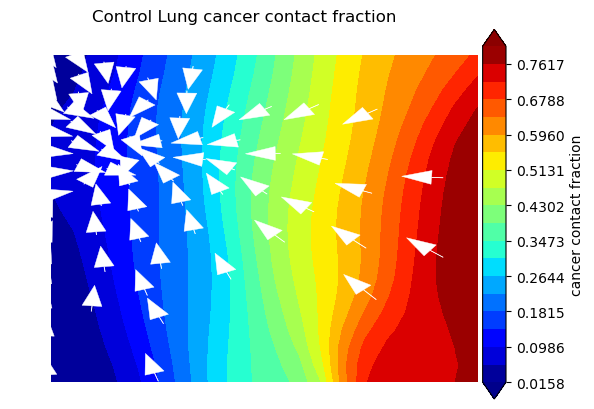

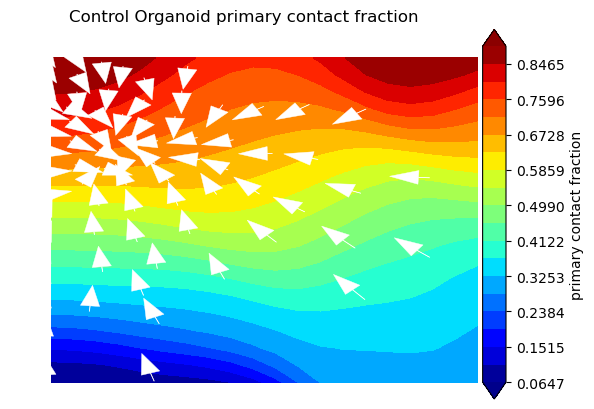

...

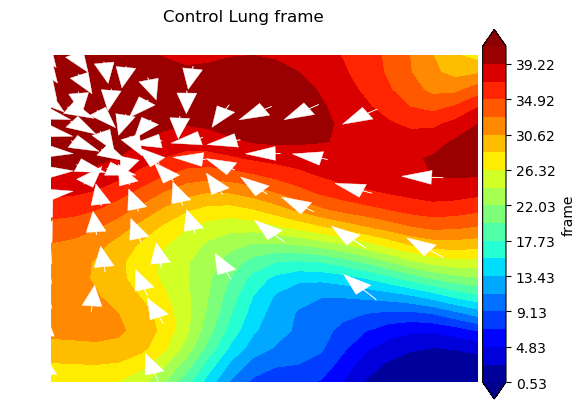

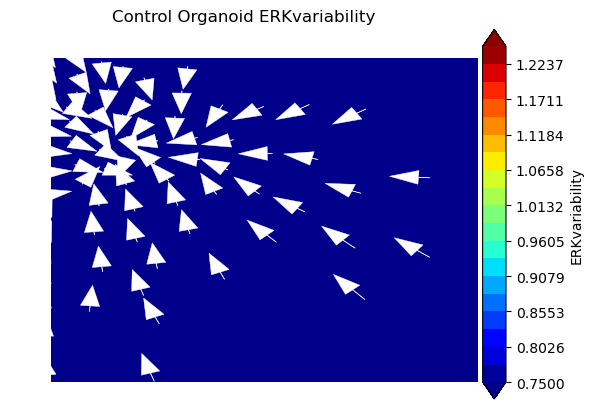

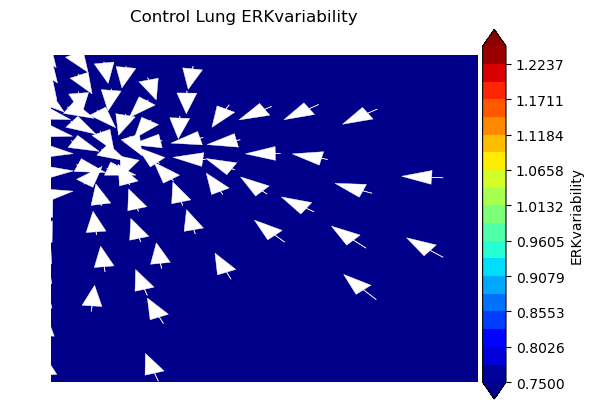

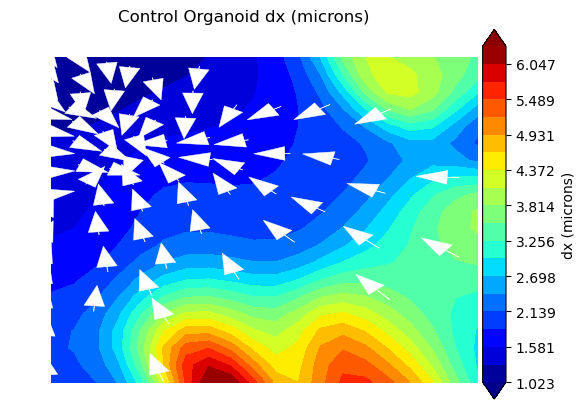

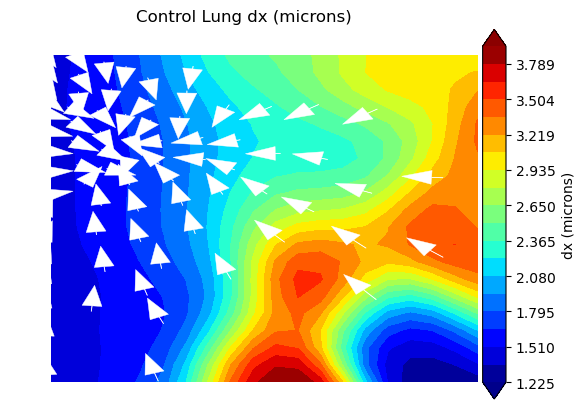

In [140]:
sml=2.
head_width=.04
cratio_erk_var_traj=np.std(cratio_erk_full_traj,axis=1)
vsetList=[cratio_erk_traj,cancer_cf_traj,primary_cf_traj,matrix_cf_traj,indframes_traj,cratio_erk_var_traj,dx_traj]#,dx_traj,beta_traj,alpha_traj,erk_akt_crosscorr]
captionset=['ERKactivity','cancer contact fraction','primary contact fraction','matrix contact fraction','frame','ERKvariability','dx (microns)'] #,'motility alignment (beta)','contact avoidance (alpha)','ERK-AKT timec ross-corr']
nf=len(tmSet)
nbins=20
for iv in range(len(vsetList)):
    try:
        for i_tm in range(nf):
            vset=vsetList[iv]
            indg=np.where(np.logical_and(np.logical_not(np.isnan(vset)),np.logical_not(np.isinf(vset))))[0]
            indtm=np.where(inds_tmSet_models[indmodel_traj]==i_tm)[0]
            indg=np.intersect1d(indtm,indg)
            plt.figure()
            vdist1,xedges1,yedges1=np.histogram2d(x_clusters_all[indg,0],x_clusters_all[indg,1],bins=nbins,weights=vset[indg])
            vdist1=scipy.ndimage.gaussian_filter(vdist1,sigma=sml)
            norm1,xedges1,yedges1=np.histogram2d(x_clusters_all[indg,0],x_clusters_all[indg,1],bins=[xedges1,yedges1])
            norm1=scipy.ndimage.gaussian_filter(norm1,sigma=sml)
            vdist1=np.divide(vdist1,norm1)
            indnan=np.where(np.isnan(vdist1))
            indgood=np.where(np.logical_and(np.logical_not(np.isnan(vdist1)),np.logical_not(np.isinf(vdist1))))
            xedges1c=.5*(xedges1[1:]+xedges1[0:-1])
            yedges1c=.5*(yedges1[1:]+yedges1[0:-1])
            xx,yy=np.meshgrid(xedges1c,yedges1c)
            levels=np.linspace(np.min(vdist1[indgood]),np.max(vdist1[indgood]),20)
            if captionset[iv][0:3]=='ERK':
                levels=np.linspace(.75,1.25,20)
            cs=plt.contourf(xx,yy,vdist1.T,cmap=plt.cm.jet,levels=levels,extend='both')
            for ic in range(n_clusters):
                ax=plt.gca()
                ax.arrow(x_clusters[ic,0],x_clusters[ic,1],ascale*dxsav[ic,0],ascale*dxsav[ic,1],head_width=head_width,linewidth=.3,color='white',alpha=1.0)
            cs.cmap.set_over('darkred')
            cs.cmap.set_under('darkblue')
            cbar=utilities.colorbar(cs)
            cbar.set_label(captionset[iv])
            #cbar.set_label('cell-cell boundary fraction')
            #cbar.set_label('speed')
            #cbar.set_label('beta')
            plt.title(f'{tmSet[i_tm]} {captionset[iv]}')
            plt.axis('off')
            plt.savefig(os.path.join(date, f'{captionset[iv]}_wflows_comb_{figid}_{tmSet[i_tm]}.png'))
            plt.savefig(os.path.join(date, f'{captionset[iv]}_wflows_comb_{figid}_{tmSet[i_tm]}.svg'))
            plt.pause(.4)
    except Exception as e:
        print(e)

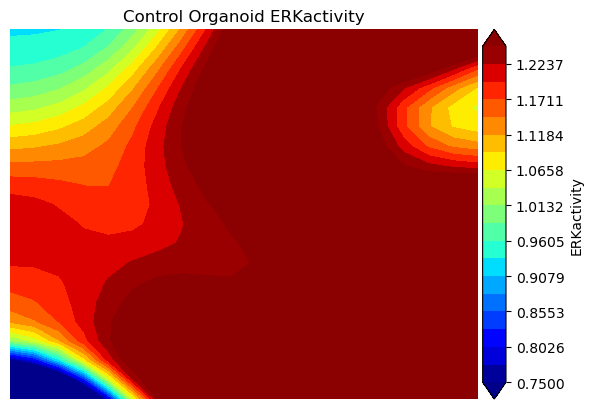

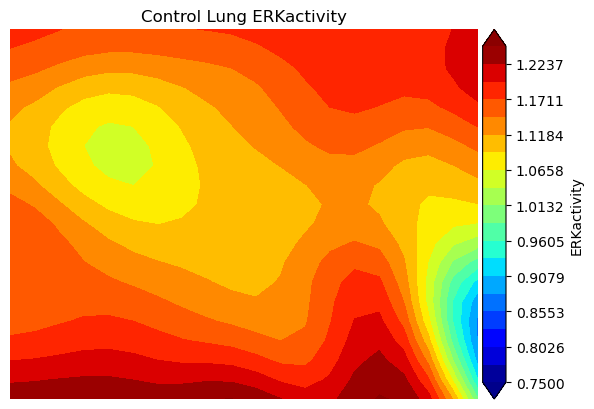

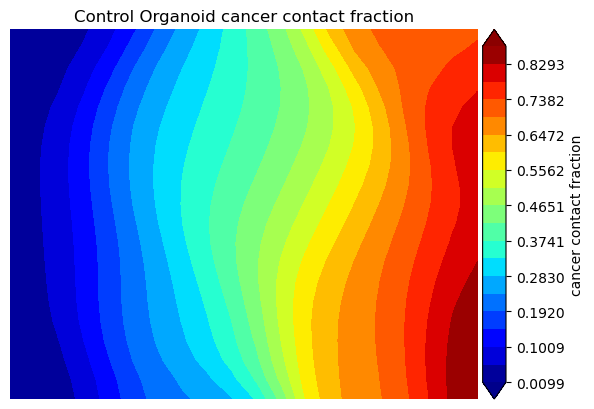

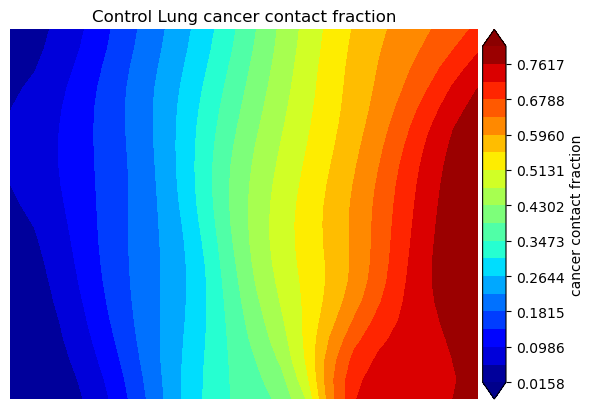

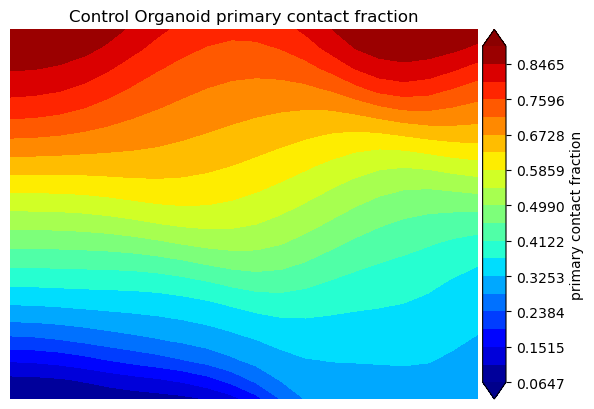

...

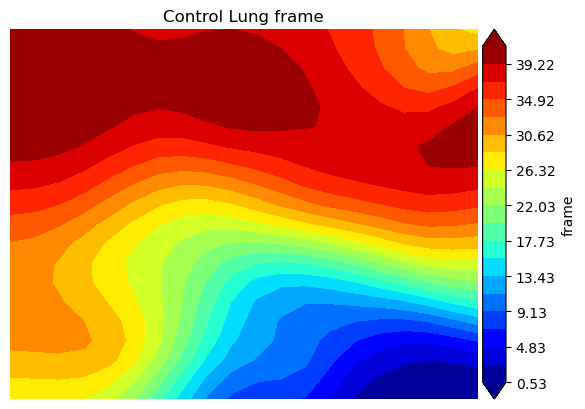

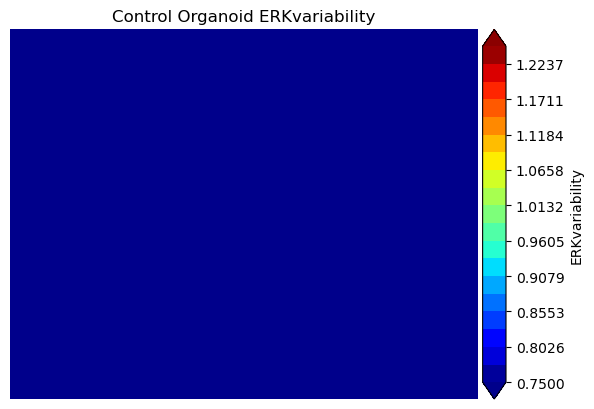

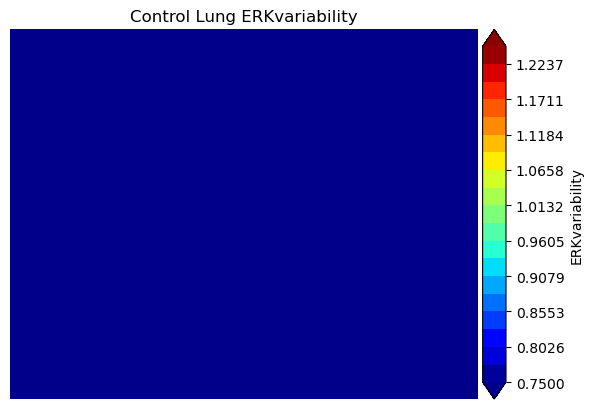

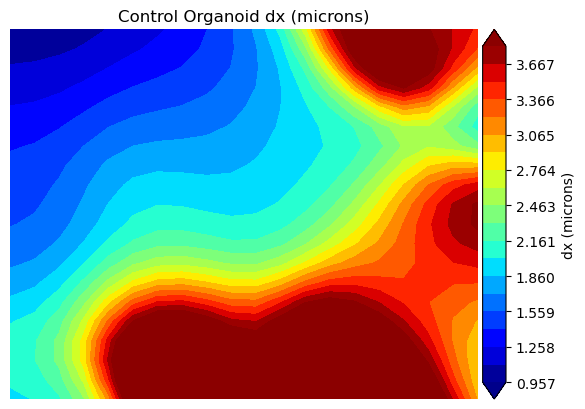

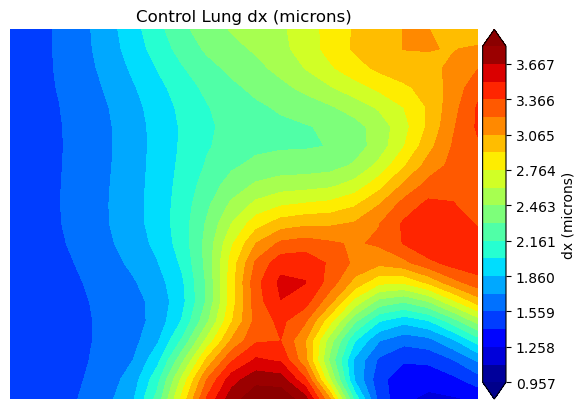

In [141]:
sml=2.
cratio_erk_var_traj=np.std(cratio_erk_full_traj,axis=1)
vsetList=[cratio_erk_traj,cancer_cf_traj,primary_cf_traj,matrix_cf_traj,indframes_traj,cratio_erk_var_traj,dx_traj]#,dx_traj,beta_traj,alpha_traj,erk_akt_crosscorr]
captionset=['ERKactivity','cancer contact fraction','primary contact fraction','matrix contact fraction','frame','ERKvariability','dx (microns)'] #,'motility alignment (beta)','contact avoidance (alpha)','ERK-AKT timec ross-corr']
nf=len(tmSet)
nbins=20
for iv in range(len(vsetList)):
    try:
        for i_tm in range(nf):
            vset=vsetList[iv]
            indg=np.where(np.logical_and(np.logical_not(np.isnan(vset)),np.logical_not(np.isinf(vset))))[0]
            indtm=np.where(inds_tmSet_models[indmodel_traj]==i_tm)[0]
            indg=np.intersect1d(indtm,indg)
            plt.figure()
            vdist1,xedges1,yedges1=np.histogram2d(x_clusters_all[indg,0],x_clusters_all[indg,1],bins=nbins,weights=vset[indg])
            vdist1=scipy.ndimage.gaussian_filter(vdist1,sigma=sml)
            norm1,xedges1,yedges1=np.histogram2d(x_clusters_all[indg,0],x_clusters_all[indg,1],bins=[xedges1,yedges1])
            norm1=scipy.ndimage.gaussian_filter(norm1,sigma=sml)
            vdist1=np.divide(vdist1,norm1)
            indnan=np.where(np.isnan(vdist1))
            indgood=np.where(np.logical_and(np.logical_not(np.isnan(vdist1)),np.logical_not(np.isinf(vdist1))))
            xedges1c=.5*(xedges1[1:]+xedges1[0:-1])
            yedges1c=.5*(yedges1[1:]+yedges1[0:-1])
            xx,yy=np.meshgrid(xedges1c,yedges1c)
            levels=np.linspace(np.min(vdist1[indgood]),np.max(vdist1[indgood]),20)
            if captionset[iv][0:3]=='ERK':
                levels=np.linspace(.75,1.25,20)
            if captionset[iv][0:3]=='dx ':
                levels=np.linspace(.957,3.8175,20)
            cs=plt.contourf(xx,yy,vdist1.T,cmap=plt.cm.jet,levels=levels,extend='both')
            #for ic in range(n_clusters):
            cs.cmap.set_over('darkred')
            cs.cmap.set_under('darkblue')
            cbar=utilities.colorbar(cs)
            cbar.set_label(captionset[iv])
            #cbar.set_label('cell-cell boundary fraction')
            #cbar.set_label('speed')
            #cbar.set_label('beta')
            plt.title(f'{tmSet[i_tm]} {captionset[iv]}')
            plt.axis('off')
            plt.savefig(os.path.join(date, f'{captionset[iv]}_noflows_comb_{figid}_{tmSet[i_tm]}.png'))
            plt.savefig(os.path.join(date, f'{captionset[iv]}_noflows_comb_{figid}_{tmSet[i_tm]}.svg'))
            plt.pause(.4)
    except Exception as e:
        print(e)

[0.30263158 0.69736842]
2 states initial, 2 states final
building likelihood model for Control Organoid
building likelihood model for Control Lung
2 states
[4.39872855 3.78755571]


/tmp/ipykernel_7906/458976503.py:30: RuntimeWarning: divide by zero encountered in log
  plt.contourf(xx,yy,-np.log(prob1.T),cmap=plt.cm.gray,alpha=0.8)


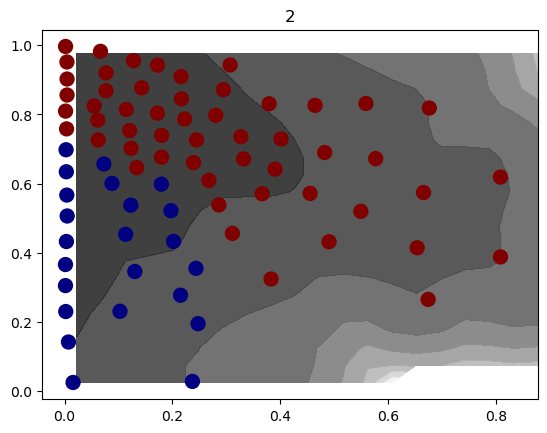

[0.11842105 0.27631579 0.60526316]
3 states initial, 3 states final
building likelihood model for Control Organoid
building likelihood model for Control Lung
3 states
[7.33212735 5.65221517]


/tmp/ipykernel_7906/458976503.py:30: RuntimeWarning: divide by zero encountered in log
  plt.contourf(xx,yy,-np.log(prob1.T),cmap=plt.cm.gray,alpha=0.8)


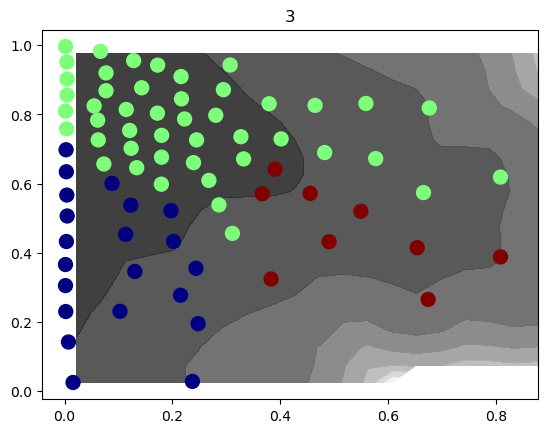

[0.01315789 0.27631579 0.30263158 0.40789474]
4 states initial, 3 states final
[0.01315789 0.10526316 0.18421053 0.21052632 0.48684211]
5 states initial, 4 states final
building likelihood model for Control Organoid
building likelihood model for Control Lung
4 states
[10.34666298  9.932063  ]


/tmp/ipykernel_7906/458976503.py:30: RuntimeWarning: divide by zero encountered in log
  plt.contourf(xx,yy,-np.log(prob1.T),cmap=plt.cm.gray,alpha=0.8)


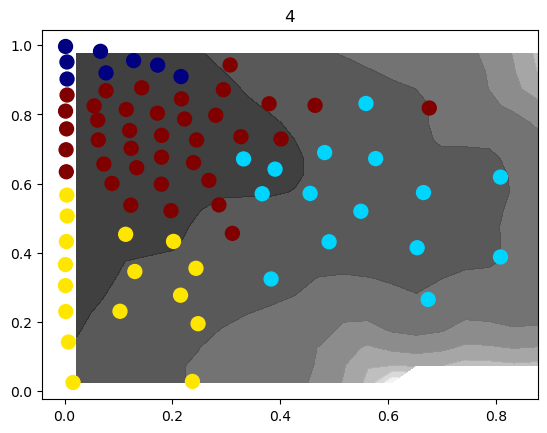

[0.01315789 0.10526316 0.10526316 0.21052632 0.22368421 0.34210526]
6 states initial, 5 states final
building likelihood model for Control Organoid
building likelihood model for Control Lung
5 states
[15.31289874 12.25903952]


/tmp/ipykernel_7906/458976503.py:30: RuntimeWarning: divide by zero encountered in log
  plt.contourf(xx,yy,-np.log(prob1.T),cmap=plt.cm.gray,alpha=0.8)


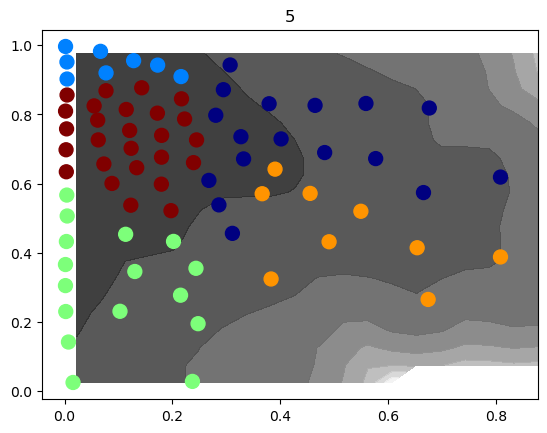

[0.01315789 0.01315789 0.10526316 0.18421053 0.19736842 0.21052632
 0.27631579]
7 states initial, 5 states final
[0.01315789 0.01315789 0.03947368 0.06578947 0.15789474 0.21052632
 0.23684211 0.26315789]
8 states initial, 5 states final
[0.01315789 0.01315789 0.01315789 0.02631579 0.09210526 0.15789474
 0.19736842 0.22368421 0.26315789]
9 states initial, 5 states final
[0.01315789 0.01315789 0.01315789 0.03947368 0.07894737 0.09210526
 0.14473684 0.19736842 0.19736842 0.21052632]
10 states initial, 6 states final
building likelihood model for Control Organoid
building likelihood model for Control Lung
6 states
[18.53225033 14.72094366]


/tmp/ipykernel_7906/458976503.py:30: RuntimeWarning: divide by zero encountered in log
  plt.contourf(xx,yy,-np.log(prob1.T),cmap=plt.cm.gray,alpha=0.8)


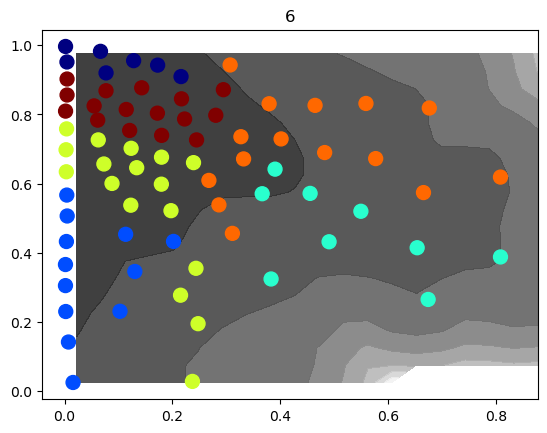

[0.01315789 0.01315789 0.01315789 0.01315789 0.02631579 0.09210526
 0.09210526 0.14473684 0.17105263 0.19736842 0.22368421]
11 states initial, 6 states final
[0.01315789 0.01315789 0.01315789 0.01315789 0.02631579 0.03947368
 0.06578947 0.09210526 0.14473684 0.15789474 0.19736842 0.22368421]
12 states initial, 6 states final
[0.01315789 0.01315789 0.01315789 0.01315789 0.02631579 0.03947368
 0.06578947 0.09210526 0.10526316 0.14473684 0.14473684 0.14473684
 0.18421053]
13 states initial, 7 states final
building likelihood model for Control Organoid
building likelihood model for Control Lung
7 states
[22.52237531 15.67896291]


/tmp/ipykernel_7906/458976503.py:30: RuntimeWarning: divide by zero encountered in log
  plt.contourf(xx,yy,-np.log(prob1.T),cmap=plt.cm.gray,alpha=0.8)


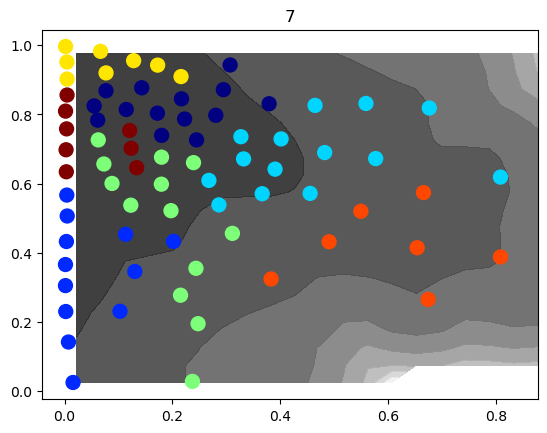

[0.01315789 0.01315789 0.01315789 0.01315789 0.01315789 0.03947368
 0.03947368 0.05263158 0.07894737 0.09210526 0.13157895 0.14473684
 0.15789474 0.19736842]
14 states initial, 7 states final
[0.01315789 0.01315789 0.01315789 0.01315789 0.01315789 0.02631579
 0.05263158 0.05263158 0.06578947 0.06578947 0.09210526 0.10526316
 0.13157895 0.15789474 0.18421053]
15 states initial, 9 states final
building likelihood model for Control Organoid
building likelihood model for Control Lung
8 states
[23.48728819 20.36615238]


/tmp/ipykernel_7906/458976503.py:30: RuntimeWarning: divide by zero encountered in log
  plt.contourf(xx,yy,-np.log(prob1.T),cmap=plt.cm.gray,alpha=0.8)


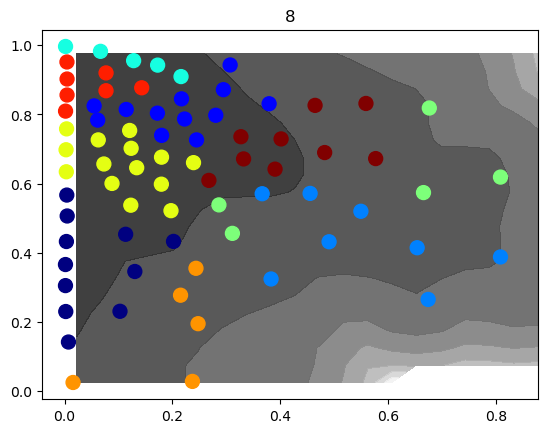

[0.01315789 0.01315789 0.01315789 0.01315789 0.01315789 0.02631579
 0.03947368 0.05263158 0.05263158 0.05263158 0.06578947 0.09210526
 0.10526316 0.13157895 0.14473684 0.17105263]
16 states initial, 9 states final
building likelihood model for Control Organoid
building likelihood model for Control Lung
9 states
[24.63642364 20.46202813]


/tmp/ipykernel_7906/458976503.py:30: RuntimeWarning: divide by zero encountered in log
  plt.contourf(xx,yy,-np.log(prob1.T),cmap=plt.cm.gray,alpha=0.8)


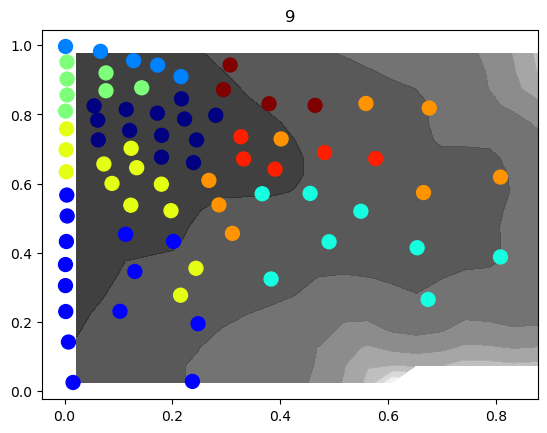

[0.01315789 0.01315789 0.01315789 0.01315789 0.01315789 0.03947368
 0.03947368 0.05263158 0.05263158 0.05263158 0.05263158 0.06578947
 0.07894737 0.07894737 0.09210526 0.15789474 0.17105263]
17 states initial, 10 states final
building likelihood model for Control Organoid
building likelihood model for Control Lung
10 states
[27.71941932 22.68854896]


/tmp/ipykernel_7906/458976503.py:30: RuntimeWarning: divide by zero encountered in log
  plt.contourf(xx,yy,-np.log(prob1.T),cmap=plt.cm.gray,alpha=0.8)


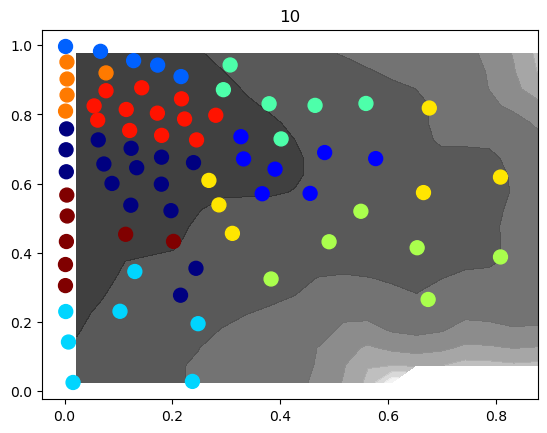

[0.01315789 0.01315789 0.01315789 0.01315789 0.01315789 0.02631579
 0.03947368 0.05263158 0.05263158 0.06578947 0.06578947 0.06578947
 0.06578947 0.06578947 0.07894737 0.07894737 0.11842105 0.15789474]
18 states initial, 11 states final
building likelihood model for Control Organoid
building likelihood model for Control Lung
11 states
[30.2138739  24.46510444]


/tmp/ipykernel_7906/458976503.py:30: RuntimeWarning: divide by zero encountered in log
  plt.contourf(xx,yy,-np.log(prob1.T),cmap=plt.cm.gray,alpha=0.8)


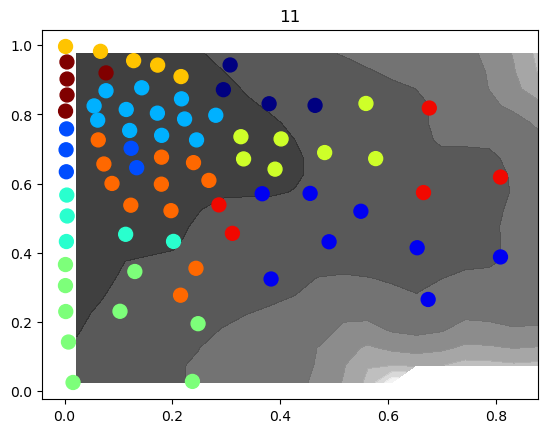

[0.01315789 0.01315789 0.01315789 0.01315789 0.01315789 0.03947368
 0.03947368 0.03947368 0.03947368 0.05263158 0.05263158 0.05263158
 0.05263158 0.05263158 0.07894737 0.07894737 0.09210526 0.10526316
 0.15789474]
19 states initial, 10 states final
[0.01315789 0.01315789 0.01315789 0.01315789 0.01315789 0.03947368
 0.03947368 0.03947368 0.05263158 0.05263158 0.05263158 0.05263158
 0.05263158 0.05263158 0.06578947 0.06578947 0.07894737 0.09210526
 0.09210526 0.10526316]
20 states initial, 12 states final
building likelihood model for Control Organoid
building likelihood model for Control Lung
12 states
[31.32973879 26.1358426 ]


/tmp/ipykernel_7906/458976503.py:30: RuntimeWarning: divide by zero encountered in log
  plt.contourf(xx,yy,-np.log(prob1.T),cmap=plt.cm.gray,alpha=0.8)


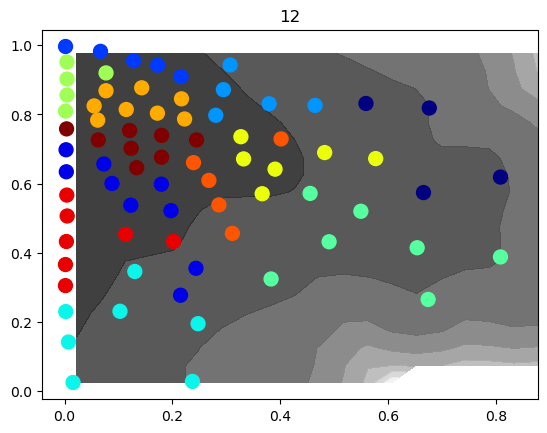

In [143]:
plt.close('all')
plt.clf()
nstateSet=[2,3,4,5,6,7,8,9,10,11,12] 
nS=len(nstateSet)
scoreSet_states=[None]*nS
nstates_initial=nstateSet[0]
pcut_final=.05
indc_x0set=clusters_minima.assign(x0set);indc_x1set=clusters_minima.assign(x1set)
for istate in range(len(nstateSet)):
    MtSet_test=[None]*nf
    nstates=nstateSet[istate]
    scoreSet=np.zeros(nf)
    #clusters_v.fit(vkin)
    states,nstates_initial=model.get_kineticstates(vkin,nstates,nstates_initial=nstates_initial,pcut_final=pcut_final,seed=0,return_nstates_initial=True,cluster_ninit=100)
    for imf in range(nf):
        print('building likelihood model for '+tmSet[imf])
        indmodels=np.where(inds_tmSet_models==imf)[0]
        indmodels=np.intersect1d(indmodels,indgood_models)
        indstm=np.array([]).astype(int)
        for i in indmodels: #[:-1]:
            indstm=np.append(indstm,np.where(inds_trajsteps_models==i)[0])
        MtSet_test[imf]=model.get_transition_matrix_CG(x0set[indstm,:],x1set[indstm,:],clusters=clusters_minima,states=states)
        scoreSet[imf]=model.get_kscore(MtSet_test[imf])
    print(str(nstates)+' states')
    print(scoreSet)
    nstates_initial=nstates_initial+1
    #np.savetxt(f'{date}_scoreSet_{figid}_nS{nstates}.dat',scoreSet)
    scoreSet_states[istate]=scoreSet
    plt.clf()
    plt.contourf(xx,yy,-np.log(prob1.T),cmap=plt.cm.gray,alpha=0.8)
    plt.scatter(x_clusters[:,0],x_clusters[:,1],s=100,c=states,cmap=plt.cm.jet)
    plt.title(str(nstates))
    plt.pause(2)


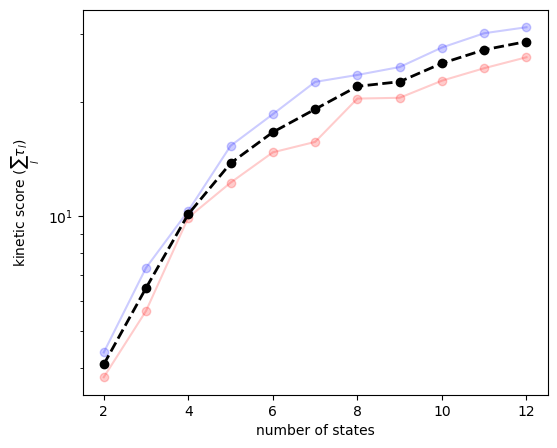

<Figure size 640x480 with 0 Axes>

In [145]:
scoreSet_statearray = np.zeros((nS, nf))

for istate in range(len(nstateSet)):
    try:
        scoreSet_statearray[istate, :] = scoreSet_states[istate]
    except:
        pass  # Skip if there is an issue

# Close any existing plots and create a new figure
plt.close('all')
plt.figure(figsize=(6, 5))
plt.clf()

for imf in [0,1]: #range(nf):
    color = colorSet[imf]  # Use color mapping or default to 'grey'
    plt.plot(nstateSet, scoreSet_statearray[:, imf], 'o-', color=color, label=tmSet[imf], alpha=0.2)

# Plot the mean score across all treatments
plt.plot(nstateSet, np.nanmean(scoreSet_statearray, axis=1), 'o--', color='black', linewidth=2)

# Set y-axis to a logarithmic scale and add labels
plt.yscale('log')
plt.ylabel(r'kinetic score ($\sum_l \tau_l$)')
plt.xlabel('number of states')
plt.pause(0.1)

# Save the figure
plt.savefig(os.path.join(date, f'scoreset_{figid}.png'))
plt.savefig(os.path.join(date, f'scoreset_{figid}.svg'), format='svg')

# Display the plot
plt.show()


In [147]:
get_kstates=True
nstates_final=5 #for production
pcut_final=.05 #for prediction
nstates_initial=nstates_final
stateCenters=x_clusters
if get_kstates:
    stateSet=model.get_kineticstates(vkin,nstates_final,nstates_initial=nstates_initial,pcut_final=pcut_final,seed=0,return_nstates_initial=False,cluster_ninit=100)
    objFile='stateSet_'+figid+'_nS'+str(nstates)+'.obj'
    objFileHandler=open(objFile,'wb')
    states_object=[clusters_minima,stateSet]
    pickle.dump(states_object,objFileHandler,protocol=4)
    objFileHandler.close()
else:
    objFile='stateSet_'+figid+'_nS'+str(nstates_final)+'.obj'
    objFileHandler=open(objFile,'rb')
    states_object=pickle.load(objFileHandler)
    clusters_minima=states_object[0]
    stateSet=states_object[1]
    objFileHandler.close()

nstates=np.unique(stateSet).size; n_states=nstates
state_centers_minima=np.zeros((n_states,x_clusters.shape[1]))
for i in range(n_states):
    indstate=np.where(stateSet==i)[0]
    state_centers_minima[i,:]=np.median(stateCenters[indstate,:],axis=0)



[0.01315789 0.10526316 0.18421053 0.21052632 0.48684211]
5 states initial, 4 states final
[0.01315789 0.10526316 0.10526316 0.21052632 0.22368421 0.34210526]
6 states initial, 5 states final


In [148]:
inds_states=[None]*n_states
for i in range(n_states):
    indstate=np.where(stateSet[ind_clusters]==i)[0]
    inds_states[i]=indstate
    
# Step 1: Calculate mean ERK activity and determine sorted order
activity = np.nanmean(cancer_cf_full_traj,axis=1)
mean_activity = []
for i in range(n_states):
    setv = activity[inds_states[i]]
    indgood=np.where(np.isfinite(setv))[0]
    setv = setv[indgood]
    mean_activity.append(np.mean(setv))

# Get sorted indices based on mean ERK activity
state_order = np.argsort(mean_activity)
stateSet_ordered=np.ones_like(stateSet)*-1
for istate in range(nstates):
    stateSet_ordered[stateSet==state_order[istate]]=istate

stateSet=stateSet_ordered

nstates=np.unique(stateSet).size; n_states=nstates
state_centers_minima=np.zeros((n_states,x_clusters.shape[1]))
for i in range(n_states):
    indstate=np.where(stateSet==i)[0]
    state_centers_minima[i,:]=np.median(stateCenters[indstate,:],axis=0)

inds_states=[None]*n_states
for i in range(n_states):
    indstate=np.where(stateSet[ind_clusters]==i)[0]
    inds_states[i]=indstate

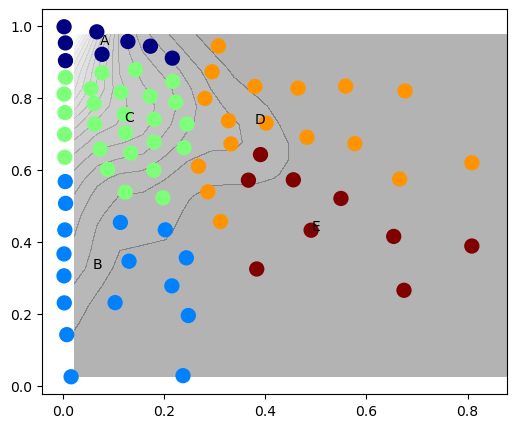

In [149]:
import string
nbins=prob1.shape[0]
state_labels=np.array(list(string.ascii_uppercase))[0:nstates]
plt.close('all');plt.figure(figsize=(6,5))
plt.clf()
pts=np.array([xx.flatten(),yy.flatten()]).T
plt.contourf(xx,yy,prob1.T,cmap=plt.cm.gray,levels=20,alpha=.3)
plt.scatter(x_clusters[:,0],x_clusters[:,1],s=100,c=stateSet,cmap=plt.cm.jet)
#for ic in range(n_clusters):

for istate in range(nstates):
    plt.text(state_centers_minima[istate,0],state_centers_minima[istate,1],str(state_labels[istate]))


plt.savefig(os.path.join(date, f'nstates_{figid}.png'))
plt.savefig(os.path.join(date, f'nstates_{figid}.svg'), format='svg')   
plt.pause(.1)

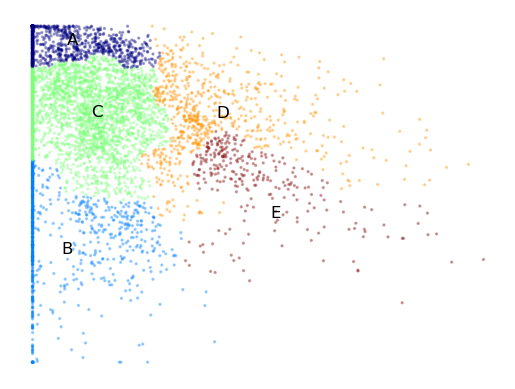

In [150]:
plt.scatter(x_clusters_all[:,0],x_clusters_all[:,1],s=2,c=stateSet[ind_clusters],cmap=plt.cm.jet,alpha=.3)
for istate in range(nstates):
    plt.text(state_centers_minima[istate,0],state_centers_minima[istate,1],str(state_labels[istate]),size='large')

plt.axis('off')
plt.savefig(os.path.join(date, f'states_all_{figid}.png'))
plt.savefig(os.path.join(date, f'states_all_{figid}.svg'), format='svg')   
plt.pause(.1)

In [151]:
def show_cell_activation(self,icell,cyto_msk_channel=None,rep_img_channel=None,nuc_img_channel=None,bf_img_channel=None,viewsize=50,npix=100,sigma=3.,zoom=2,nuchigh=None,nuclow=None,rephigh=None,replow=None,bflow=None,bfhigh=None,projection=True,show_neighbor_signals=False):
    if cyto_msk_channel is None:
        cyto_msk_channel=self.mskchannel
        if rep_img_channel is None:
            rep_img_channel=self.rep_channel
        if nuc_img_channel is None:
            nuc_img_channel=self.nuc_channel
        if bf_img_channel is None:
            bf_img_channel=self.bf_channel
    if True: #try:
        imgc,mskc=self.get_cell_data(icell,relabel_mskchannels=[0],boundary_expansion=[1,viewsize,viewsize])
        imgc2,mskc2=self.get_cell_data(icell,relabel_mskchannels=[],boundary_expansion=[1,viewsize,viewsize])
        if not projection:
            mslices=np.where(np.sum(mskc[...,cyto_msk_channel],axis=(1,2))>0)[0]
            hslice=np.argmax(np.sum(imgc[mslices,:,:,nuc_img_channel],axis=(1,2)))
            islice=mslices[hslice]
            img_rep=imprep.znorm(imgc[islice,:,:,rep_img_channel]).astype(float)
            img_nuc=imprep.znorm(imgc[islice,:,:,nuc_img_channel]).astype(float)
            img_bf=skimage.filters.difference_of_gaussians(imgc[...,bf_img_channel],.5,1.5)
            img_bf=imprep.znorm(img_bf[islice,:,:]).astype(float)
            msk_cyto=mskc[islice,:,:,cyto_msk_channel]
            msk2_cyto=mskc2[islice,:,:,cyto_msk_channel]
        else:
            img_rep=np.max(imprep.znorm(imgc[:,:,:,rep_img_channel]).astype(float),axis=0)
            img_nuc=np.max(imprep.znorm(imgc[:,:,:,nuc_img_channel]).astype(float),axis=0)
            img_bf=skimage.filters.difference_of_gaussians(imgc[...,bf_img_channel],.5,1.5)
            img_bf=np.max(imprep.znorm(img_bf[:,:,:]).astype(float),axis=0)
            msk_cyto=np.max(mskc[:,:,:,cyto_msk_channel],axis=0)
            msk2_cyto=np.max(mskc2[:,:,:,cyto_msk_channel],axis=0)
        if nuchigh is None:
            nuclow=np.percentile(img_nuc,5);nuchigh=np.percentile(img_nuc,95)
        img_bf=np.abs(img_bf)
        img_rep=scipy.ndimage.zoom(img_rep,zoom,order=1)
        img_rep=scipy.ndimage.gaussian_filter(img_rep,sigma)
        img_nuc=scipy.ndimage.zoom(img_nuc,zoom,order=1)
        img_nuc=scipy.ndimage.gaussian_filter(img_nuc,sigma)
        img_bf=scipy.ndimage.zoom(img_bf,zoom,order=1)
        if rephigh is None:
            replow=np.percentile(img_rep,5);rephigh=np.percentile(img_rep,95)
        if bfhigh is None:
            bflow=np.percentile(img_bf,5);bfhigh=np.percentile(img_bf,95)
        msk_cyto=scipy.ndimage.zoom(msk_cyto,zoom,order=1)
        msk2_cyto=scipy.ndimage.zoom(msk2_cyto,zoom,order=1)
        plt.imshow(img_bf,cmap=plt.cm.binary,clim=(bflow,bfhigh),alpha=1.)
        #csr.cmap.set_over('black')
        #csr.cmap.set_under('white')
        if show_neighbor_signals:
            plt.imshow(np.ma.masked_where(msk2_cyto==0,img_rep),cmap=plt.cm.inferno,alpha=.3)
        #else:
        plt.imshow(np.ma.masked_where(msk_cyto==0,img_rep),cmap=plt.cm.inferno,alpha=.7)
        csn=plt.contour(msk_cyto>0,levels=np.unique(msk_cyto>0),colors='darkorange',linewidths=2)
        csn.cmap.set_over('darkred')
        csn.cmap.set_under('white')
        #cs.cmap.set_under('white')
        plt.axis('off')
        return 0
    else: #except Exception as e:
        print(e)
    return 1

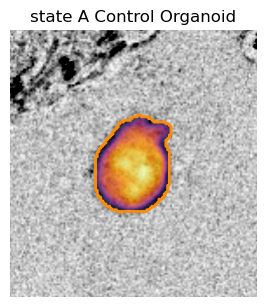

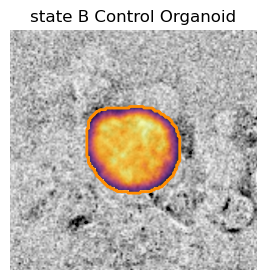

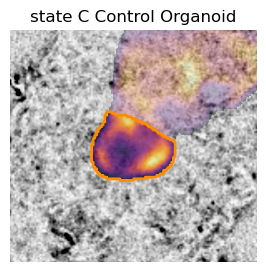

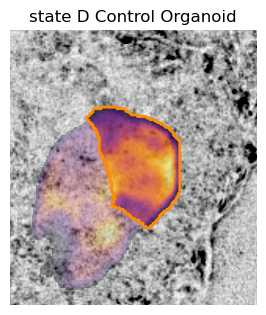

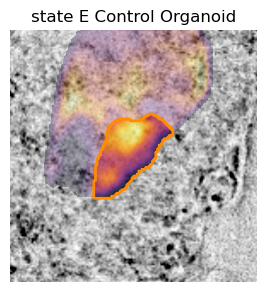

...

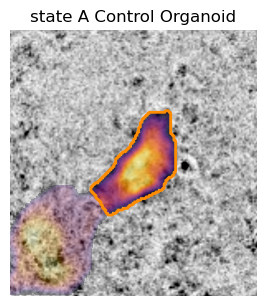

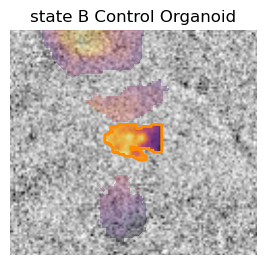

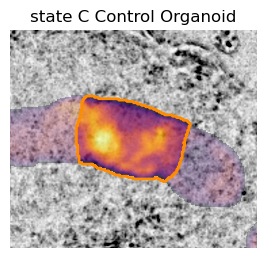

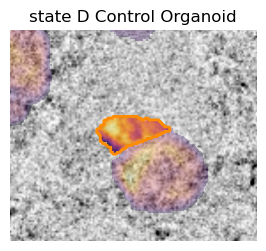

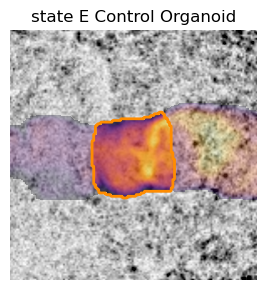

ValueError: a must be greater than 0 unless no samples are taken

In [152]:
nrounds=5
nr=1
maxl=trajl
stordir='cellstatepics'
os.system(f'mkdir -p {date}/{stordir}')
nuclow=-1.;nuchigh=9.;replow=0.;rephigh=5.;bflow=0.;bfhigh=5.
npics=1
for i_tm in [0,3]:
    indmodels_tm=np.where(inds_tmSet_models==i_tm)[0]
    for iround in range(nrounds):
        plt.close('all')
        for istate in range(nstates):
            indcells_traj=inds_states[istate]
            indmodels=indmodel_traj[indcells_traj]
            indtm=np.where(np.isin(indmodels,indmodels_tm))[0]
            indcells_model=cellinds1_traj[indcells_traj[indtm]]
            indmodels=indmodels[indtm]
            indr=np.random.choice(indcells_model.size,nr,replace=False)
            for ic in indr: #range(indcells_traj.size):
                plt.figure(figsize=(7,6))
                model_sctm=modelSet[indmodels[ic]]
                bf_img_channel=np.where(model_sctm.channels==np.array(['BF']).astype('S32'))[0][0]
                erk_img_channel=np.where(model_sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
                celltraj=model_sctm.get_cell_trajectory(indcells_model[ic])
                if celltraj.size>maxl:
                    celltraj=celltraj[-maxl:]
                iplot=0
                for icell in np.linspace(0,celltraj.size-1,npics).astype(int):
                    indcell=celltraj[icell]
                    plt.subplot(1,npics+1,iplot+1)
                    show_cell_activation(model_sctm,indcell,projection=True,bf_img_channel=bf_img_channel,nuc_img_channel=None,rep_img_channel=erk_img_channel,nuclow=nuclow,nuchigh=nuchigh,replow=replow,rephigh=rephigh,bflow=bflow,bfhigh=bfhigh,show_neighbor_signals=True)
                    iplot=iplot+1
                    plt.title(f'state {state_labels[istate]} {tmSet[i_tm]}')
                plt.savefig(f'{date}/{stordir}/state{state_labels[istate]}_cell{ic}_model{indmodels[ic]}_{model_sctm.figid.decode()}_{figid}.png')
                plt.pause(.1)

mkdir: cannot create directory ‘20251022/boundarystate_pics’: File exists


getting foreground mask from /mnt/d/vaibhav/Documentation/20251015_Organoid_Documentation_XY0_roi1.h5 fmask channel 4
getting foreground mask from /mnt/d/vaibhav/Documentation/20251015_Organoid_Documentation_XY0_roi1.h5 fmask channel 5


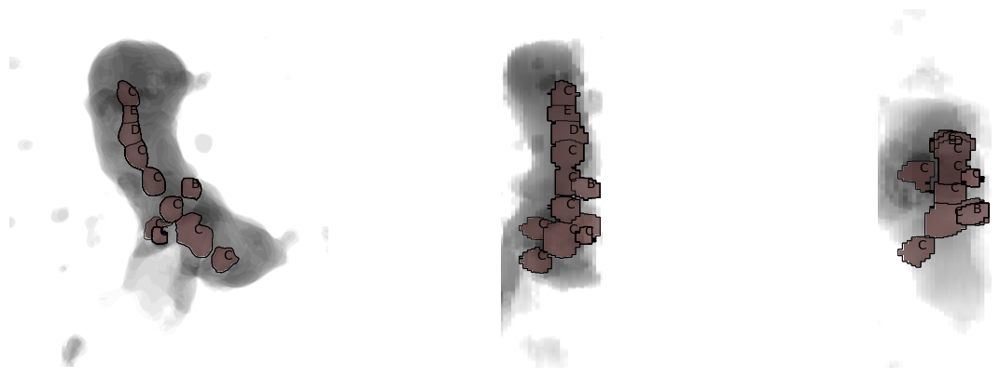

getting foreground mask from /mnt/d/vaibhav/Documentation/20251015_Organoid_Documentation_XY0_roi2.h5 fmask channel 4
getting foreground mask from /mnt/d/vaibhav/Documentation/20251015_Organoid_Documentation_XY0_roi2.h5 fmask channel 5


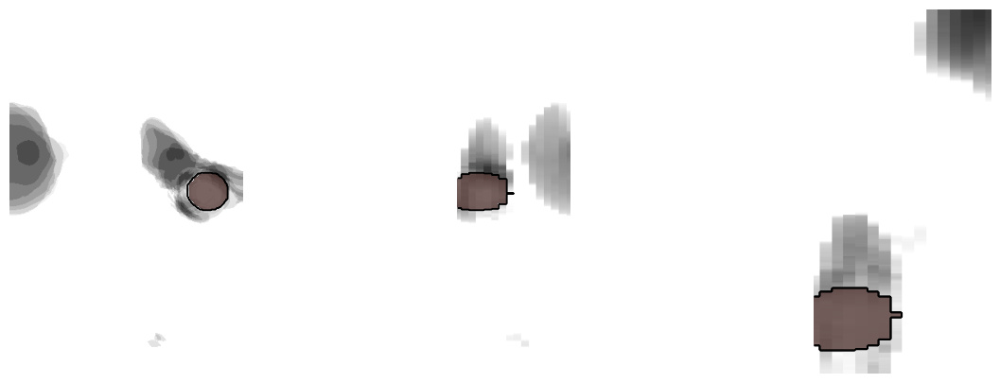

getting foreground mask from /mnt/d/vaibhav/Documentation/20251015_Organoid_Documentation_XY0_roi3.h5 fmask channel 4
getting foreground mask from /mnt/d/vaibhav/Documentation/20251015_Organoid_Documentation_XY0_roi3.h5 fmask channel 5


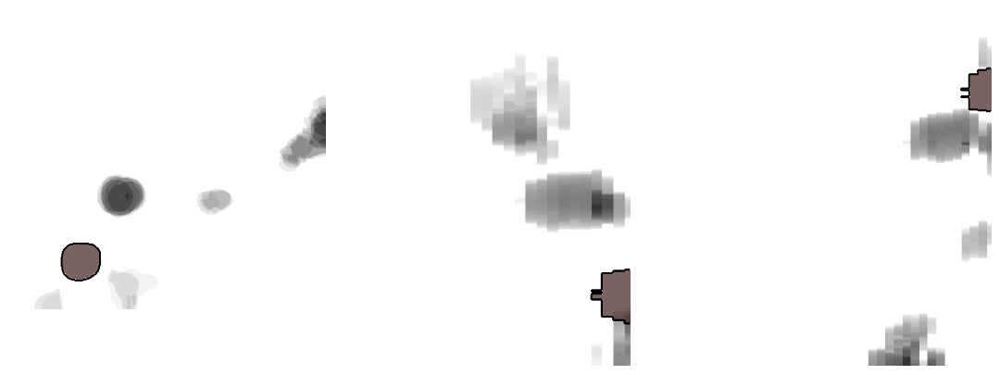

getting foreground mask from /mnt/d/vaibhav/Documentation/20251015_Organoid_Documentation_XY1_roi0.h5 fmask channel 4
getting foreground mask from /mnt/d/vaibhav/Documentation/20251015_Organoid_Documentation_XY1_roi0.h5 fmask channel 5


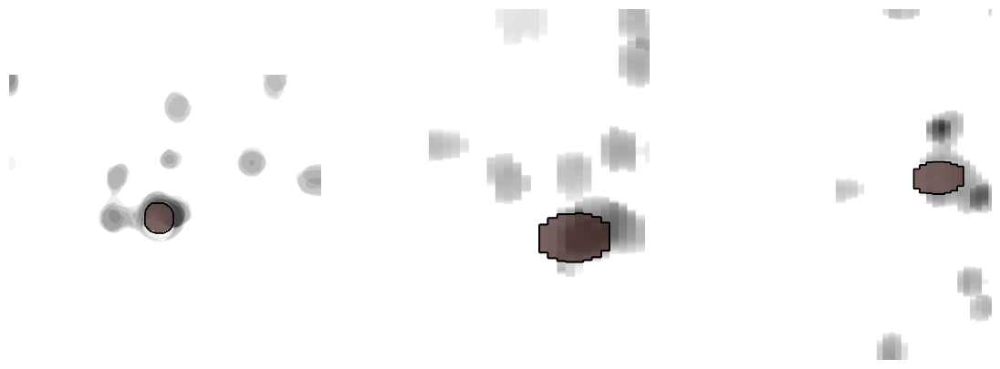

getting foreground mask from /mnt/d/vaibhav/Documentation/20251015_Organoid_Documentation_XY1_roi1.h5 fmask channel 4
getting foreground mask from /mnt/d/vaibhav/Documentation/20251015_Organoid_Documentation_XY1_roi1.h5 fmask channel 5


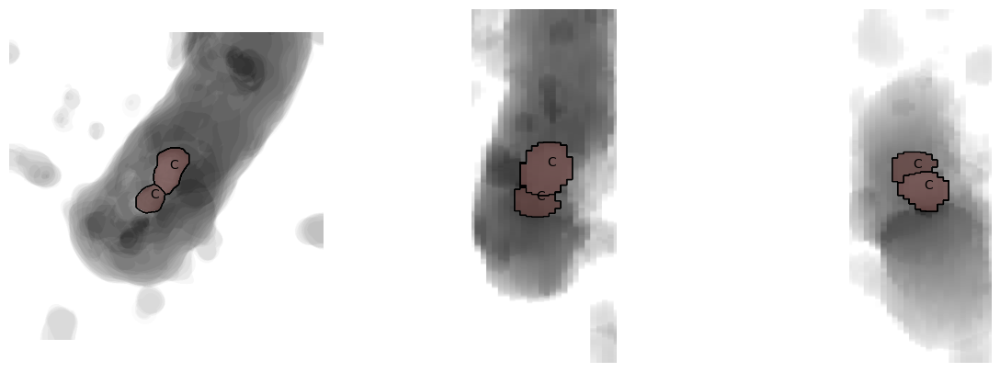

getting foreground mask from /mnt/d/vaibhav/Documentation/20251015_Organoid_Documentation_XY2_roi0.h5 fmask channel 4
getting foreground mask from /mnt/d/vaibhav/Documentation/20251015_Organoid_Documentation_XY2_roi0.h5 fmask channel 5


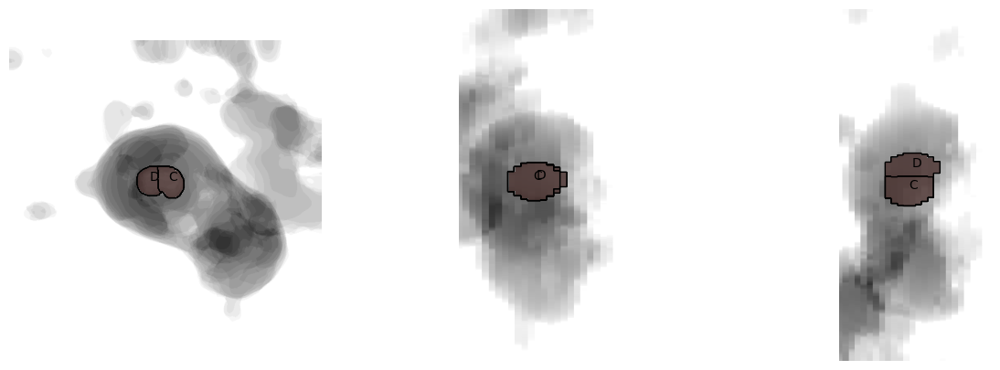

getting foreground mask from /mnt/d/vaibhav/Documentation/20251015_Organoid_Documentation_XY2_roi2.h5 fmask channel 4
getting foreground mask from /mnt/d/vaibhav/Documentation/20251015_Organoid_Documentation_XY2_roi2.h5 fmask channel 5


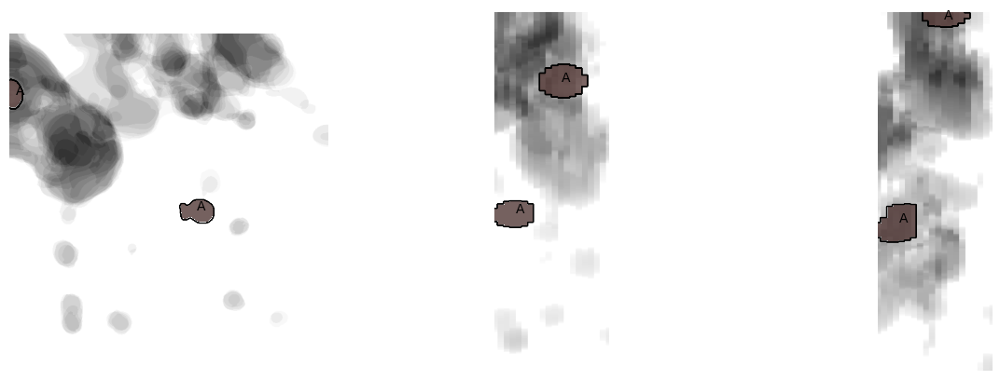

getting foreground mask from /mnt/d/vaibhav/Documentation/20251015_Organoid_Documentation_XY3_roi0.h5 fmask channel 4
getting foreground mask from /mnt/d/vaibhav/Documentation/20251015_Organoid_Documentation_XY3_roi0.h5 fmask channel 5


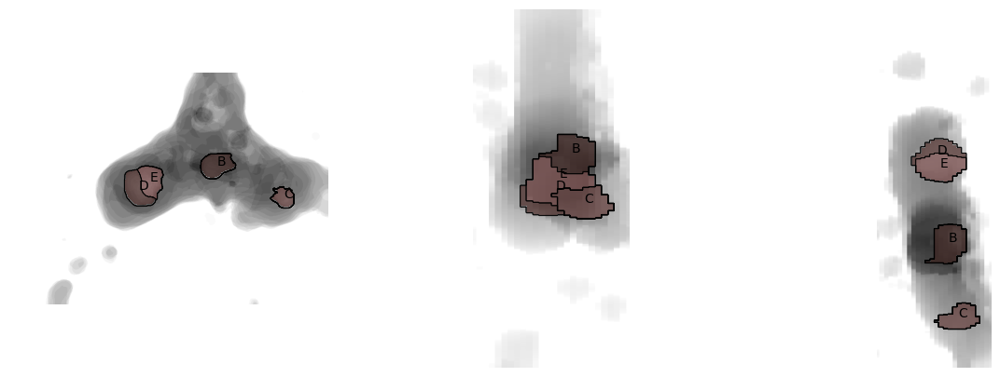

getting foreground mask from /mnt/d/vaibhav/Documentation/20251015_Organoid_Documentation_XY3_roi1.h5 fmask channel 4
getting foreground mask from /mnt/d/vaibhav/Documentation/20251015_Organoid_Documentation_XY3_roi1.h5 fmask channel 5


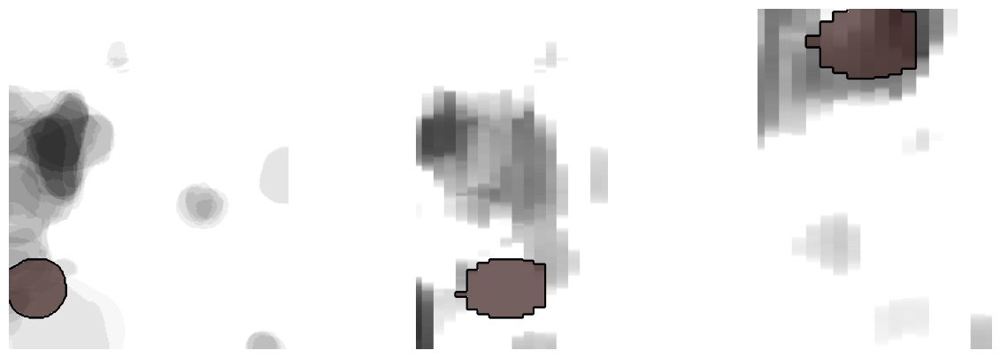

getting foreground mask from /mnt/d/vaibhav/Documentation/20251015_Organoid_Documentation_XY3_roi2.h5 fmask channel 4
getting foreground mask from /mnt/d/vaibhav/Documentation/20251015_Organoid_Documentation_XY3_roi2.h5 fmask channel 5


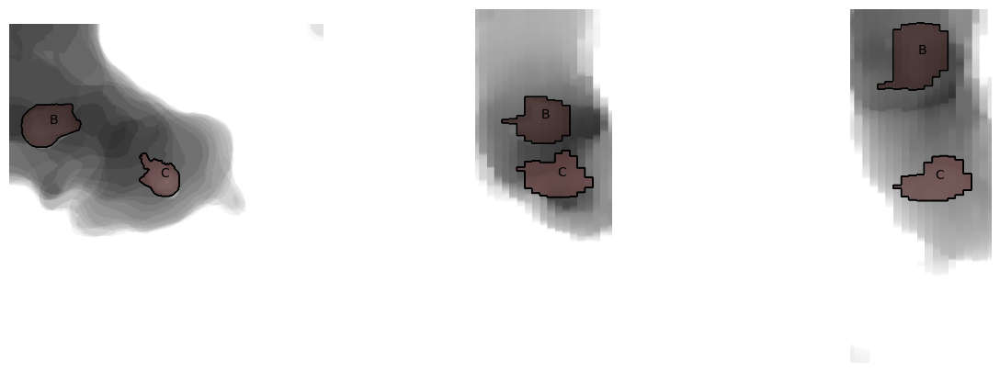

getting foreground mask from /mnt/d/vaibhav/Documentation/20251015_Documentation_Lung_XY0_roi0.h5 fmask channel 4
getting foreground mask from /mnt/d/vaibhav/Documentation/20251015_Documentation_Lung_XY0_roi0.h5 fmask channel 5


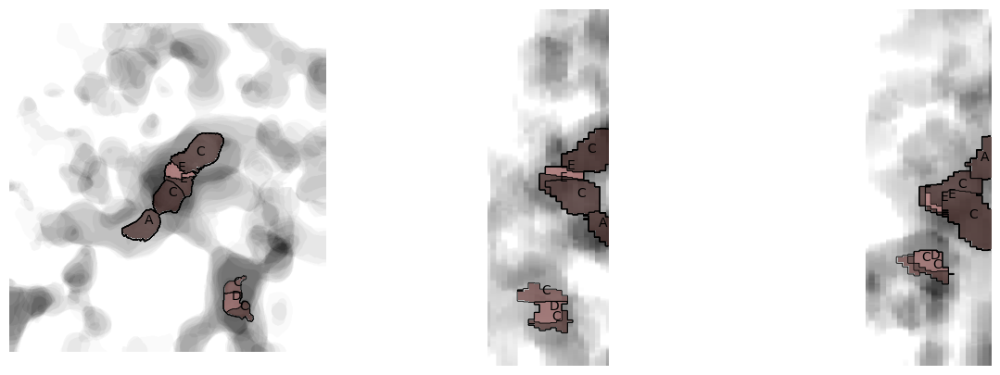

getting foreground mask from /mnt/d/vaibhav/Documentation/20251015_Documentation_Lung_XY0_roi1.h5 fmask channel 4
getting foreground mask from /mnt/d/vaibhav/Documentation/20251015_Documentation_Lung_XY0_roi1.h5 fmask channel 5


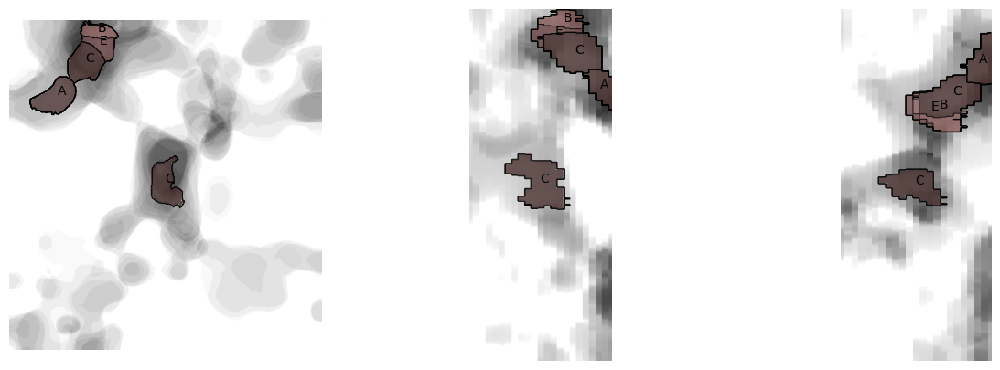

getting foreground mask from /mnt/d/vaibhav/Documentation/20251015_Documentation_Lung_XY0_roi2.h5 fmask channel 4
getting foreground mask from /mnt/d/vaibhav/Documentation/20251015_Documentation_Lung_XY0_roi2.h5 fmask channel 5


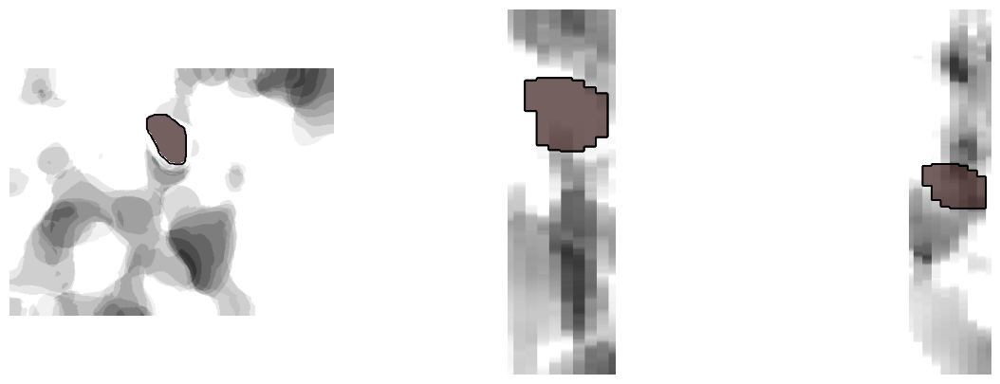

getting foreground mask from /mnt/d/vaibhav/Documentation/20251015_Documentation_Lung_XY1_roi0.h5 fmask channel 4
getting foreground mask from /mnt/d/vaibhav/Documentation/20251015_Documentation_Lung_XY1_roi0.h5 fmask channel 5


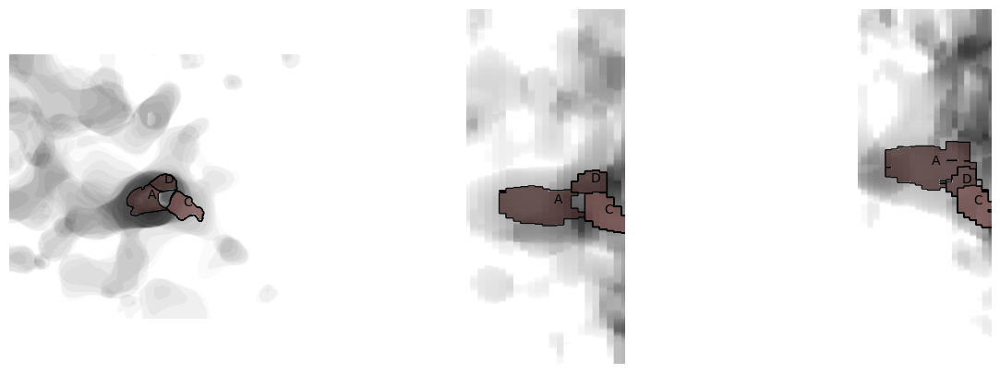

getting foreground mask from /mnt/d/vaibhav/Documentation/20251015_Documentation_Lung_XY1_roi1.h5 fmask channel 4
getting foreground mask from /mnt/d/vaibhav/Documentation/20251015_Documentation_Lung_XY1_roi1.h5 fmask channel 5


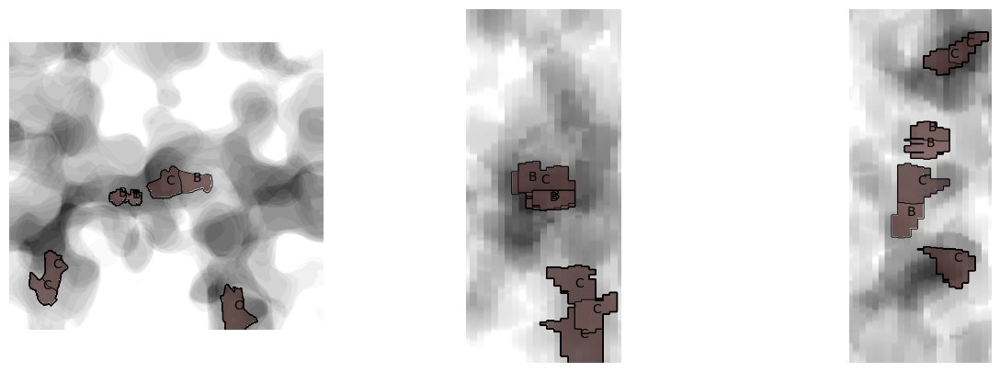

getting foreground mask from /mnt/d/vaibhav/Documentation/20251015_Documentation_Lung_XY1_roi2.h5 fmask channel 4
getting foreground mask from /mnt/d/vaibhav/Documentation/20251015_Documentation_Lung_XY1_roi2.h5 fmask channel 5


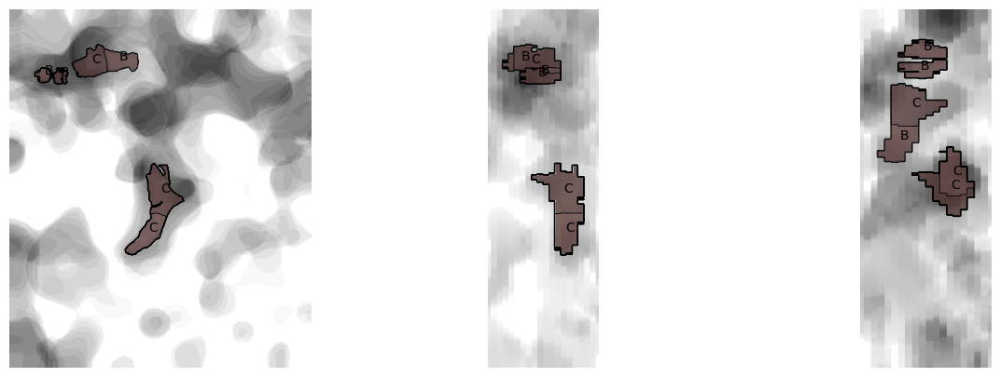

getting foreground mask from /mnt/d/vaibhav/Documentation/20251015_Documentation_Lung_XY1_roi3.h5 fmask channel 4
getting foreground mask from /mnt/d/vaibhav/Documentation/20251015_Documentation_Lung_XY1_roi3.h5 fmask channel 5


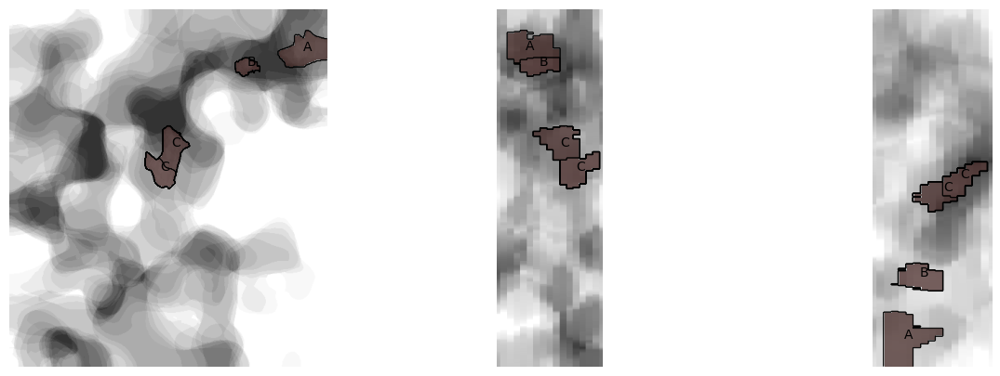

getting foreground mask from /mnt/d/vaibhav/Documentation/20251015_Documentation_Lung_XY2_roi0.h5 fmask channel 4
getting foreground mask from /mnt/d/vaibhav/Documentation/20251015_Documentation_Lung_XY2_roi0.h5 fmask channel 5


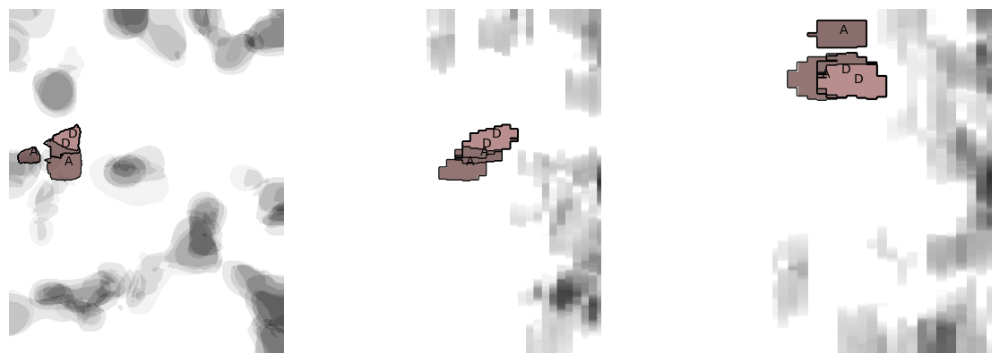

getting foreground mask from /mnt/d/vaibhav/Documentation/20251015_Documentation_Lung_XY3_roi0.h5 fmask channel 4
getting foreground mask from /mnt/d/vaibhav/Documentation/20251015_Documentation_Lung_XY3_roi0.h5 fmask channel 5


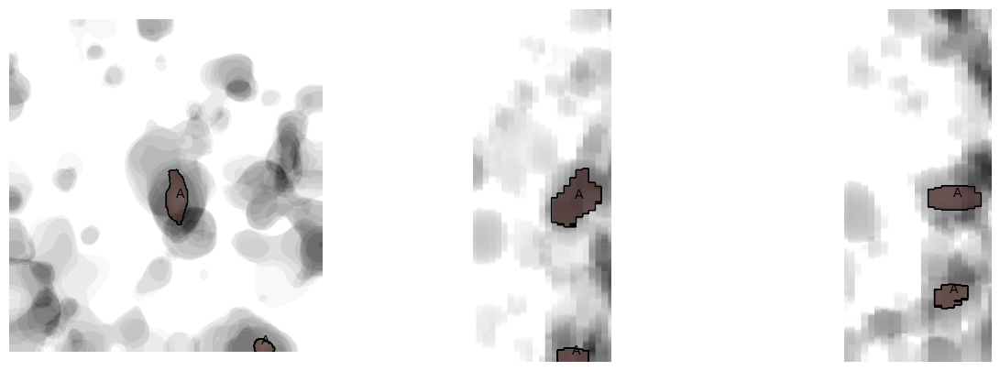

getting foreground mask from /mnt/d/vaibhav/Documentation/20251015_Documentation_Lung_XY3_roi1.h5 fmask channel 4
getting foreground mask from /mnt/d/vaibhav/Documentation/20251015_Documentation_Lung_XY3_roi1.h5 fmask channel 5


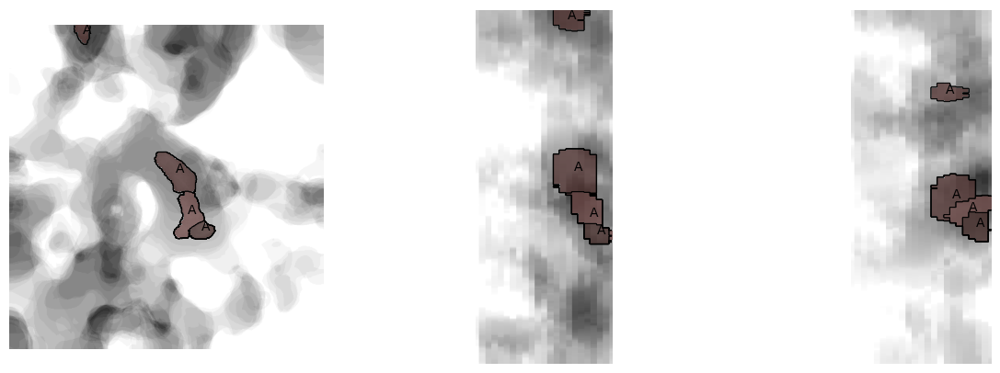

getting foreground mask from /mnt/d/vaibhav/Documentation/20251015_Documentation_Lung_XY3_roi2.h5 fmask channel 4
getting foreground mask from /mnt/d/vaibhav/Documentation/20251015_Documentation_Lung_XY3_roi2.h5 fmask channel 5


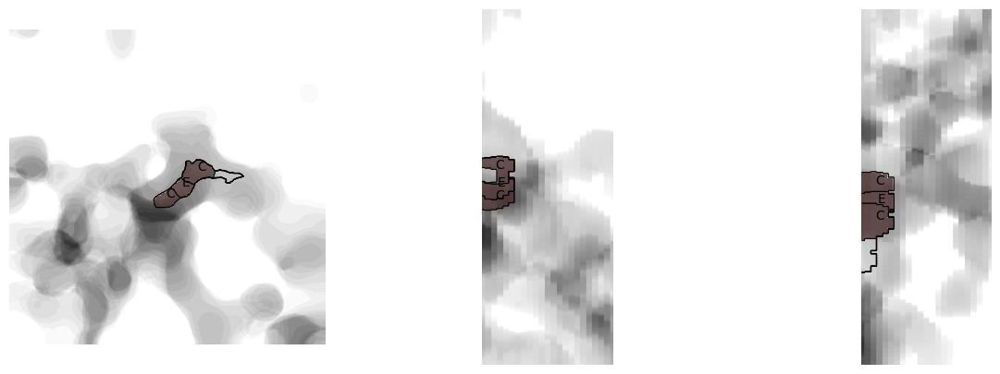

getting foreground mask from /mnt/d/vaibhav/Documentation/20251015_Documentation_Lung_XY3_roi3.h5 fmask channel 4
getting foreground mask from /mnt/d/vaibhav/Documentation/20251015_Documentation_Lung_XY3_roi3.h5 fmask channel 5


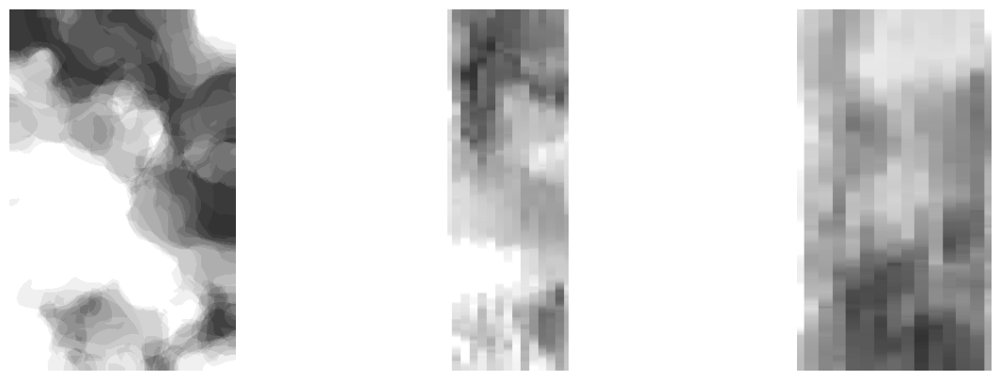

In [157]:
#new version rendered as image
vizpath=f'{date}/boundarystate_pics'
os.system(f'mkdir {vizpath}')
state_labels=np.array(list(string.ascii_uppercase))[0:nstates]
iframe=10
from adjustText import adjust_text
minc=2.
maxc=10.
import cmap
from cmap import Colormap
berlin=Colormap('berlin').to_mpl()
berlinlow=berlin(.5);berlinhigh=berlin(1.)
dxcmap=berlin=Colormap([berlinlow,berlinhigh]).to_mpl()
for imodel in indgood_models:
    sctm=modelSet[imodel]
    boundary_library=sctm.boundary_library.copy()
    cyto_msk_channel=np.where(sctm.mask_channels==np.array(['cyto']).astype('S32'))[0][0]
    try:
        nuc_fmsk_channel=np.where(sctm.fmask_channels==np.array(['nuc']).astype('S32'))[0][0]
        fore_fmsk_channel=np.where(sctm.fmask_channels==np.array(['foreground']).astype('S32'))[0][0] #this is where the error was, was also labeled nuc_fmsk_channel
    except Exception as e:
        print(e)
        nuc_msk_channel=np.where(sctm.mask_channels==np.array(['nuc']).astype('S32'))[0][0]
        fore_msk_channel=np.where(sctm.mask_channels==np.array(['nuc']).astype('S32'))[0][0]
        
    rep_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
    bf_img_channel=np.where(sctm.channels==np.array(['BF']).astype('S32'))[0][0]
    erk_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
    foreground_fmskchannel=np.where(sctm.fmask_channels==np.array(['foreground']).astype('S32'))[0][0]
    nuc_fmskchannel=np.where(sctm.fmask_channels==np.array(['nuc']).astype('S32'))[0][0]
    mskchannel=cyto_msk_channel; sctm.mskchannel=mskchannel
    cellinds=np.where(sctm.cells_frameSet==iframe)[0]
    img=sctm.get_image_data(iframe)
    msk=sctm.get_mask_data(iframe)
    fmsk_lung=sctm.get_fmask_data(iframe,channel=4)
    fmsk_cancer=sctm.get_fmask_data(iframe,channel=5)
    surfaces=[fmsk_lung,fmsk_cancer];np.array(surfaces).shape
    surface_label0=np.all(np.logical_not(np.array(surfaces)).astype(bool),axis=0)
    fmsk_airway=surface_label0.copy()
    border_scale=(sctm.micron_per_pixel/sctm.boundary_library['border_resolution'])*np.array([sctm.zscale,1,1])
    img_rep=img[...,erk_img_channel]
    msk_cyto=msk[...,cyto_msk_channel]
    msk_cyto=scipy.ndimage.zoom(msk[...,cyto_msk_channel],zoom=[sctm.zscale,1,1],order=0)
    fmsk_lung=scipy.ndimage.zoom(fmsk_lung,zoom=[sctm.zscale,1,1],order=0)
    fig,axs=plt.subplots(1,3,figsize=(15,5))
    axs.flatten()
    for i_ax in range(3):
        ax=axs[i_ax]
        h_axs=np.setdiff1d(np.arange(3),[i_ax]).astype(int)
        ax.imshow(np.sum(fmsk_lung,axis=i_ax).T,cmap=plt.cm.gray_r,alpha=.8)
        ax.contour(np.max(msk_cyto,axis=i_ax).T,colors='black',linewidths=.6,alpha=1.)
        cf=sctm.cancer_contact_fraction[cellinds]
        pf=sctm.primary_contact_fraction[cellinds]
        erkcn=sctm.x_signal[cellinds]
        indgood_erk=np.where(np.isfinite(erkcn))[0]
        erkcn[np.isnan(erkcn)]=0.
        dxcn=sctm.dx[cellinds]
        indgood_dx=np.where(np.isfinite(dxcn))[0]
        dxcn[np.isnan(dxcn)]=0.
        msk_cyto_proj=np.max(msk_cyto,axis=i_ax)
        msk_cyto_proj_blank=np.ones_like(msk_cyto_proj)==0
        img=np.zeros_like(msk_cyto_proj).astype('float')
        cellinds=cellinds[indgood_dx]
        for icell in range(cellinds.size):
            ic=cellinds[icell]
            indc=np.where(msk_cyto_proj==sctm.cells_labelidSet[ic])
            img[indc]=dxcn[indgood_dx[icell]]
            msk_cyto_proj_blank[indc]=True
        ax.imshow(np.ma.masked_where(msk_cyto_proj_blank==0,img).T,cmap=dxcmap,alpha=.75,vmin=-2.,vmax=12.)
        for istate in range(nstates):
            indcells_traj=inds_states[istate]
            indcells_model=np.where(indmodel_traj==imodel)[0]
            indcells_state_traj=np.intersect1d(indcells_traj,indcells_model)
            indcells_state_model=cellinds1_traj[indcells_state_traj]
            cellinds_state=np.intersect1d(cellinds,indcells_state_model)
            indboundary=np.where(np.isin(sctm.boundary_library['global_index'],cellinds_state))[0]
            pts=sctm.boundary_library['pts'][indboundary,:]
            pts[...,0]=(pts[...,0]/border_scale[0])*sctm.zscale
            pts[...,1]=pts[...,1]/border_scale[1]
            pts[...,2]=pts[...,2]/border_scale[2]
            for ic in cellinds_state:
                indc=np.where(sctm.boundary_library['global_index'][indboundary]==ic)[0]
                cpt=np.nanmean(pts[indc,:],axis=0)
                ax.text(cpt[h_axs[0]],cpt[h_axs[1]],state_labels[istate],color='black')
        #adjust_text(texts)
        ax.axis('off')
    plt.savefig(f'{vizpath}/boundarymap_dxcn_m{imodel}_frame{iframe}_c{ic}_{figid}.svg')
    plt.show()

In [158]:
import matplotlib.gridspec as gridspec
def notrans(arr):
    return arr

def rot_cw(arr):
    return np.fliplr(arr.T)

def rot2(arr):
    return np.flipud(arr)

def pcoord(x,n):
    return x

def ncoord(x,n):
    return n-x
    
transforms=[notrans,rot2,rot_cw]
coord_orders=[[0,1],[0,1],[1,0]]
htrans=[[pcoord,pcoord],[ncoord,pcoord],[pcoord,ncoord]]

In [159]:
#new version rendered as image
vizpath=f'{date}/boundarystate_movies'
os.system(f'mkdir {vizpath}')
state_labels=np.array(list(string.ascii_uppercase))[0:nstates]
from adjustText import adjust_text
minc=2.
maxc=10.
import cmap
from cmap import Colormap
berlin=Colormap('berlin').to_mpl()
berlinlow=berlin(.5);berlinhigh=berlin(1.)
dxcmap=berlin=Colormap([berlinlow,berlinhigh]).to_mpl()
for imodel in indgood_models[68:]: #[30,36,63,67,73,76,81]: #indgood_models: #[62,51,32,33,34,36]: #[89,78,83,#indgood_models:
    sctm=modelSet[imodel]
    for iframe in [0,1,2,3,6,9,12,15]: #range(sctm.nt):
        boundary_library=sctm.boundary_library.copy()
        cyto_msk_channel=np.where(sctm.mask_channels==np.array(['cyto']).astype('S32'))[0][0]
        nuc_img_channel=np.where(sctm.channels==np.array(['DAPI']).astype('S32'))[0][0]
        rep_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
        erk_img_channel=np.where(sctm.channels==np.array(['YFP']).astype('S32'))[0][0]
        akt_img_channel=np.where(sctm.channels==np.array(['TRITC']).astype('S32'))[0][0]
        foreground_fmskchannel=np.where(sctm.fmask_channels==np.array(['foreground']).astype('S32'))[0][0]
        nuc_fmskchannel=np.where(sctm.fmask_channels==np.array(['nuc']).astype('S32'))[0][0]
        mskchannel=cyto_msk_channel; sctm.mskchannel=mskchannel
        cellinds=np.where(sctm.cells_frameSet==iframe)[0]
        img=sctm.get_image_data(iframe)
        msk=sctm.get_mask_data(iframe)
        if len(sctm.fmask_channels)==2:
            fmsk_lung=sctm.get_fmask_data(iframe,channel=2)
            fmsk_cancer=sctm.get_fmask_data(iframe,channel=3)
        if len(sctm.fmask_channels)==4:
            fmsk_lung=sctm.get_fmask_data(iframe,channel=4)
            fmsk_cancer=sctm.get_fmask_data(iframe,channel=5)
        surfaces=[fmsk_lung,fmsk_cancer];np.array(surfaces).shape
        surface_label0=np.all(np.logical_not(np.array(surfaces)).astype(bool),axis=0)
        fmsk_airway=surface_label0.copy()
        border_scale=(sctm.micron_per_pixel/sctm.boundary_library['border_resolution'])*np.array([sctm.zscale,1,1])
        img_rep=img[...,erk_img_channel]
        msk_cyto=msk[...,cyto_msk_channel]
        msk_cyto=scipy.ndimage.zoom(msk[...,cyto_msk_channel],zoom=[sctm.zscale,1,1],order=0)
        fmsk_lung=scipy.ndimage.zoom(fmsk_lung,zoom=[sctm.zscale,1,1],order=0)
        fig = plt.figure(figsize=(10, 10))
        gs = gridspec.GridSpec(2, 2,width_ratios=[1,msk_cyto.shape[0]/msk_cyto.shape[1]],height_ratios=[1,msk_cyto.shape[0]/msk_cyto.shape[2]],
                               wspace=0.02, hspace=0.02)
        ax_z = fig.add_subplot(gs[0, 0])
        ax_y = fig.add_subplot(gs[0, 1]) #, sharey=ax_z)
        ax_x = fig.add_subplot(gs[1, 0]) #, sharex=ax_z)
        ax_blank = fig.add_subplot(gs[1, 1])  # unused
        ax_blank.axis('off')
        #axs.flatten()
        axs=[ax_z,ax_y,ax_x]
        for i_ax in range(3):
            ax=axs[i_ax]
            h_axs=np.setdiff1d(np.arange(3),[i_ax]).astype(int)
            nz=fmsk_lung.shape[i_ax]
            ax.imshow(transforms[i_ax](np.sum(fmsk_lung,axis=i_ax)).T,cmap=plt.cm.gray_r,alpha=.8,clim=(0,nz*.6))
            ax.contour(transforms[i_ax](np.max(msk_cyto,axis=i_ax)).T,colors='black',linewidths=.6,alpha=1.)
            cf=sctm.cancer_contact_fraction[cellinds]
            pf=sctm.primary_contact_fraction[cellinds]
            erkcn=sctm.x_signal[cellinds]
            indgood_erk=np.where(np.isfinite(erkcn))[0]
            erkcn[np.isnan(erkcn)]=0.
            dxcn=sctm.dx[cellinds]
            indgood_dx=np.where(np.isfinite(dxcn))[0]
            dxcn[np.isnan(dxcn)]=0.
            msk_cyto_proj=np.max(msk_cyto,axis=i_ax)
            msk_cyto_proj_blank=np.ones_like(msk_cyto_proj)==0
            img=np.zeros_like(msk_cyto_proj).astype('float')
            #for icell in range(cellinds.size):
            for istate in range(nstates):
                indcells_traj=inds_states[istate]
                indcells_model=np.where(indmodel_traj==imodel)[0]
                indcells_state_traj=np.intersect1d(indcells_traj,indcells_model)
                indcells_state_model=cellinds1_traj[indcells_state_traj]
                cellinds_state=np.intersect1d(cellinds,indcells_state_model)
                for icell in range(cellinds_state.size):
                    ic=cellinds_state[icell]
                    indc=np.where(msk_cyto_proj==sctm.cells_labelidSet[ic])
                    img[indc]=istate #pf[icell]
                    msk_cyto_proj_blank[indc]=True
            ax.imshow(transforms[i_ax](np.ma.masked_where(msk_cyto_proj_blank==0,img)).T,cmap=plt.cm.jet,alpha=.75,vmin=0,vmax=nstates-1)
            testimg=transforms[i_ax](np.ma.masked_where(msk_cyto_proj_blank==0,img)).T
            nx=testimg.shape[0];ny=testimg.shape[1]
            for istate in range(nstates):
                indcells_traj=inds_states[istate]
                indcells_model=np.where(indmodel_traj==imodel)[0]
                indcells_state_traj=np.intersect1d(indcells_traj,indcells_model)
                indcells_state_model=cellinds1_traj[indcells_state_traj]
                cellinds_state=np.intersect1d(cellinds,indcells_state_model)
                indboundary=np.where(np.isin(sctm.boundary_library['global_index'],cellinds_state))[0]
                pts=sctm.boundary_library['pts'][indboundary,:]
                pts[...,0]=(pts[...,0]/border_scale[0])*sctm.zscale
                pts[...,1]=pts[...,1]/border_scale[1]
                pts[...,2]=pts[...,2]/border_scale[2]
                for ic in cellinds_state:
                    indc=np.where(sctm.boundary_library['global_index'][indboundary]==ic)[0]
                    cpt=np.nanmean(pts[indc,:],axis=0)
                    ax.text(htrans[i_ax][0](cpt[h_axs[coord_orders[i_ax][0]]],ny),htrans[i_ax][1](cpt[h_axs[coord_orders[i_ax][1]]],nx),state_labels[istate],color='black')
            #adjust_text(texts)
            ax.axis('off')
        ax_z.set_title(f'm{imodel}: {tmSet[inds_tmSet_models[imodel]]} {iframe*timestep:.1f} hrs')
        plt.savefig(f'{vizpath}/boundarymap_states_m{imodel}_{figid}_f{iframe:04d}.png')
        plt.savefig(f'{vizpath}/boundarymap_states_m{imodel}_{figid}_f{iframe:04d}.svg')
        plt.show()

In [160]:
MtSet=[None]*nf
MtSetCG=[None]*nf
for imf in range(nf):
    print('building likelihood model for '+tmSet[imf])
    indmodels=np.where(inds_tmSet_models==imf)[0]
    indmodels=np.intersect1d(indmodels,indgood_models)
    indstm=np.array([]).astype(int)
    for i in indmodels: #[:-1]:
        indstm=np.append(indstm,np.where(inds_trajsteps_models==i)[0])
    MtSet[imf]=model.get_transition_matrix(x0set[indstm,:],x1set[indstm,:],clusters=clusters_minima);
    MtSetCG[imf]=model.get_transition_matrix_CG(x0set[indstm,:],x1set[indstm,:],clusters=clusters_minima,states=stateSet);

building likelihood model for Control Organoid
building likelihood model for Control Lung


In [161]:
nf=len(tmSet)
state_probs=np.zeros((nf,n_states))
nwindow=24
itimes=0
time_inds=np.arange(nwindow,modelSet[0].nt,nwindow).astype(int)
state_probs_times=np.zeros((nf,n_states,time_inds.size))
ntimes=time_inds.size
for itt in time_inds:
    fl=itt-nwindow
    fu=itt+nwindow
    indstw=np.where(np.logical_and(indframes_traj<fu,indframes_traj>fl))[0]
    for i in range(nf):
        indstm=inds_conditions[i]
        indstwm=np.intersect1d(indstm,indstw)
        x0=x[indstwm,:]
        indc0=stateSet[clusters_minima.assign(x0)]
        statesc,counts=np.unique(indc0,return_counts=True)
        state_probs[i,statesc]=counts/np.sum(counts)
    state_probs_times[:,:,itimes]=state_probs
    itimes=itimes+1

In [162]:

from matplotlib.colors import ListedColormap

colors = ['white'] + plt.cm.Reds(np.linspace(0, 1, 256)).tolist()  # 'white' for 0, 'Reds' for others
cmap = ListedColormap(colors)


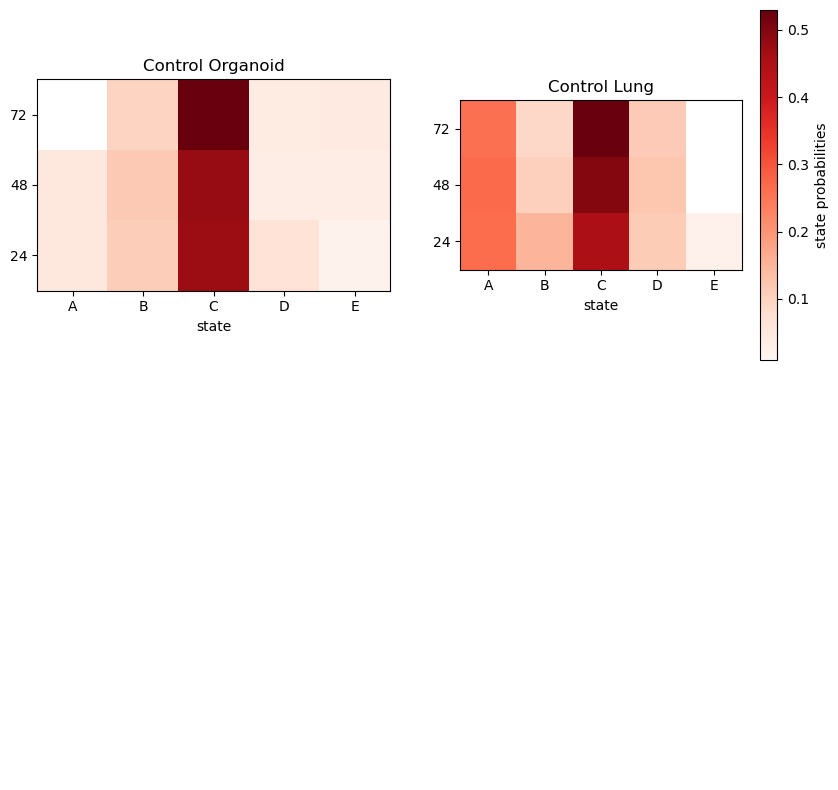

In [166]:
nplots=int(np.ceil(np.sqrt(nf)))
plt.figure(figsize=(10,10))
plt.axis('off')
plt.ylabel('frame')
colors = ['white'] + plt.cm.Reds(np.linspace(0, 1, 256)).tolist()  # 'white' for 0, 'Reds' for others
cmap = ListedColormap(colors)
for i_tm in range(nf):
    plt.subplot(nplots,nplots,i_tm+1)
    plt.imshow(state_probs_times[i_tm,:,:].T,origin='lower',cmap=cmap)
    ax=plt.gca()
    ax.set_yticks(np.arange(time_inds.size))
    ax.set_xticks(np.arange(nstates))
    ax.set_xticklabels(np.array(state_labels))
    ax.set_yticklabels(time_inds)
    plt.xlabel('state');

    plt.title(tmSet[i_tm])
cbar=plt.colorbar()
cbar.set_label('state probabilities')

plt.savefig(os.path.join(date, f'stateprobs_times_{figid}.png'))
plt.savefig(os.path.join(date, f'stateprobs_times_{figid}.svg'), format='svg')   

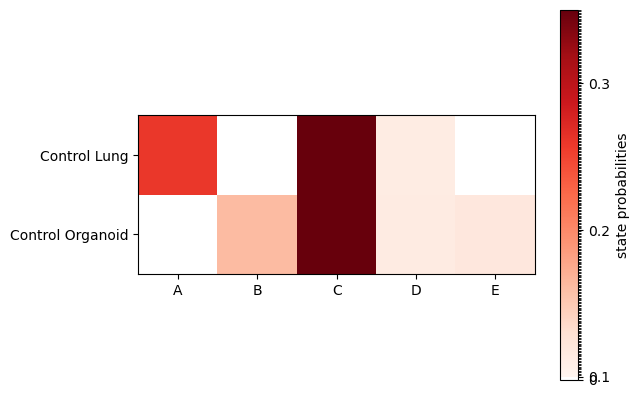

<Figure size 640x480 with 0 Axes>

In [167]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, BoundaryNorm

colors = ['white'] + plt.cm.Reds(np.linspace(0, 1, 256)).tolist()  # 'white' for 0, 'Reds' for others
cmap = ListedColormap(colors)

bounds = [0, 0.1] + list(np.linspace(0.1, 0.35, 256))
norm = BoundaryNorm(bounds, cmap.N)

# Plot the heatmap
plt.clf()
plt.imshow(state_probs_times[:, :, -1], origin='lower', cmap=cmap, norm=norm)

# Set up axis ticks and labels
ax = plt.gca()
ax.set_yticks(np.arange(nf))
ax.set_xticks(np.arange(nstates))
ax.set_xticklabels(np.array(state_labels))
ax.set_yticklabels(tmSet)

# Add colorbar
cbar = plt.colorbar()
cbar.set_label('state probabilities')
cbar.set_ticks([0,0.1, 0.2, 0.3])  # Define the tick positions
cbar.set_ticklabels(['0','0.1', '0.2', '0.3'])  # Define the tick labels

plt.show()
plt.savefig(os.path.join(date, f'stateprobs_unclustered{figid}.png'))
plt.savefig(os.path.join(date, f'stateprobs_unclustered{figid}.svg'), format='svg')   

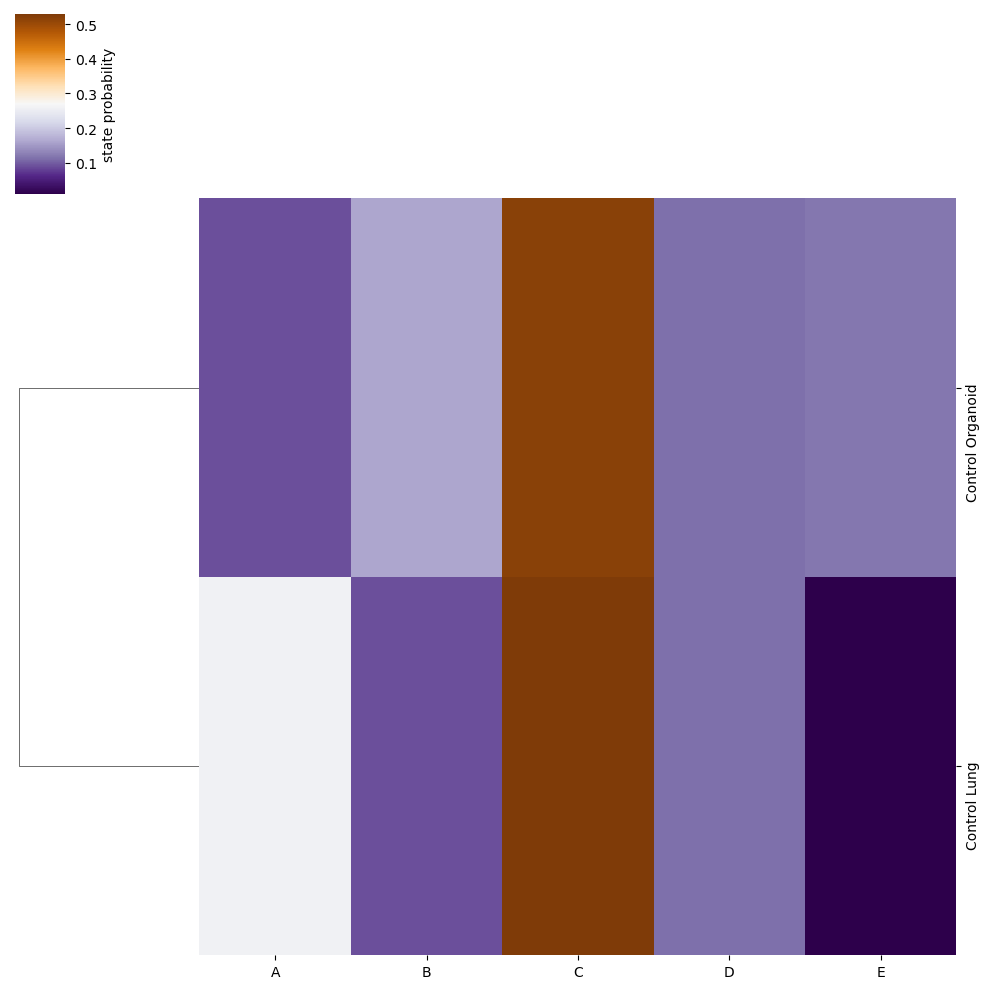

In [170]:
import pandas as pd
import seaborn as sns
tminds=np.array([0,1]).astype(int)
stateprob_df = pd.DataFrame(data=state_probs[tminds,:], index=np.array(tmSet)[tminds], columns=state_labels)

# Plot the clustermap without row clustering to preserve the treatment order
hmap = sns.clustermap(stateprob_df, cmap="PuOr_r", cbar_kws={'label': 'state probability'}, row_cluster=True,col_cluster=False)

# Show the plot
plt.savefig(os.path.join(date, f'stateprobs_seaborn_{figid}.png'))
plt.show()


/tmp/ipykernel_7906/187354584.py:6: RuntimeWarning: Mean of empty slice
  vsetList=[cratio_erk_traj,np.nanmean(cratio_erk_full_traj,axis=1),np.nanmean(cancer_cf_full_traj,axis=1),np.nanmean(primary_cf_full_traj,axis=1),np.nanmean(matrix_cf_full_traj,axis=1),indframes_traj,cratio_erk_var_traj,np.nanmean(dx_full_traj,axis=1)]#,dx_traj,beta_traj,alpha_traj,erk_akt_crosscorr]


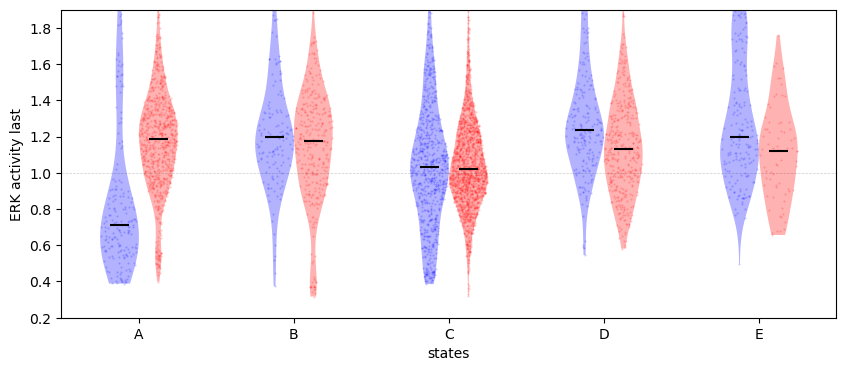

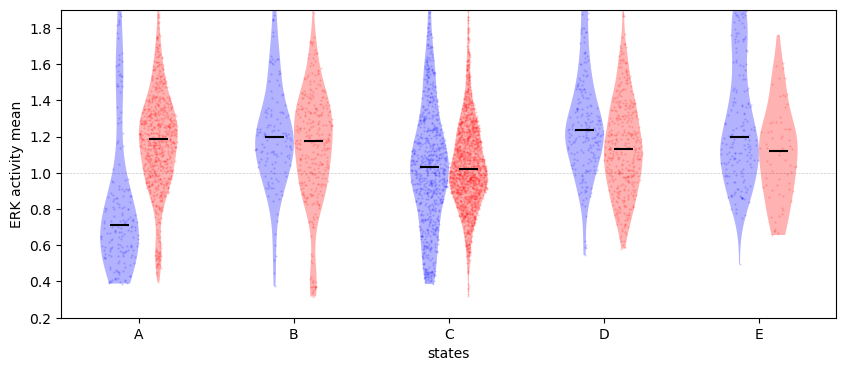

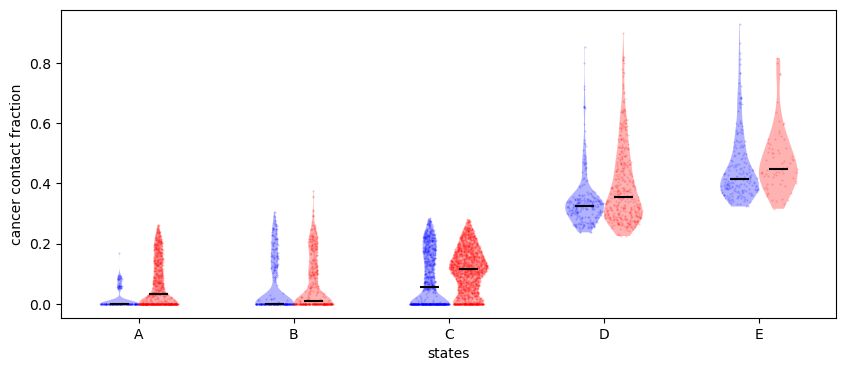

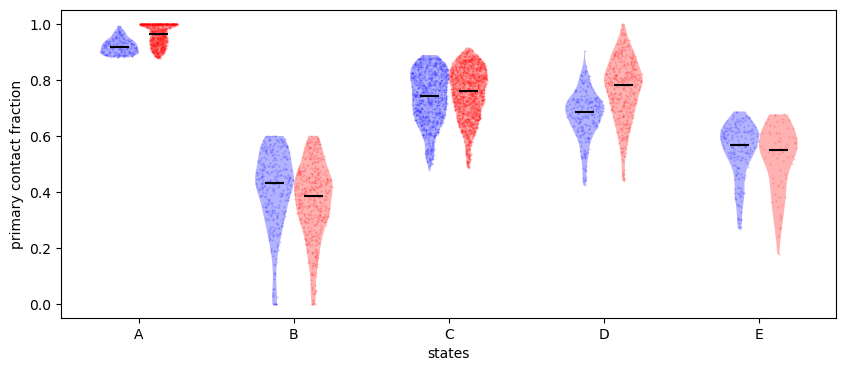

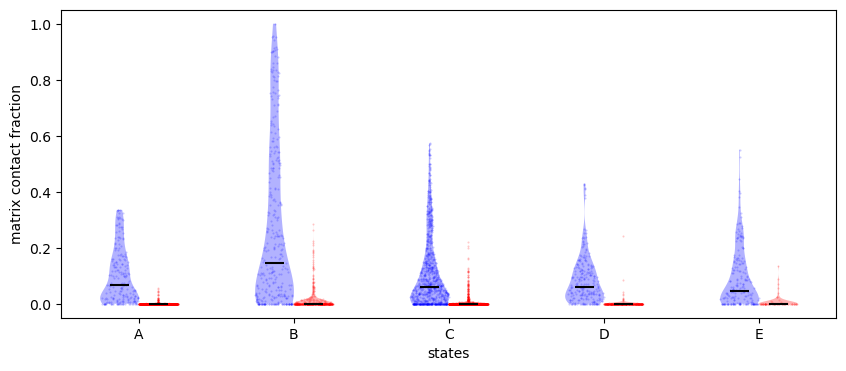

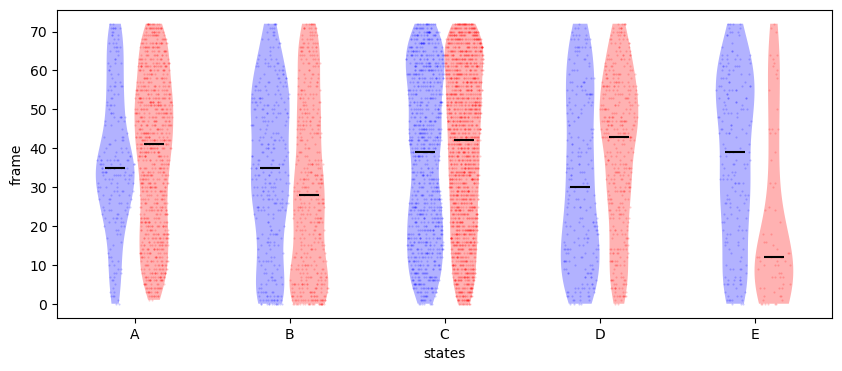

/home/wsltools/anaconda3/envs/celltraj_env/lib/python3.9/site-packages/imageprep.py:220: RuntimeWarning: invalid value encountered in divide
  img=(img-np.nanmean(img))/np.nanstd(img)


zero-size array to reduction operation minimum which has no identity


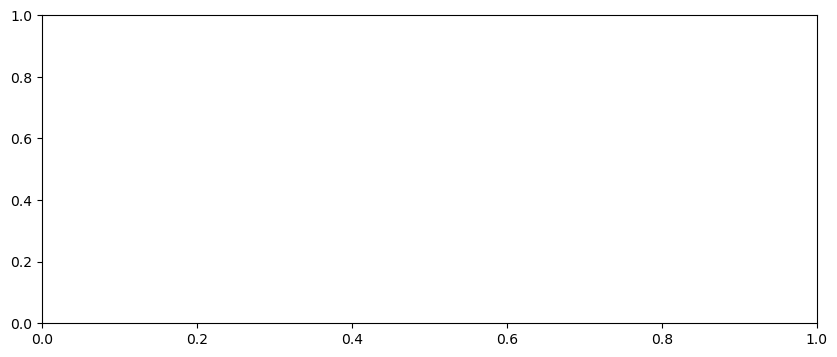

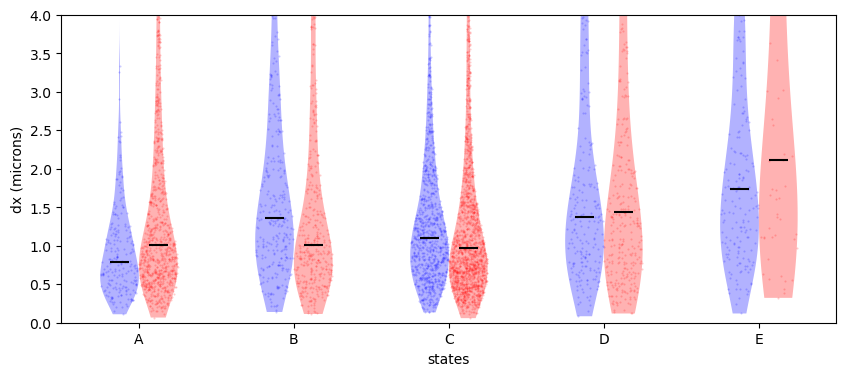

In [172]:
outcut=5.
indstm_show=np.array([0,1]).astype(int) #only show controls
plt.clf()
plt.close('all')

vsetList=[cratio_erk_traj,np.nanmean(cratio_erk_full_traj,axis=1),np.nanmean(cancer_cf_full_traj,axis=1),np.nanmean(primary_cf_full_traj,axis=1),np.nanmean(matrix_cf_full_traj,axis=1),indframes_traj,cratio_erk_var_traj,np.nanmean(dx_full_traj,axis=1)]#,dx_traj,beta_traj,alpha_traj,erk_akt_crosscorr]
captionset=['ERK activity last','ERK activity mean','cancer contact fraction','primary contact fraction','matrix contact fraction','frame','ERKvariability','dx (microns)'] #,'motility alignment (beta)','contact avoidance (alpha)','ERK-AKT timec ross-corr']

# Step 1: Calculate mean ERK activity and determine sorted order
activity = np.nanmean(cancer_cf_full_traj,axis=1)
mean_activity = []
for i in range(n_states):
    setv = activity[inds_states[i]]
    indgood=np.where(np.isfinite(setv))[0]
    setv = setv[indgood]
    mean_activity.append(np.mean(setv))

# Get sorted indices based on mean ERK activity
sorted_indices = np.arange(n_states).astype(int) #np.argsort(mean_activity)

for iv in range(len(vsetList)):
    try:
        vset = vsetList[iv]
        plt.figure(figsize=(10, 4))
        ax = plt.gca()
    
        # Plot violin plots in the order of sorted mean ERK activity
        for sorted_index in range(n_states):
            i = sorted_indices[sorted_index]  # Get the correct state index from the sorted order
            setv = vset[inds_states[i]]
            indgood=np.where(np.isfinite(setv))[0]
            indin=np.where(imprep.znorm(setv)<outcut)[0]
            indgood=np.intersect1d(indgood,indin)
            setv = setv[indgood]
            ind_tm=inds_tmSet_models[indmodel_traj[inds_states[i][indgood]]]
            indin_tm=np.where(np.isin(ind_tm,indstm_show))[0]
            ind_tm=ind_tm[indin_tm]
            setv = setv[indin_tm]
            for ishow in range(indstm_show.size):
                i_tm=indstm_show[ishow]
                vplot = ax.violinplot(setv[ind_tm==i_tm], positions=[2*sorted_index + 1+.5*(ishow-.5)], showmedians=True, showextrema=False)
                vplot['cmedians'].set_color('black')    
                for pc in vplot['bodies']:
                    pc.set_facecolor(colorSet[i_tm])
                xpoints=np.array(utilities.generate_xcoords_violin(vplot,[setv[ind_tm==i_tm]]))
                plt.scatter(xpoints,setv[ind_tm==i_tm],s=1,c=colorSet[i_tm],marker='.',alpha=.2)

        # Reorder state labels based on the sorted order
        sorted_labels = [state_labels[i] for i in sorted_indices]
    
        ax.set_xticks(range(1, 2*n_states + 1,2))
        ax.set_xticklabels(sorted_labels)
    
        plt.ylabel(captionset[iv])
        plt.xlabel('states')
        if captionset[iv][0:3]=='ERK':
            plt.ylim(.2,1.9)
            plt.plot([-100,100],[1,1],'k--',linewidth=.5,alpha=.2)
        if captionset[iv][0:2]=='dx':
            plt.ylim(0.,4.)
        # Save or display the figure
        plt.xlim(0,2*n_states)
        plt.savefig(os.path.join(date + '/' + captionset[iv] + '_tearplot_glandlung_' + figid + '.png'))
        plt.savefig(os.path.join(date + '/' + captionset[iv] + '_tearplot_glandlung_' + figid + '.svg'), format='svg')
        plt.pause(0.5)
    except Exception as e:
        print(e)

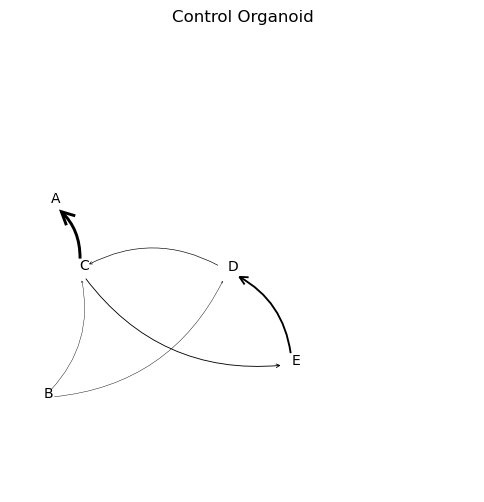

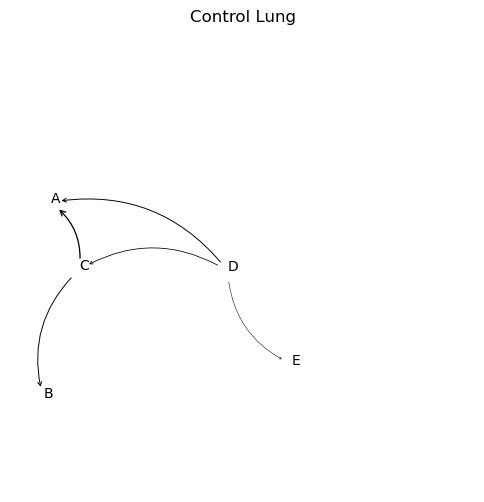

In [173]:
pcut=.01
fcut=.001
rad=.3
mscale=2200
arrowstyle='->'
lws=200.
sh=8
state_centers=state_centers_minima
fl=0
fu=180
indstw_all=np.where(np.logical_and(indframes_traj<fu,indframes_traj>fl))[0]
xmin=np.min(x_clusters[:,0])
xmax=np.max(x_clusters[:,0])
ymin=np.min(x_clusters[:,1])
ymax=np.max(x_clusters[:,1])
for i in range(nf):
    plt.figure(figsize=(6,6))
    indmodels=np.where(inds_tmSet_models==i)[0]
    indstm=np.array([]).astype(int)
    for imodel in indmodels:
        indstm=np.append(indstm,np.where(inds_trajsteps_models==imodel)[0].astype(int))
    x0=x0set[indstm,:]
    x1=x1set[indstm,:]
    Mt=model.get_transition_matrix_CG(x0,x1,clusters_minima,stateSet)
    ax=plt.gca()
    for j in range(n_states):
        for k in range(n_states):
            fluxjk=state_probs[i,j]*Mt[j,k]
            fluxkj=state_probs[i,k]*Mt[k,j]
            flux=fluxjk-fluxkj
            if j<k and flux>fcut and state_probs[i,j]>pcut: #Mt[j,k]>pcut:
                arrow = matplotlib.patches.FancyArrowPatch((state_centers[j,0], state_centers[j,1]), (state_centers[k,0], state_centers[k,1]),shrinkA=sh,shrinkB=sh,mutation_scale=mscale*flux,color='black',arrowstyle=arrowstyle,connectionstyle='arc3,rad='+str(rad),lw=lws*flux,joinstyle='miter',capstyle='butt') #note j and k flipped because drawing arrow at tail
                ax.add_patch(arrow)
            if j>k and flux>fcut and state_probs[i,j]>pcut: #Mt[j,k]>pcut:
                arrow = matplotlib.patches.FancyArrowPatch((state_centers[j,0], state_centers[j,1]), (state_centers[k,0], state_centers[k,1]),shrinkA=sh,shrinkB=sh,mutation_scale=mscale*flux,color='black',arrowstyle=arrowstyle,connectionstyle='arc3,rad='+str(rad),lw=lws*flux,joinstyle='miter',capstyle='butt')
                ax.add_patch(arrow)
        plt.text(state_centers[j,0],state_centers[j,1],state_labels[j],color='black',ma='center')
    plt.xlim(xmin,xmax)
    plt.ylim(ymin,ymax+.5)
    plt.axis('off')
    plt.title(tmSet[i])
    plt.savefig(date+'/networkflux_'+figid+'_nS'+str(nstates)+'_'+tmSet[i]+'.png')
    plt.savefig(date+'/networkflux_'+figid+'_nS'+str(nstates)+'_'+tmSet[i]+'.svg')
    plt.pause(.1)